In [2]:
%%capture
!pip install scanpy
!pip install KDEpy
!pip install leidenalg

In [3]:
%%capture
# Remember to restart the kernel once installed
!pip install -e ../../../tools/nomad/

In [1]:
import os
import sys
from datetime import datetime

import pandas as pd
import scanpy as sc
import anndata as ad
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.transforms as mtransforms
import scipy.sparse as sps
from scipy.stats import spearmanr

# to be able to import from tools dir
module_path = os.path.abspath(os.path.join('../../..'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
import tools.util_probe as up
import tools.util as ut
import tools.NB_est as nb
import tools.countsplit as cs
import tools.scDEED as scd
import tools.clustering_opt as co
import tools.util_plot as nmd_plot

import fi_nomad as nmd
from fi_nomad.types import kernelInputTypes
from fi_nomad.types import KernelStrategy
from fi_nomad.types import InitializationStrategy

import warnings
warnings.filterwarnings("ignore")

from scipy.stats import kendalltau, pearsonr
import importlib
import logging

import pickle as pkl

In [30]:
REFIT_EVERYTHING = False

In [2]:
# logging has to manually turned on to see nomad output
logging.basicConfig(level=logging.INFO)

In [4]:
if REFIT_EVERYTHING:

    data_all_pca = sc.read_h5ad("../../../data/MOBA_scRNAseq/MOBA_intermediate_results/export_s3.h5ad")
    data = sc.read_h5ad("../../../data/MOBA_scRNAseq/MOBA_intermediate_results/S3_filtered_with_counts.h5ad")

In [2]:
# data = sc.read_h5ad("./S3_NMD_counts_norm_r1r2_PCA.h5ad")
data = sc.read_h5ad("./S3_NMD_finished.h5ad")

In [6]:
if REFIT_EVERYTHING:
    data.X = data.layers["counts"].copy()

    # Normalizes X, such that: each barcode has total count equal to median of total counts before normalization
    sc.pp.normalize_total(data, target_sum=None, layer=None)

    # Only normalization
    data.layers["normalized_counts"] = data.X.copy()

In [258]:
data.obs.keys()

Index(['n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts',
       'log1p_total_counts', 'outlier', 'n_genes', 'total_counts_norm',
       'total_counts_scale', 'leiden_opt_pca'],
      dtype='object')

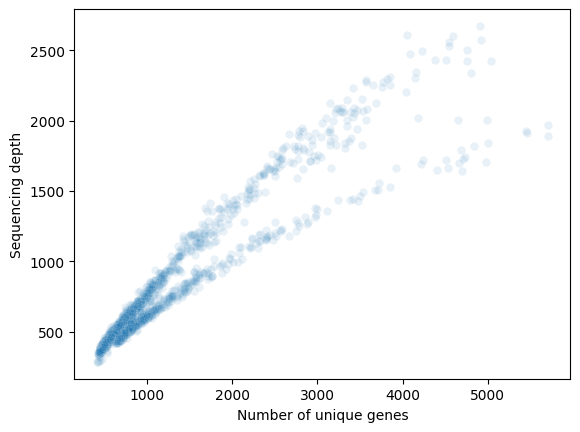

In [14]:
sequencingdepth_uniquegenes = sns.scatterplot(x=data.obs["total_counts"], 
                                              y=data.obs["n_genes_by_counts"], 
                                              alpha=0.1)

plt.xlabel("Number of unique genes")
plt.ylabel("Sequencing depth")
plt.savefig("./S3/sequencingdepth_uniquegenes.svg", format="svg")

plt.show()

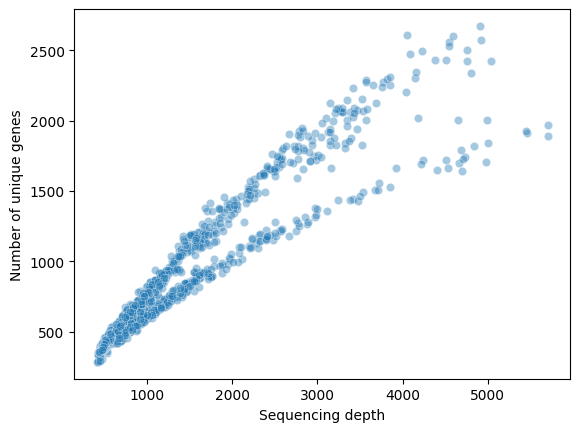

In [62]:
sequencingdepth_uniquegenes = sns.scatterplot(x=data.obs["total_counts"], 
                                              y=data.obs["n_genes_by_counts"], 
                                              alpha=0.4)

plt.ylabel("Number of unique genes")
plt.xlabel("Sequencing depth")
plt.savefig("./S3/sequencingdepth_uniquegenes_alpha_higher.svg", format="svg")

plt.show()

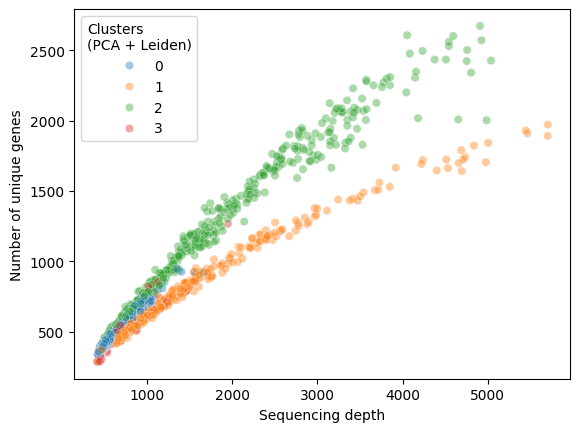

In [61]:
fig, ax = plt.subplots()
sequencingdepth_uniquegenes_pca_cluster = sns.scatterplot(x=data.obs["total_counts"], 
                                              y=data.obs["n_genes_by_counts"], 
                                              alpha=0.4, hue=data.obs["pca_leiden_opt"], palette="tab10")

plt.ylabel("Number of unique genes")
plt.xlabel("Sequencing depth")
ax.legend_.set_title("Clusters\n(PCA + Leiden)")
plt.savefig("./S3/sequencingdepth_uniquegenes_pca_cluster.svg", format="svg")

plt.show()

In [18]:
sns.palettes("top10")

TypeError: 'module' object is not callable

Text(0.5, 1.0, '')

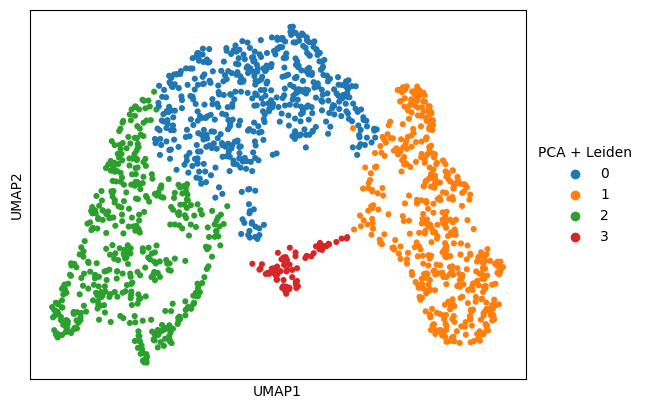

In [19]:
umap_pca_leiden_opt = sc.pl.umap(data, color="pca_leiden_opt", return_fig=True, palette=sns.color_palette("tab10"))
ax = umap_pca_leiden_opt.axes[0]
ax.legend_.set_title("PCA + Leiden")
ax.set_title(None)

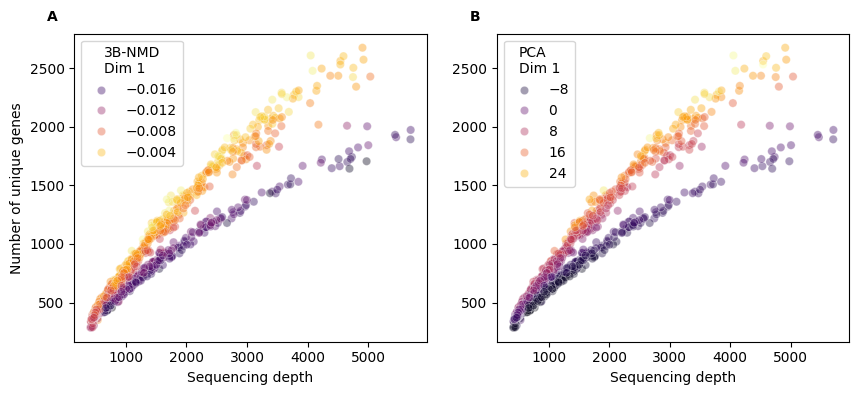

In [32]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=[10, 4])
sns.scatterplot(x=data.obs["total_counts"], 
                y=data.obs["n_genes_by_counts"], 
                hue=data.obsm["X_nmd_norm_r1"][:,:1].flatten(),
                alpha=0.4, palette="inferno", ax=ax1)
ax1.set_ylabel("Number of unique genes")
ax1.set_xlabel("Sequencing depth")
ax1.legend_.set_title("3B-NMD\nDim 1")
trans = mtransforms.ScaledTranslation(-20/72, 7/72, fig.dpi_scale_trans)
ax1.text(0.0, 1.0, "A", transform=ax1.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")

sns.scatterplot(x=data.obs["total_counts"], 
                y=data.obs["n_genes_by_counts"], 
                hue=data.obsm["X_pca"][:,:1].flatten(),
                alpha=0.4, palette="inferno", ax=ax2)
ax2.set_ylabel(None)
ax2.set_xlabel("Sequencing depth")
ax2.legend_.set_title("PCA\nDim 1")
ax2.text(0.0, 1.0, "B", transform=ax2.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")
plt.savefig("./S3/figures/sequencingdepth_uniquegenes_hueNMD_PCA_norm_r1_alphaHigh.svg", format="svg")
#plt.savefig("./S3/figures/sequencingdepth_uniquegenes_hueNMD_PCA_norm_r1.png", format="png", dpi=300)
plt.show()

In [43]:
displot_df = pd.DataFrame.from_dict({
    "PCA Dim 1": data.obsm["X_pca"][:,:1].flatten().copy(),
    "3B-NMD Dim 1": data.obsm["X_nmd_norm_r1"][:,:1].flatten().copy(),
    "Clusters\n(PCA + Leiden)": data.obs["pca_leiden_opt"].copy()
})

In [49]:
displot_long_df = pd.melt(displot_df, value_vars=["PCA Dim 1", "3B-NMD Dim 1"], id_vars="Clusters\n(PCA + Leiden)")

In [50]:
displot_long_df.head()

,Clusters\n(PCA + Leiden),variable,value
0,0,PCA Dim 1,-2.863871
1,1,PCA Dim 1,-8.730270
2,0,PCA Dim 1,-1.249765
3,1,PCA Dim 1,-9.224742
4,2,PCA Dim 1,7.102530


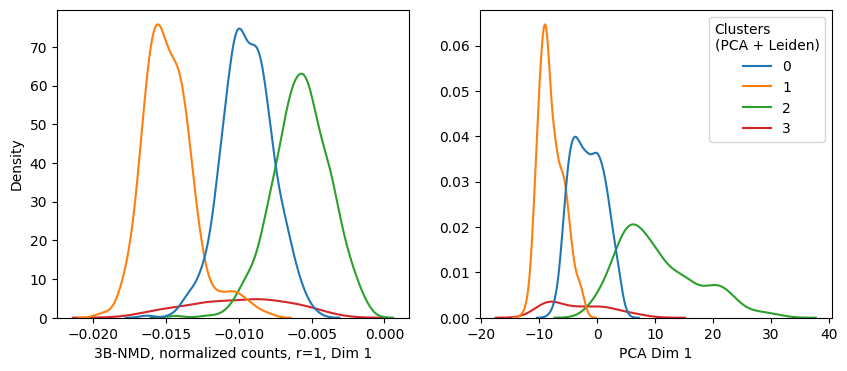

In [57]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=[10, 4], sharey=False)
sns.kdeplot(x=data.obsm["X_nmd_norm_r1"][:,:1].flatten(), 
                hue=data.obs["pca_leiden_opt"],
                alpha=1.0, palette="tab10", ax=ax1, legend=False)
ax1.set_xlabel("3B-NMD, normalized counts, r=1, Dim 1")

sns.kdeplot(x=data.obsm["X_pca"][:,:1].flatten(), 
                hue=data.obs["pca_leiden_opt"],
                alpha=1.0, palette="tab10", ax=ax2)
ax2.set_ylabel(None)
ax2.set_xlabel("PCA Dim 1")
ax2.legend_.set_title("Clusters\n(PCA + Leiden)")

plt.savefig("./S3/figures/3BNMD_r1_vs_pca_dim1_huePCA_Leiden.svg", format="svg")

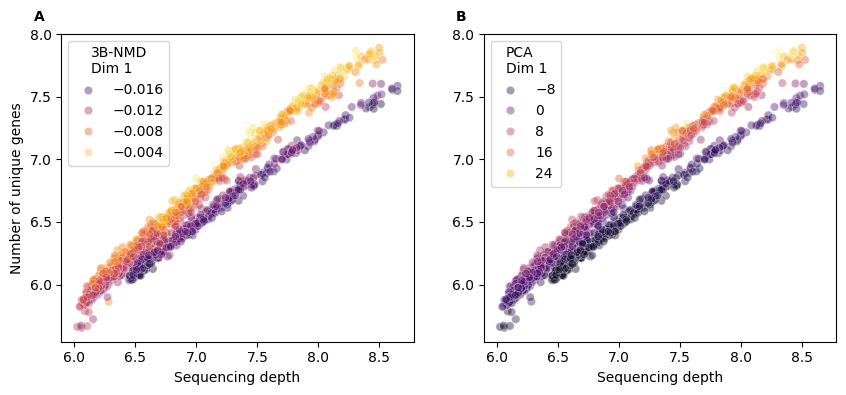

In [15]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=[10, 4])
sns.scatterplot(x=np.log(data.obs["total_counts"]), 
                y=np.log(data.obs["n_genes_by_counts"]), 
                hue=data.obsm["X_nmd_norm_r1"][:,:1].flatten(),
                alpha=0.4, palette="inferno", ax=ax1)
ax1.set_ylabel("Number of unique genes")
ax1.set_xlabel("Sequencing depth")
ax1.legend_.set_title("3B-NMD\nDim 1")
trans = mtransforms.ScaledTranslation(-20/72, 7/72, fig.dpi_scale_trans)
ax1.text(0.0, 1.0, "A", transform=ax1.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")

sns.scatterplot(x=np.log(data.obs["total_counts"]), 
                y=np.log(data.obs["n_genes_by_counts"]), 
                hue=data.obsm["X_pca"][:,:1].flatten(),
                alpha=0.4, palette="inferno", ax=ax2)
ax2.set_ylabel(None)
ax2.set_xlabel("Sequencing depth")
ax2.legend_.set_title("PCA\nDim 1")
ax2.text(0.0, 1.0, "B", transform=ax2.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")
#plt.savefig("./S3/figures/sequencingdepth_uniquegenes_hueNMD_PCA_norm_r1_alphaHigh.svg", format="svg")
#plt.savefig("./S3/figures/sequencingdepth_uniquegenes_hueNMD_PCA_norm_r1.png", format="png", dpi=300)
plt.show()

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=[10, 4])
sns.scatterplot(x=data.obs["total_counts"], 
                y=data.obs["n_genes_by_counts"], 
                hue=data.obsm["X_nmd_norm_r1"][:,:1].flatten(),
                alpha=0.4, palette="inferno", ax=ax1)
ax1.set_ylabel("Number of unique genes")
ax1.set_xlabel("Sequencing depth")
ax1.legend_.set_title("3B-NMD\nDim 1")
trans = mtransforms.ScaledTranslation(-20/72, 7/72, fig.dpi_scale_trans)
ax1.text(0.0, 1.0, "A", transform=ax1.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")

sns.scatterplot(x=data.obs["total_counts"], 
                y=data.obs["n_genes_by_counts"], 
                hue=data.obsm["X_pca"][:,:1].flatten(),
                alpha=0.4, palette="inferno", ax=ax2)
ax2.set_ylabel(None)
ax2.set_xlabel("Sequencing depth")
ax2.legend_.set_title("PCA\nDim 1")
ax2.text(0.0, 1.0, "B", transform=ax2.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")
plt.savefig("./S3/figures/sequencingdepth_uniquegenes_hueNMD_PCA_norm_r1.svg", format="svg")
plt.savefig("./S3/figures/sequencingdepth_uniquegenes_hueNMD_PCA_norm_r1.png", format="png", dpi=300)
plt.show()

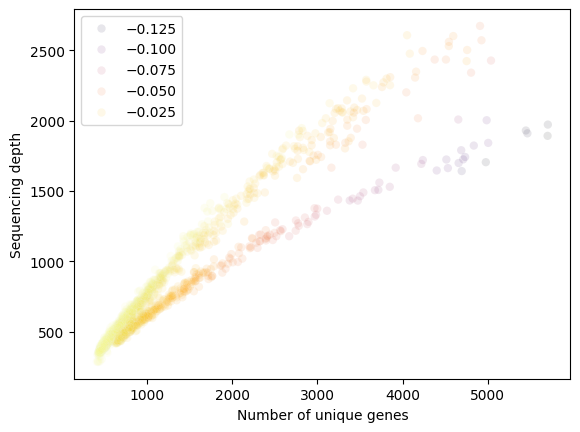

In [12]:
sequencingdepth_uniquegenes = sns.scatterplot(x=data.obs["total_counts"], 
                                              y=data.obs["n_genes_by_counts"], 
                                              hue=data.obsm["X_nmd_counts_r2"][:,:1].flatten(),
                                              alpha=0.1, palette="inferno")

plt.xlabel("Number of unique genes")
plt.ylabel("Sequencing depth")
plt.savefig("./S3/sequencingdepth_uniquegenes_hueNMD_counts_dim1.svg", format="svg")

plt.show()

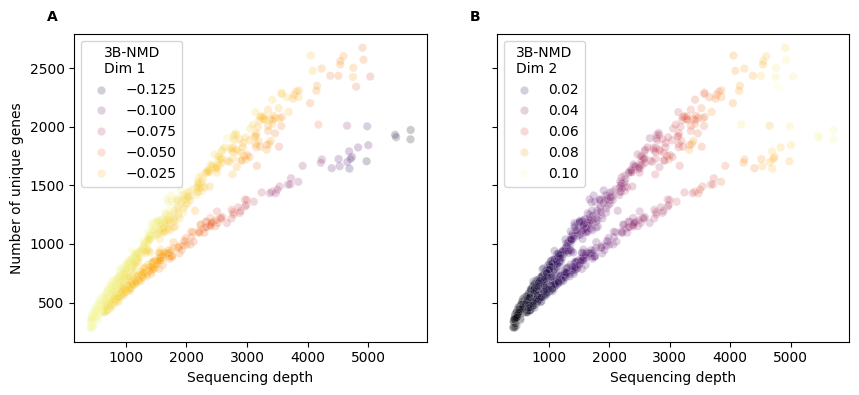

In [27]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=[10, 4], sharex=True, sharey=True)
sns.scatterplot(x=data.obs["total_counts"], 
                y=data.obs["n_genes_by_counts"], 
                hue=data.obsm["X_nmd_counts_r2"][:,:1].flatten(),
                alpha=0.2, palette="inferno", ax=ax1)
ax1.set_ylabel("Number of unique genes")
ax1.set_xlabel("Sequencing depth")
ax1.legend_.set_title("3B-NMD\nDim 1")
trans = mtransforms.ScaledTranslation(-20/72, 7/72, fig.dpi_scale_trans)
ax1.text(0.0, 1.0, "A", transform=ax1.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")

sns.scatterplot(x=data.obs["total_counts"], 
                y=data.obs["n_genes_by_counts"], 
                hue=data.obsm["X_nmd_counts_r2"][:,1:2].flatten(),
                alpha=0.2, palette="inferno", ax=ax2)
ax2.set_ylabel(None)
ax2.set_xlabel("Sequencing depth")
ax2.legend_.set_title("3B-NMD\nDim 2")
ax2.text(0.0, 1.0, "B", transform=ax2.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")
plt.savefig("./S3/figures/sequencingdepth_uniquegenes_hueNMD_counts.svg", format="svg")
plt.savefig("./S3/figures/sequencingdepth_uniquegenes_hueNMD_counts.png", format="png", dpi=300)
plt.show()

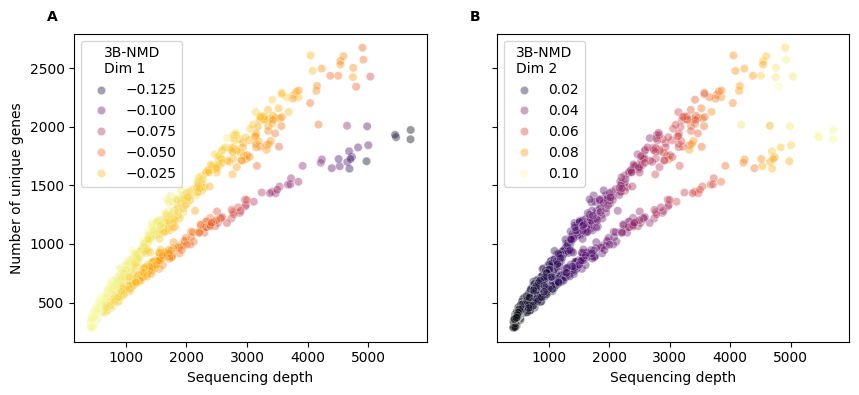

In [12]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=[10, 4], sharex=True, sharey=True)
sns.scatterplot(x=data.obs["total_counts"], 
                y=data.obs["n_genes_by_counts"], 
                hue=data.obsm["X_nmd_counts_r2"][:,:1].flatten(),
                alpha=0.4, palette="inferno", ax=ax1)
ax1.set_ylabel("Number of unique genes")
ax1.set_xlabel("Sequencing depth")
ax1.legend_.set_title("3B-NMD\nDim 1")
trans = mtransforms.ScaledTranslation(-20/72, 7/72, fig.dpi_scale_trans)
ax1.text(0.0, 1.0, "A", transform=ax1.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")

sns.scatterplot(x=data.obs["total_counts"], 
                y=data.obs["n_genes_by_counts"], 
                hue=data.obsm["X_nmd_counts_r2"][:,1:2].flatten(),
                alpha=0.4, palette="inferno", ax=ax2)
ax2.set_ylabel(None)
ax2.set_xlabel("Sequencing depth")
ax2.legend_.set_title("3B-NMD\nDim 2")
ax2.text(0.0, 1.0, "B", transform=ax2.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")
plt.savefig("./S3/figures/sequencingdepth_uniquegenes_hueNMD_counts_alphaHigh.svg", format="svg")
#plt.savefig("./S3/figures/sequencingdepth_uniquegenes_hueNMD_counts.png", format="png", dpi=300)
plt.show()

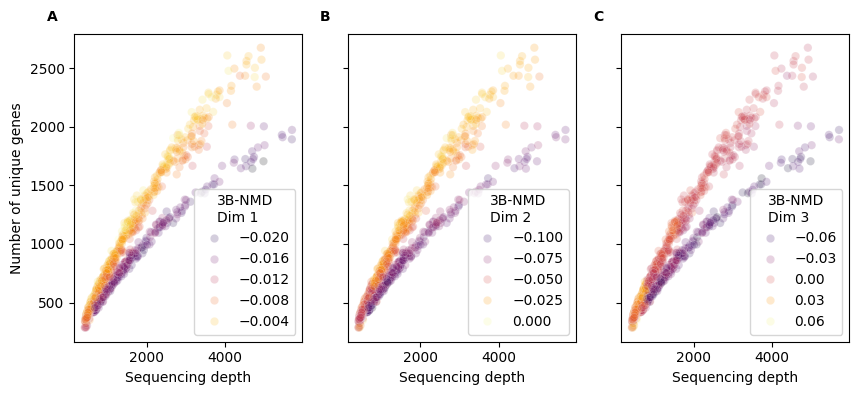

In [29]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=[10, 4], sharex=True, sharey=True)
sns.scatterplot(x=data.obs["total_counts"], 
                y=data.obs["n_genes_by_counts"], 
                hue=data.obsm["X_nmd_norm_r3"][:,:1].flatten(),
                alpha=0.2, palette="inferno", ax=ax1)
ax1.set_ylabel("Number of unique genes")
ax1.set_xlabel("Sequencing depth")
ax1.legend_.set_title("3B-NMD\nDim 1")
trans = mtransforms.ScaledTranslation(-20/72, 7/72, fig.dpi_scale_trans)
ax1.text(0.0, 1.0, "A", transform=ax1.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")

sns.scatterplot(x=data.obs["total_counts"], 
                y=data.obs["n_genes_by_counts"], 
                hue=data.obsm["X_nmd_norm_r3"][:,1:2].flatten(),
                alpha=0.2, palette="inferno", ax=ax2)
ax2.set_ylabel(None)
ax2.set_xlabel("Sequencing depth")
ax2.legend_.set_title("3B-NMD\nDim 2")
ax2.text(0.0, 1.0, "B", transform=ax2.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")

sns.scatterplot(x=data.obs["total_counts"], 
                y=data.obs["n_genes_by_counts"], 
                hue=data.obsm["X_nmd_norm_r3"][:,2:3].flatten(),
                alpha=0.2, palette="inferno", ax=ax3)
ax3.set_ylabel(None)
ax3.set_xlabel("Sequencing depth")
ax3.legend_.set_title("3B-NMD\nDim 3")
ax3.text(0.0, 1.0, "C", transform=ax3.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")

#plt.savefig("./S3/figures/sequencingdepth_uniquegenes_hueNMD_counts.svg", format="svg")
#plt.savefig("./S3/figures/sequencingdepth_uniquegenes_hueNMD_counts.png", format="png", dpi=300)
plt.show()

## Analysing Counts

### Search latent dimension and beta with nomad

In [31]:
data_train_counts, data_test_counts = cs.countsplit_adata(
    data, data_dist="NB", beta_key="nb_overdisp_cutoff", 
    layer="counts", min_genes=1, max_counts=1e9, seed=1535741)

In [32]:
# Transformation, centering and PCA
sc.pp.normalize_total(data_train_counts, target_sum=None, layer=None)
data_train_counts.X = sps.csr_matrix(np.log(data_train_counts.X.toarray() + np.array(data_train_counts.var["nb_overdisp_cutoff"] / 4)))
data_train_counts.layers["vst_counts"] = data_train_counts.X.copy()
sc.pp.scale(data_train_counts, max_value=10, zero_center=True)
sc.tl.pca(data_train_counts, svd_solver='arpack')


sc.pp.normalize_total(data_test_counts, target_sum=None, layer=None)
data_test_counts.X = sps.csr_matrix(np.log(data_test_counts.X.toarray() + np.array(data_test_counts.var["nb_overdisp_cutoff"] / 4)))
data_test_counts.layers["vst_counts"] = data_test_counts.X.copy()
sc.pp.scale(data_test_counts, max_value=10, zero_center=True)
sc.tl.pca(data_test_counts, svd_solver='arpack')

In [18]:
potential_ks = [10, 9, 8, 7, 6, 5, 4, 3, 2, 1]
potential_betas = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

In [19]:
importlib.reload(cs)

<module 'tools.countsplit' from '/dss/dsshome1/07/di35buw/NMD/BacSC/tools/countsplit.py'>

In [13]:
if REFIT_EVERYTHING:
    select_cs_results_counts = cs.select_3b_params_nomad_countsplit(
        data_train_counts, data_test_counts, potential_ks=potential_ks, potential_betas=potential_betas, 
        layer="counts")

In [14]:
if REFIT_EVERYTHING:
    select_cs_results_counts.to_pickle("./S3/countsplit_search_k_beta_counts.pkl")
    select_cs_results_counts.to_csv("./S3/countsplit_search_k_beta_counts.csv", index=False)
    select_cs_results_counts.to_latex("./S3/countsplit_search_k_beta_counts.tex", index=False)

In [34]:
select_cs_results_counts = pkl.load(open("./S3/countsplit_search_k_beta_counts.pkl", "rb"))

In [35]:
k_opt_counts, beta_opt_counts, _ = select_cs_results_counts.sort_values(by="loss").iloc[0]

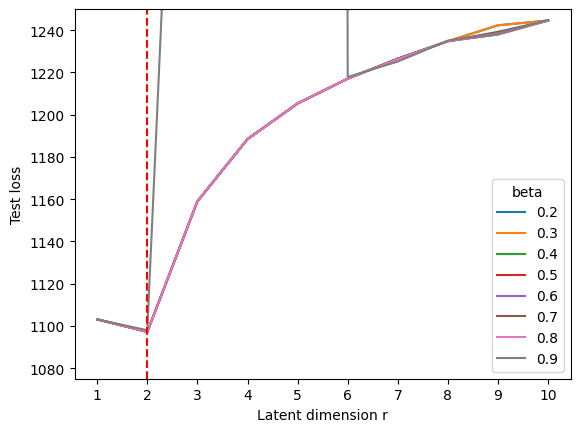

In [36]:
# 0.9 raus und dazu schreiben
fig, ax = plt.subplots()
latent_dim_search_counts = sns.lineplot(
    data=select_cs_results_counts, x="k", y="loss", 
    hue="beta", palette="tab10")
plt.ylabel("Test loss")
plt.xlabel("Latent dimension r")
plt.ylim([1075, 1250])
ax.set_xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10])
plt.axvline(x=k_opt_counts, color="red", linestyle="dashed")
plt.show()

In [37]:
print(f"Optimal latent dim: {k_opt_counts}")
print(f"Optimal beta: {beta_opt_counts}")

Optimal latent dim: 2.0
Optimal beta: 0.2


In [26]:
importlib.reload(cs)

<module 'tools.countsplit' from '/dss/dsshome1/07/di35buw/NMD/BacSC/tools/countsplit.py'>

### PCA

In [27]:
k_errors_pca, k_opt_pca = cs.select_n_pcs_countsplit(
    data_train_counts, data_test_counts, max_k=10)

In [28]:
print(f"Optimal number of PCs:{k_opt_pca}")

Optimal number of PCs:3


### Normalized counts

In [39]:
data_train_norm, data_test_norm = cs.countsplit_adata(
    data, data_dist="NB", beta_key="nb_overdisp_cutoff", 
    layer="normalized_counts", min_genes=1, max_counts=1e9, seed=1535741)

In [40]:
if True:
    # Normalizes X, such that: each barcode has total count equal to median of total counts before normalization
    sc.pp.normalize_total(data_train_norm, target_sum=None, layer=None)

    # Only normalization
    data_train_norm.layers["normalized_counts"] = data_train_norm.X.copy()

    # Variance Stabilization Transformation
    data_train_norm.X = sps.csr_matrix(np.log(data_train_norm.X.toarray() + np.array(data_train_norm.var["nb_overdisp_cutoff"] / 4)))
    data_train_norm.layers["vst_counts"] = data_train_norm.X.copy()
    data_train_norm.layers["vst_counts_shifted"] = data_train_norm.layers["vst_counts"].copy().todense() + data_train_norm.layers["vst_counts"].min() * -1.

    # test data
    sc.pp.normalize_total(data_test_norm, target_sum=None, layer=None)
    data_test_norm.layers["normalized_counts"] = data_test_norm.X.copy()
    data_test_norm.X = sps.csr_matrix(np.log(data_test_norm.X.toarray() + np.array(data_test_norm.var["nb_overdisp_cutoff"] / 4)))
    data_test_norm.layers["vst_counts"] = data_test_norm.X.copy()
    data_test_norm.layers["vst_counts_shifted"] = data_test_norm.layers["vst_counts"].copy().todense() + data_test_norm.layers["vst_counts"].min() * -1.

In [21]:
if REFIT_EVERYTHING:
    select_cs_results_norm = cs.select_3b_params_nomad_countsplit(
        data_train_norm, data_test_norm, potential_ks=potential_ks, 
        potential_betas=potential_betas, 
        layer="normalized_counts")

In [41]:
select_cs_results_norm = pkl.load(open("./S3/countsplit_search_k_beta_norm.pkl", "rb"))

In [43]:
k_opt_norm, beta_opt_norm, _ = select_cs_results_norm.sort_values(by="loss").iloc[0]

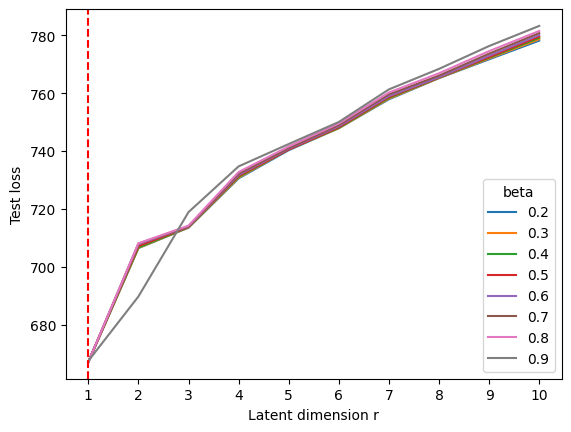

In [44]:
fig, ax = plt.subplots()
latent_dim_search_norm = sns.lineplot(data=select_cs_results_norm, x="k", y="loss", 
             hue="beta", palette="tab10")
plt.xlabel("Latent dimension r")
plt.ylabel("Test loss")
ax.set_xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10])
plt.axvline(x=k_opt_norm, color="red", linestyle="dashed")
plt.savefig("./S3/select_r_beta_cs_norm.svg", format="svg")

plt.show()

In [45]:
print(f"Optimal latent dim: {k_opt_norm}")
print(f"Optimal beta: {beta_opt_norm}")

Optimal latent dim: 1.0
Optimal beta: 0.6


In [26]:
if REFIT_EVERYTHING:
    select_cs_results_norm.to_pickle("./S3/countsplit_search_k_beta_norm.pkl")
    select_cs_results_norm.to_csv("./S3/countsplit_search_k_beta_norm.csv", index=False)
    select_cs_results_norm.to_latex("./S3/countsplit_search_k_beta_norm.tex", index=False)

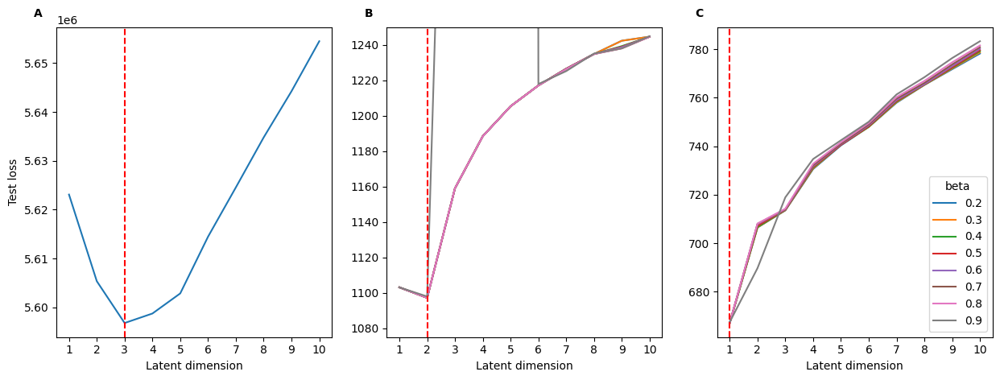

In [47]:
fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, sharex=True, figsize=[15, 5])

sns.lineplot(x=np.arange(10) + 1, y=k_errors_pca, ax=ax1)
ax1.set_xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10])
ax1.set_xlabel("Latent dimension")
ax1.set_ylabel("Test loss")
trans = mtransforms.ScaledTranslation(-20/72, 7/72, fig.dpi_scale_trans)
ax1.text(0.0, 1.0, "A", transform=ax1.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")
ax1.axvline(x=k_opt_pca, color="red", linestyle="dashed")

sns.lineplot(
    data=select_cs_results_counts, x="k", y="loss", 
    hue="beta", palette="tab10", ax=ax2, legend=None)
ax2.set_xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10])
ax2.set_ylim([1075, 1250])
ax2.set_xlabel("Latent dimension")
ax2.set_ylabel(None)
trans = mtransforms.ScaledTranslation(-20/72, 7/72, fig.dpi_scale_trans)
ax2.text(0.0, 1.0, "B", transform=ax2.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")
ax2.axvline(x=k_opt_counts, color="red", linestyle="dashed")

sns.lineplot(data=select_cs_results_norm, x="k", y="loss", 
             hue="beta", palette="tab10", ax=ax3)
ax3.set_xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10])
ax3.set_ylabel(None)
ax3.set_xlabel("Latent dimension")
ax3.text(0.0, 1.0, "C", transform=ax3.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")
ax3.axvline(x=k_opt_norm, color="red", linestyle="dashed")

plt.savefig("./S3/select_r_beta_cs.svg", format="svg")
plt.show()

## Fit NMD

In [27]:
k_opt_counts = int(k_opt_counts)
k_opt_norm = int(k_opt_norm)

In [55]:
n, p = data.X.shape

In [29]:
if REFIT_EVERYTHINGEVERYTHING:
    X_nmd_counts = ut.convert_to_dense_counts(data, layer="counts")
    W0_counts, H0_counts = cs.nuclear_norm_init(X_nmd_counts, n, p, k_opt_counts)
    Theta0_counts = W0_counts @ H0_counts

In [211]:
if REFIT_EVERYTHING:
    X_nmd_norm = ut.convert_to_dense_counts(data, layer="normalized_counts")
    W0_norm, H0_norm = cs.nuclear_norm_init(X_nmd_norm, n, p, k_opt_norm)
    Theta0_norm = W0_norm @ H0_norm

TypeError: slice indices must be integers or None or have an __index__ method

In [56]:
if REFIT_EVERYTHING:
    X_nmd_norm_r3 = ut.convert_to_dense_counts(data, layer="normalized_counts")
    W0_norm_r3, H0_norm_r3 = cs.nuclear_norm_init(X_nmd_norm_r3, n, p, 3)
    Theta0_norm_r3 = W0_norm_r3 @ H0_norm_r3

In [31]:
if REFIT_EVERYTHING:
    pkl.dump(W0_counts, open("./S3/W0_counts.pkl", "wb"))
    pkl.dump(H0_counts, open("./S3/H0_counts.pkl", "wb"))
    pkl.dump(Theta0_counts, open("./S3/Theta0_counts.pkl", "wb"))

    pkl.dump(W0_norm, open("./S3/W0_norm.pkl", "wb"))
    pkl.dump(H0_norm, open("./S3/H0_norm.pkl", "wb"))
    pkl.dump(Theta0_norm, open("./S3/Theta0_norm.pkl", "wb"))
    
    pkl.dump(W0_norm_r3, open("./S3/W0_norm_r3.pkl", "wb"))
    pkl.dump(H0_norm_r3, open("./S3/H0_norm_r3.pkl", "wb"))
    pkl.dump(Theta0_norm_r3, open("./S3/Theta0_norm_r3.pkl", "wb"))

In [68]:
W0_counts = pkl.load(open("./S3/W0_counts.pkl", "rb"))
H0_counts = pkl.load(open("./S3/H0_counts.pkl", "rb"))
Theta0_counts = pkl.load(open("./S3/Theta0_counts.pkl", "rb"))

W0_norm = pkl.load(open("./S3/W0_norm.pkl", "rb"))
H0_norm = pkl.load(open("./S3/H0_norm.pkl", "rb"))
Theta0_norm = pkl.load(open("./S3/Theta0_norm.pkl", "rb"))

W0_norm_r3 = pkl.load(open("./S3/W0_norm_r3.pkl", "rb"))
H0_norm_r3 = pkl.load(open("./S3/H0_norm_r3.pkl", "rb"))
Theta0_norm_r3 = pkl.load(open("./S3/Theta0_norm_r3.pkl", "rb"))

In [ ]:
init_strat = InitializationStrategy.KNOWN_MATRIX
kernel_strat = KernelStrategy.MOMENTUM_3_BLOCK_MODEL_FREE

In [33]:
if REFIT_EVERYTHING:
    kernel_params_counts = kernelInputTypes.Momentum3BlockAdditionalParameters(
        momentum_beta=beta_opt_counts, 
        candidate_factor_W0=W0_counts, candidate_factor_H0=H0_counts,
)
    nmd_result_counts = nmd.decompose(
                X_nmd_counts, k_opt_counts, 
                kernel_strategy=kernel_strat, 
                initialization=init_strat,                  
                kernel_params=kernel_params_counts, 
                manual_max_iterations=200,   
                verbose=True, tolerance=None)

In [35]:
if REFIT_EVERYTHING:
    kernel_params_norm = kernelInputTypes.Momentum3BlockAdditionalParameters(
            momentum_beta=beta_opt_norm, 
            candidate_factor_W0=W0_norm, candidate_factor_H0=H0_norm,
    )
    nmd_result_norm = nmd.decompose(
                X_nmd_norm, k_opt_norm, 
                kernel_strategy=kernel_strat, 
                initialization=init_strat,                  
                kernel_params=kernel_params_norm, 
                manual_max_iterations=200,   
                verbose=True, tolerance=None)

In [419]:
beta_opt_norm

0.6

In [436]:
if True:
    kernel_params_norm_r3 = kernelInputTypes.Momentum3BlockAdditionalParameters(
        momentum_beta=beta_opt_norm, 
        candidate_factor_W0=W0_norm_r3, candidate_factor_H0=H0_norm_r3,
    )
    nmd_result_norm_r3 = nmd.decompose(
        X_nmd_norm_r3, 3, 
        kernel_strategy=kernel_strat, 
        initialization=init_strat,                  
        kernel_params=kernel_params_norm_r3, 
        manual_max_iterations=200,   
        verbose=True, tolerance=None)

INFO:fi_nomad.entry:	Initiating run, target_rank: 3, tolerance: None
INFO:fi_nomad.entry:200 total, final loss Not Tracked
INFO:fi_nomad.entry:	Initialization took 3.57689568772912e-05 loop took 52.78086068702396 overall (0.2639043034351198/ea)


In [37]:
if REFIT_EVERYTHING:
    pkl.dump(nmd_result_counts, open("./S3/nmd_result_counts_k2.pkl", "wb"))
    pkl.dump(nmd_result_norm, open("./S3/nmd_result_norm_k1.pkl", "wb"))
    pkl.dump(nmd_result_norm_r3, open("./S3/nmd_result_norm_r3.pkl", "wb"))

In [426]:
nmd_result_counts = pkl.load(open("./S3/nmd_result_counts_k2.pkl", "rb"))
nmd_result_norm = pkl.load(open("./S3/nmd_result_norm_k1.pkl", "rb"))
nmd_result_norm_r3 = pkl.load(open("./S3/nmd_result_norm_r3.pkl", "rb"))

In [213]:
data.obsm["X_nmd_counts_r2"] = nmd_result_counts.factors[0]
data.varm["NMD_components_counts_r2"] = nmd_result_counts.factors[1].T
data.layers["Theta_counts_r2"] = nmd_result_counts.factors[0] @ nmd_result_counts.factors[1]

In [214]:
data.obsm["X_nmd_norm_r1"] = nmd_result_norm.factors[0]
data.varm["NMD_components_norm_r1"] = nmd_result_norm.factors[1].T
data.layers["Theta_norm_r1"] = nmd_result_norm.factors[0] @ nmd_result_norm.factors[1]

In [427]:
data.obsm["X_nmd_norm_r3"] = nmd_result_norm_r3.factors[0]
data.varm["NMD_components_norm_r3"] = nmd_result_norm_r3.factors[1].T
data.layers["Theta_norm_r3"] = nmd_result_norm_r3.factors[0] @ nmd_result_norm_r3.factors[1]

In [216]:
data

AnnData object with n_obs × n_vars = 1544 × 5553
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'outlier', 'n_genes', 'total_counts_norm', 'total_counts_scale', 'embedding_reliability', 'reliability_score', 'null_reliability_score', 'pca_leiden_opt'
    var: 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'var_counts', 'nb_mean', 'nb_overdisp', 'nb_overdisp_cutoff', 'nb_overdisp_cutoff_bfgs', 'nb_overdisp_bfgs', 'mean', 'std'
    uns: 'embedding_reliability_colors', 'nmd_counts_r2', 'nmd_norm_r2', 'pca', 'pca_leiden', 'pca_leiden_opt_colors', 'pca_neighbors', 'umap'
    obsm: 'X_nmd_counts_k2', 'X_nmd_norm_k1', 'X_nmd_norm_k2', 'X_pca', 'X_umap', 'X_nmd_counts_r2', 'X_nmd_norm_r1', 'X_nmd_norm_r3'
    varm: 'NMD_components_counts_k2', 'NMD_components_norm_k1', 'NMD_components_norm_k2', 'PCs', 'NMD_components_counts_r2', 'NMD_compo

Refit NMD on normalized counts with r=3.

In [44]:
if REFIT_EVERYTHING:
    W0_norm_k2, H0_norm_k2 = cs.nuclear_norm_init(X_nmd_norm, n, p, 2)
    Theta0_norm_k2 = W0_norm_k2 @ H0_norm_k2

In [45]:
if REFIT_EVERYTHING:
    pkl.dump(W0_norm_k2, open("./S3/W0_norm_k2.pkl", "wb"))
    pkl.dump(H0_norm_k2, open("./S3/H0_norm_k2.pkl", "wb"))
    pkl.dump(Theta0_norm_k2, open("./S3/Theta0_norm_k2.pkl", "wb"))

In [74]:
W0_norm_k2 = pkl.load(open("./S3/W0_norm_k2.pkl", "rb"))
H0_norm_k2 = pkl.load(open("./S3/H0_norm_k2.pkl", "rb"))
Theta0_norm_k2 = pkl.load(open("./S3/Theta0_norm_k2.pkl", "rb"))

In [47]:
if REFIT_EVERYTHING:
    kernel_params_norm_k2 = kernelInputTypes.Momentum3BlockAdditionalParameters(
        momentum_beta=beta_opt_norm, 
        candidate_factor_W0=W0_norm_k2, candidate_factor_H0=H0_norm_k2,
    )

In [48]:
if REFIT_EVERYTHING:
    nmd_result_norm_k2 = nmd.decompose(
                    X_nmd_norm, 2, 
                    kernel_strategy=kernel_strat, 
                    initialization=init_strat,                  
                    kernel_params=kernel_params_norm_k2, 
                    manual_max_iterations=200,   
                    verbose=True, tolerance=None)

In [49]:
if REFIT_EVERYTHING:
    pkl.dump(nmd_result_norm_k2, open("./S3/nmd_result_norm_k2.pkl", "wb"))

In [75]:
nmd_result_norm_k2 = pkl.load(open("./S3/nmd_result_norm_k2.pkl", "rb"))

In [76]:
data.obsm["X_nmd_norm_k2"] = nmd_result_norm_k2.factors[0]
data.varm["NMD_components_norm_k2"] = nmd_result_norm_k2.factors[1].T
data.layers["Theta_norm_k2"] = nmd_result_norm_k2.factors[0] @ nmd_result_norm_k2.factors[1]

Add PCA clustering.

In [504]:
if REFIT_EVERYTHING:
    data_pca = sc.read_h5ad("../../../data/MOBA_scRNAseq/MOBA_intermediate_results/export_s3.h5ad")

    data.obs['pca_leiden_opt'] = data_pca.obs['leiden_opt']
    data.uns['pca_leiden'] = data_pca.uns['leiden']
    data.uns['pca_leiden_opt_colors'] = data_pca.uns['leiden_opt_colors']
    data.uns['pca_neighbors'] = data_pca.uns['neighbors']
    data.obsp['pca_connectivities'] = data_pca.obsp['connectivities']
    data.obsp['pca_distances'] = data_pca.obsp['distances']

In [53]:
#data.write_h5ad("./S3_NMD_counts_norm_r1r2_PCA.h5ad")

In [338]:
# data = sc.read_h5ad("./S3_NMD_counts_norm_r1r2_PCA.h5ad")

In [77]:
data

AnnData object with n_obs × n_vars = 1544 × 5553
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'outlier', 'n_genes', 'total_counts_norm', 'total_counts_scale', 'embedding_reliability', 'reliability_score', 'null_reliability_score', 'pca_leiden_opt'
    var: 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'var_counts', 'nb_mean', 'nb_overdisp', 'nb_overdisp_cutoff', 'nb_overdisp_cutoff_bfgs', 'nb_overdisp_bfgs', 'mean', 'std'
    uns: 'embedding_reliability_colors', 'nmd_counts_r2', 'nmd_norm_r2', 'pca', 'pca_leiden', 'pca_leiden_opt_colors', 'pca_neighbors', 'umap'
    obsm: 'X_nmd_counts_k2', 'X_nmd_norm_k1', 'X_nmd_norm_k2', 'X_pca', 'X_umap', 'X_nmd_counts_r2', 'X_nmd_norm_r1', 'X_nmd_norm_r3'
    varm: 'NMD_components_counts_k2', 'NMD_components_norm_k1', 'NMD_components_norm_k2', 'PCs', 'NMD_components_counts_r2', 'NMD_compo

#### Plots for normalized rank 1 NMD

In [205]:
fig_path_rank1_nmd = "./S3/figures/rank1_nmd/"

In [369]:
X_normalized_counts = ut.convert_to_dense_counts(data, layer="normalized_counts").flatten()

In [386]:
data.varm.keys()

KeysView(AxisArrays with keys: NMD_components_counts_k2, NMD_components_norm_k1, NMD_components_norm_k2, PCs, NMD_components_counts_r2, NMD_components_norm_r1, NMD_components_norm_r3)

In [440]:
df_reconstruction_nuclearinit_nmd = pd.DataFrame.from_dict({
    "normalized_counts": ut.convert_to_dense_counts(data, layer="normalized_counts").flatten(),
    "nuclear_init": np.round(np.maximum(0, W0_norm @ H0_norm)).flatten(),
    "3B-NMD": np.round(np.maximum(0, data.obsm["X_nmd_norm_r1"] @ data.varm["NMD_components_norm_k1"].T)).flatten()
})

max_val = max(
    np.max(df_reconstruction_nuclearinit_nmd["normalized_counts"]),
    np.max(df_reconstruction_nuclearinit_nmd["nuclear_init"]),
    np.max(df_reconstruction_nuclearinit_nmd["3B-NMD"]))

corr_orig_nuclear = np.corrcoef(
    df_reconstruction_nuclearinit_nmd["normalized_counts"], 
    df_reconstruction_nuclearinit_nmd["nuclear_init"])[0][1]
corr_orig_3bnmd = np.corrcoef(
    df_reconstruction_nuclearinit_nmd["normalized_counts"], 
    df_reconstruction_nuclearinit_nmd["3B-NMD"])[0][1]

In [439]:
corr_orig_3bnmd

0.6931686104073599

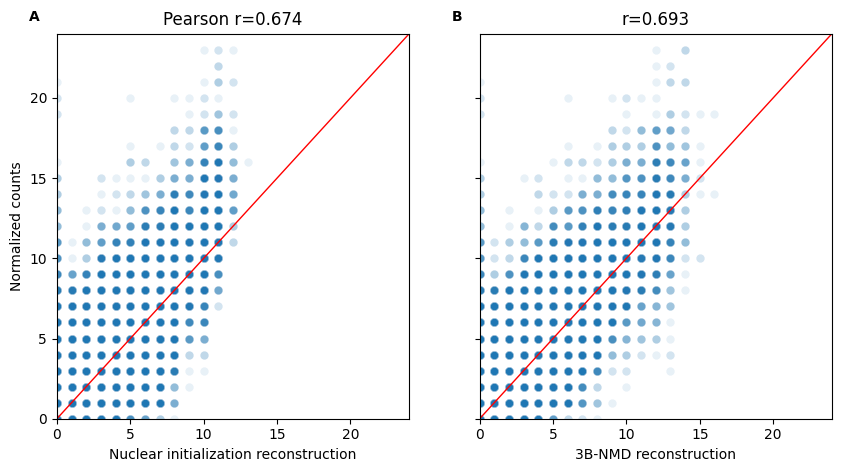

In [441]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 5), sharex=True, sharey=True)

sns.scatterplot(data=df_reconstruction_nuclearinit_nmd, 
                y="normalized_counts", 
                x="nuclear_init", 
                alpha=0.1, ax=ax1)
ax1.set_title(f"Pearson r={corr_orig_nuclear:.3f}")
ax1.axline(xy1=(0, 0), slope=1, linewidth=1, color="r")
ax1.set_ylim((0, max_val+1))
ax1.set_xlim((0, max_val+1))
ax1.set_ylabel("Normalized counts")
ax1.set_xlabel("Nuclear initialization reconstruction")
trans = mtransforms.ScaledTranslation(-20/72, 7/72, fig.dpi_scale_trans)
ax1.text(0.0, 1.0, "A", transform=ax1.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")

sns.scatterplot(data=df_reconstruction_nuclearinit_nmd, 
                y="normalized_counts", 
                x="3B-NMD", 
                alpha=0.1, ax=ax2)
ax2.set_title(f"r={corr_orig_3bnmd:.3f}")
ax2.axline(xy1=(0, 0), slope=1, linewidth=1, color="r")
#ax2.set_ylim((0, max_val))
#ax2.set_xlim((0, max_val))
ax2.set_ylabel(None)
ax2.set_xlabel("3B-NMD reconstruction")
trans = mtransforms.ScaledTranslation(-20/72, 7/72, fig.dpi_scale_trans)
ax2.text(0.0, 1.0, "B", transform=ax2.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")

plt.savefig(fig_path_rank1_nmd + "reconstruction_nuclear_vs_3bnmd_r1.svg", format="svg")

plt.show()

In [383]:
W0_length = len(W0_norm.flatten())
dict_histogram_W0nuclear_vs_W_nmd_r1 = {
    "x": np.concatenate((W0_norm, data.obsm["X_nmd_norm_k1"])).flatten(),
    "W0_Wnmd":  ["W0 (nuclear init.)"] * W0_length +
                             ["W (3B-NMD)"] * W0_length
    }
df_histogram_W0nuclear_vs_W_nmd_r1 = pd.DataFrame.from_dict(dict_histogram_W0nuclear_vs_W_nmd_r1)

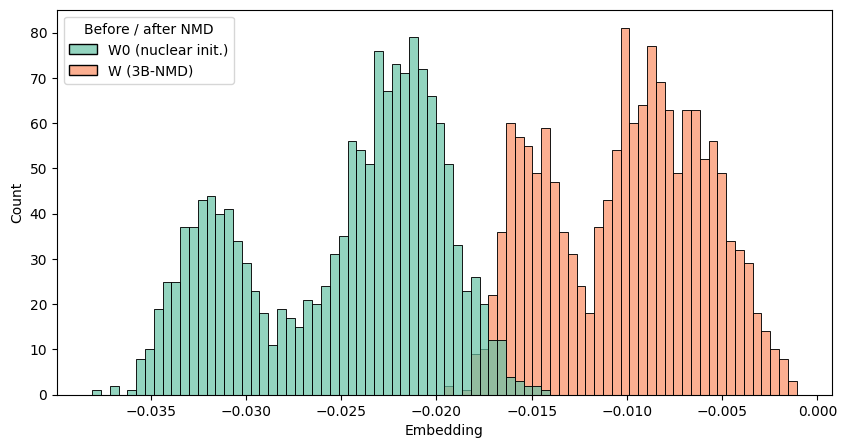

In [412]:
fig, ax = plt.subplots(figsize= (10, 5))
histogram_W0nuclear_vs_W_nmd_r1 = sns.histplot(
    data=df_histogram_W0nuclear_vs_W_nmd_r1, 
    x="x", hue="W0_Wnmd", bins=80, alpha=0.7, palette="Set2"
)
histogram_W0nuclear_vs_W_nmd_r1.legend_.set_title("Before / after NMD")
ax.set_xlabel("Embedding")

plt.savefig(fig_path_rank1_nmd + "histogram_W0nuclear_vs_W_nmd_r1.svg", format="svg")
plt.show()

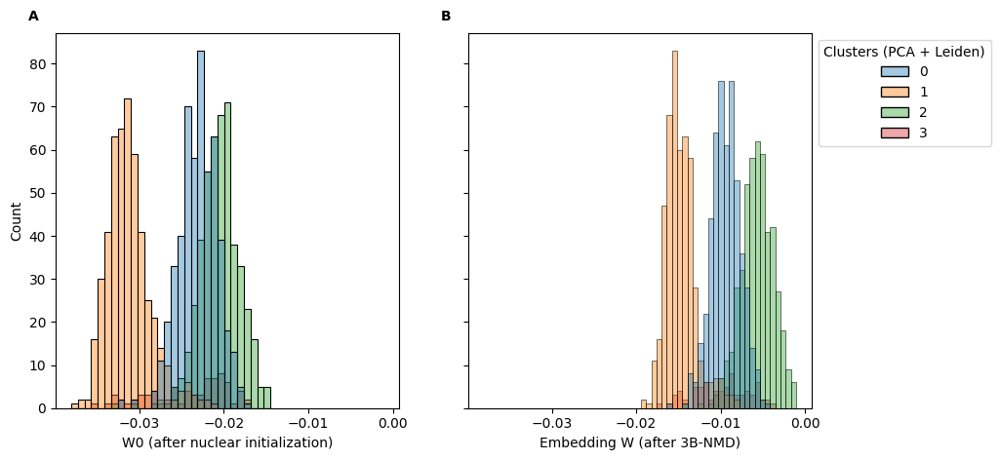

In [207]:
fig, (ax1, ax2) = plt.subplots(1, 2, sharex=True, sharey=True, figsize=[10, 5])
sns.histplot(x=W0_norm.flatten(), hue=data.obs['pca_leiden_opt'], ax=ax1, legend=False, bins=30, alpha=0.4)
ax1.set_xlabel("W0 (after nuclear initialization)")
trans = mtransforms.ScaledTranslation(-20/72, 7/72, fig.dpi_scale_trans)
ax1.text(0.0, 1.0, "A", transform=ax1.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")

sns.histplot(x=data.obsm["X_nmd_norm_k1"].flatten(), hue=data.obs['pca_leiden_opt'], alpha=0.4, 
             ax=ax2, bins=30).axes.legend_.set_title("Clusters (PCA + Leiden)")
ax2.set_xlabel("Embedding W (after 3B-NMD)")
ax2.text(0.0, 1.0, "B", transform=ax2.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")
sns.move_legend(ax2, "upper left", bbox_to_anchor=(1, 1))

plt.savefig(fig_path_rank1_nmd + "histogram_W0nuclear_vs_W_nmd_r1_by_pca_cluster.svg", format="svg")

plt.show()

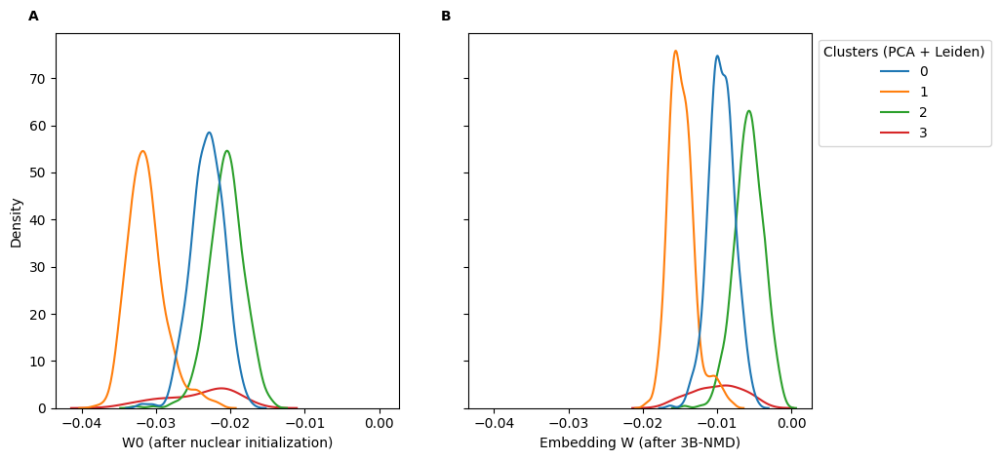

In [208]:
fig, (ax1, ax2) = plt.subplots(1, 2, sharex=True, sharey=True, figsize=[10, 5])
sns.kdeplot(x=W0_norm.flatten(), hue=data.obs['pca_leiden_opt'], ax=ax1, legend=False)
ax1.set_xlabel("W0 (after nuclear initialization)")
trans = mtransforms.ScaledTranslation(-20/72, 7/72, fig.dpi_scale_trans)
ax1.text(0.0, 1.0, "A", transform=ax1.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")

sns.kdeplot(x=data.obsm["X_nmd_norm_k1"].flatten(), hue=data.obs['pca_leiden_opt'], ax=ax2).axes.legend_.set_title("Clusters (PCA + Leiden)")
ax2.set_xlabel("Embedding W (after 3B-NMD)")
ax2.text(0.0, 1.0, "B", transform=ax2.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")
sns.move_legend(ax2, "upper left", bbox_to_anchor=(1, 1))

plt.savefig(fig_path_rank1_nmd + "kde_W0nuclear_vs_W_nmd_r1_by_pca_cluster.svg", format="svg")

plt.show()

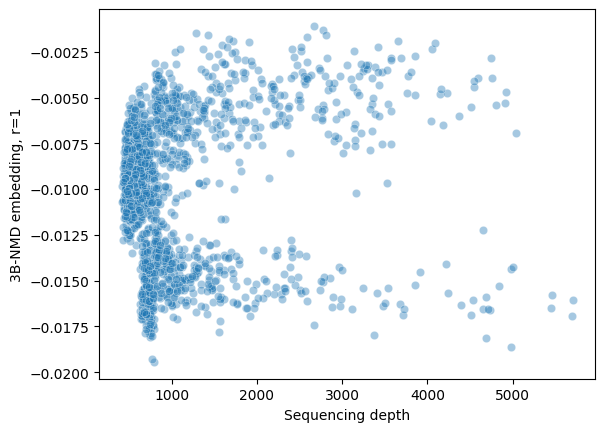

In [209]:
scatter_seqdepth_nmdnormk1 = sns.scatterplot(y=data.obsm["X_nmd_norm_k1"].flatten(), 
                                             x=data.obs["total_counts"], alpha = 0.4)
plt.ylabel("3B-NMD embedding, r=1")
plt.xlabel("Sequencing depth")


plt.savefig(fig_path_rank1_nmd + "./scatter_seqdepth_nmdnormk1.svg", format="svg")

plt.show()

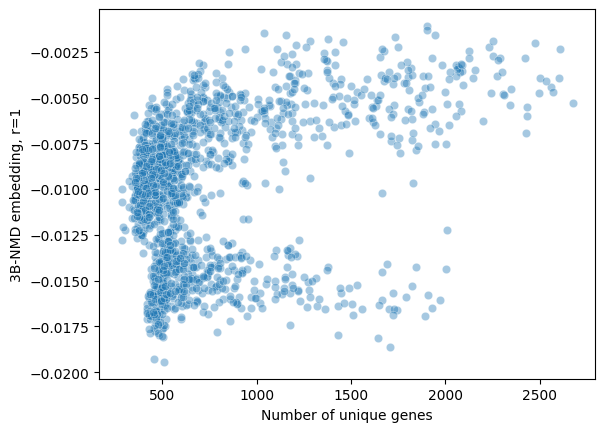

In [210]:
scatter_uniquegenes_nmdnormk1 = sns.scatterplot(y=data.obsm["X_nmd_norm_k1"].flatten(), 
                                                x=data.obs["n_genes"], alpha = 0.4)
plt.ylabel("3B-NMD embedding, r=1")
plt.xlabel("Number of unique genes")

plt.savefig(fig_path_rank1_nmd + "./scatter_uniquegenes_nmdnormk1.svg", format="svg")

plt.show()

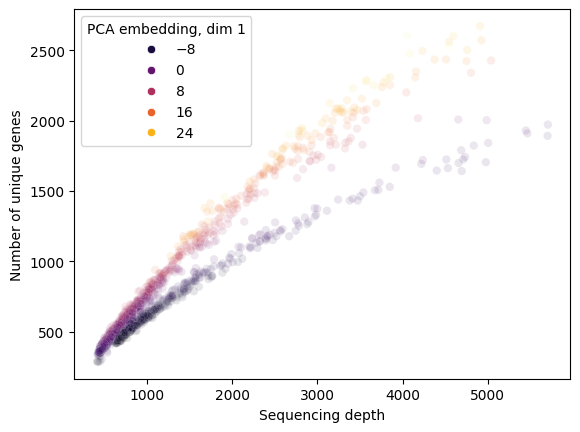

In [353]:
scatter_seqdepth_uniquegenes_hue_pca_normk1 = sns.scatterplot(x=data.obs["total_counts"], 
                                                              y=data.obs["n_genes_by_counts"], 
                                                              hue=data.obsm["X_pca"][:,0:1].flatten(), 
                                                              alpha = 0.1, palette="inferno")
plt.ylabel("Number of unique genes")
plt.xlabel("Sequencing depth")
scatter_seqdepth_uniquegenes_hue_pca_normk1.axes.legend_.set_title("PCA embedding, dim 1")

for lh in scatter_seqdepth_uniquegenes_hue_pca_normk1.axes.legend_.legend_handles:
    lh.set_alpha(1)

#plt.savefig(fig_path_rank1_nmd + "./scatter_seqdepth_uniquegenes_hue_nmd.svg", format="svg")

plt.show()

Text(0.5, 0, '3B-NMD embedding, dim 1, r=1')

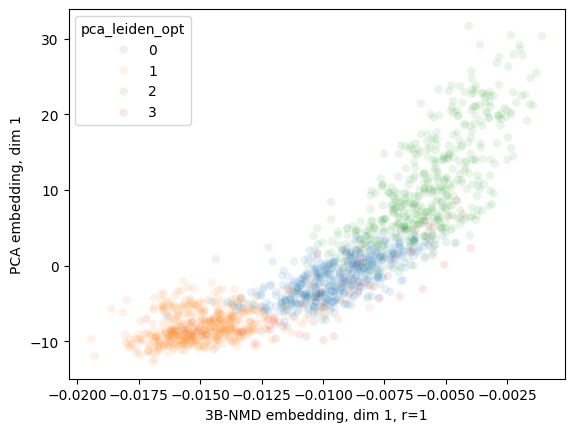

In [81]:
sns.scatterplot(x=data.obsm["X_nmd_norm_k1"].flatten(), y=data.obsm["X_pca"][:,0:1].flatten(), 
                alpha = 0.1, hue=data.obs["pca_leiden_opt"])
plt.ylabel("PCA embedding, dim 1")
plt.xlabel("3B-NMD embedding, dim 1, r=1")

Text(0.5, 0, '3B-NMD embedding, dim 1, r=1')

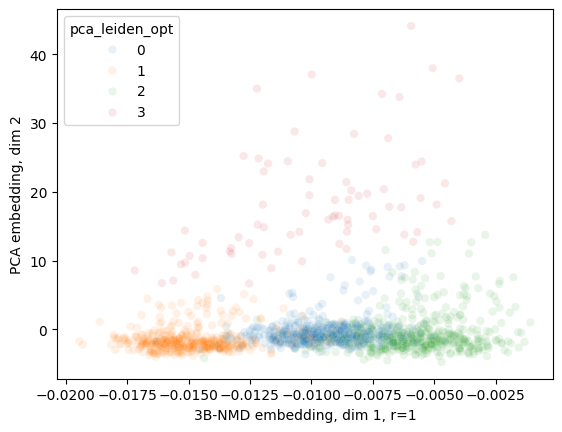

In [82]:
sns.scatterplot(x=data.obsm["X_nmd_norm_k1"].flatten(), y=data.obsm["X_pca"][:,1:2].flatten(), 
                alpha = 0.1, hue=data.obs["pca_leiden_opt"])
plt.ylabel("PCA embedding, dim 2")
plt.xlabel("3B-NMD embedding, dim 1, r=1")

Text(0, 0.5, 'Sequencing depth')

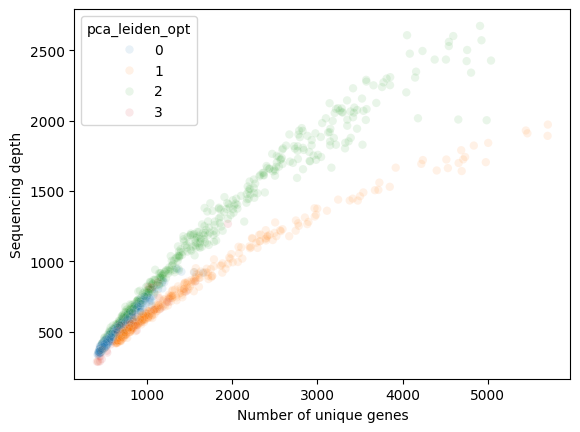

In [86]:
sns.scatterplot(x=data.obs["total_counts"], y=data.obs["n_genes_by_counts"], 
                alpha=0.1, hue=data.obs["pca_leiden_opt"])

plt.xlabel("Number of unique genes")
plt.ylabel("Sequencing depth")

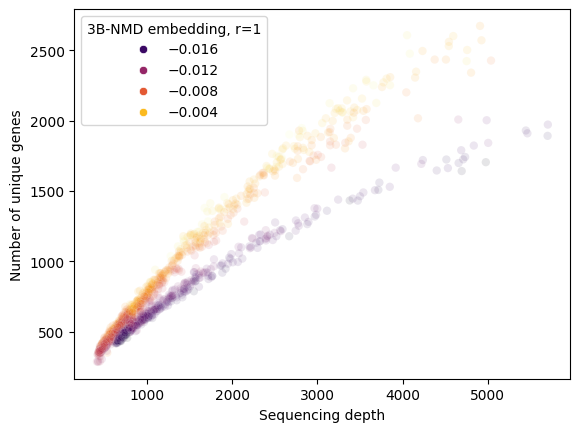

In [355]:
W0_norm_min = W0_norm.flatten().min()

scatter_seqdepth_uniquegenes_hue_nmd_normk1 = sns.scatterplot(x=data.obs["total_counts"], 
                                                              y=data.obs["n_genes_by_counts"], 
                                                            hue=data.obsm["X_nmd_norm_k1"].flatten(), 
                                                              alpha = 0.1, palette="inferno")
plt.ylabel("Number of unique genes")
plt.xlabel("Sequencing depth")
scatter_seqdepth_uniquegenes_hue_nmd_normk1.axes.legend_.set_title("3B-NMD embedding, r=1")

for lh in scatter_seqdepth_uniquegenes_hue_nmd_normk1.axes.legend_.legend_handles:
    lh.set_alpha(1)

plt.savefig(fig_path_rank1_nmd + "./scatter_seqdepth_uniquegenes_hue_nmd.svg", format="svg")

plt.show()

<Axes: ylabel='Density'>

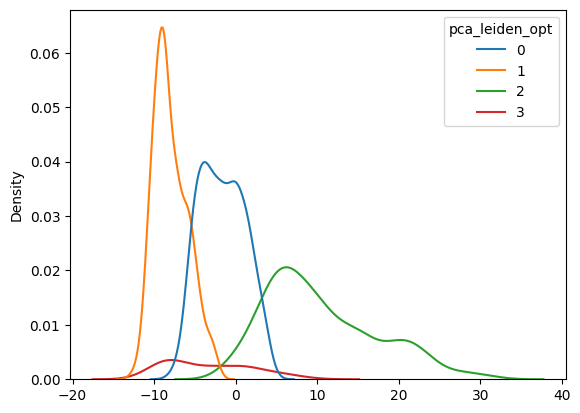

In [88]:
sns.kdeplot(
    x=data.obsm["X_pca"][:,:1].flatten(), 
    hue=data.obs['pca_leiden_opt'])

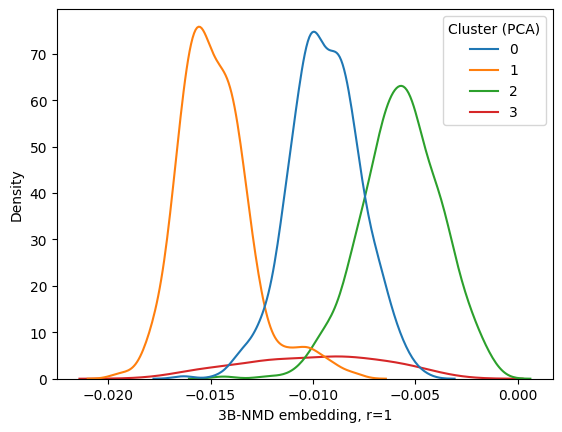

In [68]:
kde_nmd_normk1_pca_cluster = sns.kdeplot(
    x=data.obsm["X_nmd_norm_k1"].flatten(), 
    hue=data.obs['pca_leiden_opt'])
plt.xlabel("3B-NMD embedding, r=1")
kde_nmd_normk1_pca_cluster.axes.legend_.set_title("Cluster\n(PCA + Leiden)")

plt.savefig(fig_path_rank1_nmd + "./kde_nmd_normk1_pca_cluster.svg", format="svg")

plt.show()

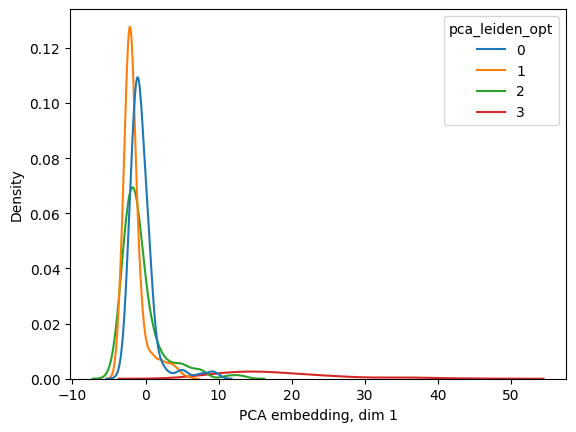

In [135]:
kde_pca_normk1_pca_cluster = sns.kdeplot(
    x=data.obsm["X_pca"][:,1:2].flatten(), 
    hue=data.obs['pca_leiden_opt'])
plt.xlabel("PCA embedding, dim 1")
kde_nmd_normk1_pca_cluster.axes.legend_.set_title("Cluster\n(PCA + Leiden)")

#plt.savefig(fig_path_rank1_nmd + "./kde_nmd_normk1_pca_cluster.svg", format="svg")

plt.show()

In [79]:
pearsonr(data.varm["NMD_components_norm_k1"].flatten(), data.var["total_counts"])

PearsonRResult(statistic=-0.9804628599521997, pvalue=0.0)

In [359]:
data.var.keys()

Index(['feature_types', 'genome', 'n_cells_by_counts', 'mean_counts',
       'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts',
       'log1p_total_counts', 'n_cells', 'var_counts', 'nb_mean', 'nb_overdisp',
       'nb_overdisp_cutoff', 'nb_overdisp_cutoff_bfgs', 'nb_overdisp_bfgs',
       'mean', 'std'],
      dtype='object')

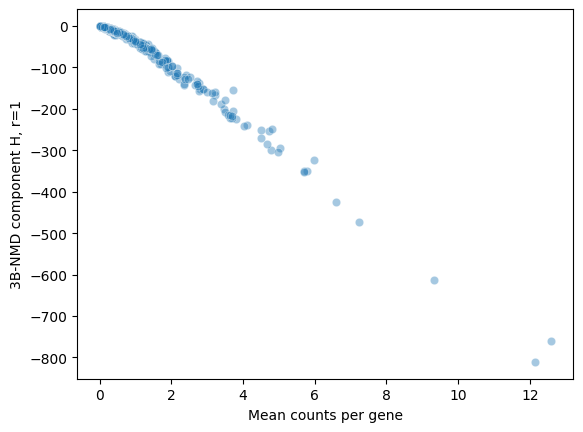

In [362]:
scatter_geneseqdepth_nmdnorm_component_k1 = sns.scatterplot(y=data.varm["NMD_components_norm_k1"].flatten(), 
                                                x=data.var["mean_counts"], alpha = 0.4)
plt.ylabel("3B-NMD component H, r=1")
plt.xlabel("Mean counts per gene")
#scatter_geneseqdepth_nmdnorm_component_k1.legend_.set_title("Cluster (PCA)")

plt.savefig(fig_path_rank1_nmd + "./scatter_meancountsperGene_nmdnorm_component_r1.svg", format="svg")

plt.show()

#### Plots for normalized rank 3 NMD

In [76]:
fig_path_rank3_norm_nmd = "./S3/figures/rank3_norm_nmd/"

In [413]:
data.varm.keys()

KeysView(AxisArrays with keys: NMD_components_counts_k2, NMD_components_norm_k1, NMD_components_norm_k2, PCs, NMD_components_counts_r2, NMD_components_norm_r1, NMD_components_norm_r3)

In [448]:
df_reconstruction_nuclearinit_nmd = pd.DataFrame.from_dict({
    "normalized_counts": ut.convert_to_dense_counts(data, layer="normalized_counts").flatten(),
    "nuclear_init": np.round(np.maximum(0, W0_norm_r3 @ H0_norm_r3)).flatten(),
    "3B-NMD": np.round(np.maximum(0, data.obsm["X_nmd_norm_r3"] @ data.varm["NMD_components_norm_r3"].T)).flatten()
})

max_val = max(
    np.max(df_reconstruction_nuclearinit_nmd["normalized_counts"]),
    np.max(df_reconstruction_nuclearinit_nmd["nuclear_init"]),
    np.max(df_reconstruction_nuclearinit_nmd["3B-NMD"]))

corr_orig_nuclear = np.corrcoef(
    df_reconstruction_nuclearinit_nmd["normalized_counts"], 
    df_reconstruction_nuclearinit_nmd["nuclear_init"])[0][1]
corr_orig_3bnmd = np.corrcoef(
    df_reconstruction_nuclearinit_nmd["normalized_counts"], 
    df_reconstruction_nuclearinit_nmd["3B-NMD"])[0][1]

In [447]:
print(f"Correlation original vs. nuclear init reconstruction: {corr_orig_nuclear}")
print(f"Correlation original vs. 3B-NMD reconstruction: {corr_orig_3bnmd}")

Correlation original vs. nuclear init reconstruction: 0.7032159168134378
Correlation original vs. 3B-NMD reconstruction: 0.7134654196443053


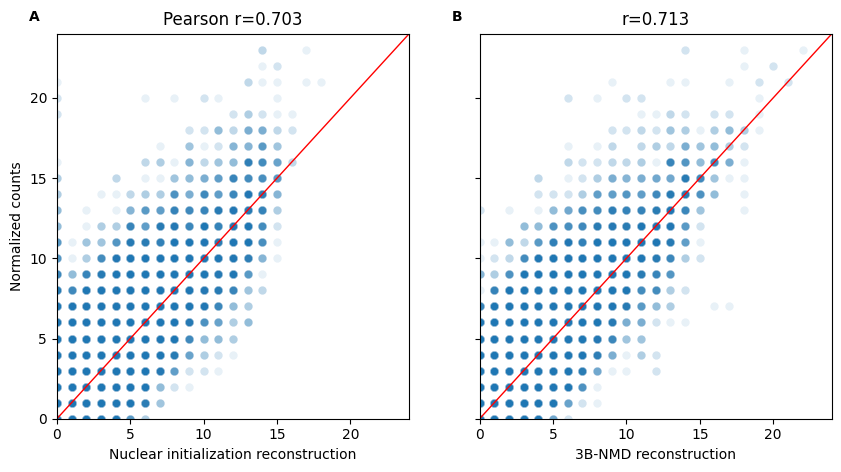

In [449]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 5), sharex=True, sharey=True)

sns.scatterplot(data=df_reconstruction_nuclearinit_nmd, 
                y="normalized_counts", 
                x="nuclear_init", 
                alpha=0.1, ax=ax1)
ax1.set_title(f"Pearson r={corr_orig_nuclear:.3f}")
ax1.axline(xy1=(0, 0), slope=1, linewidth=1, color="r")
ax1.set_ylim((0, max_val+1))
ax1.set_xlim((0, max_val+1))
ax1.set_ylabel("Normalized counts")
ax1.set_xlabel("Nuclear initialization reconstruction")
trans = mtransforms.ScaledTranslation(-20/72, 7/72, fig.dpi_scale_trans)
ax1.text(0.0, 1.0, "A", transform=ax1.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")

sns.scatterplot(data=df_reconstruction_nuclearinit_nmd, 
                y="normalized_counts", 
                x="3B-NMD", 
                alpha=0.1, ax=ax2)
ax2.set_title(f"r={corr_orig_3bnmd:.3f}")
ax2.axline(xy1=(0, 0), slope=1, linewidth=1, color="r")
#ax2.set_ylim((0, max_val))
#ax2.set_xlim((0, max_val))
ax2.set_ylabel(None)
ax2.set_xlabel("3B-NMD reconstruction")
trans = mtransforms.ScaledTranslation(-20/72, 7/72, fig.dpi_scale_trans)
ax2.text(0.0, 1.0, "B", transform=ax2.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")

plt.savefig(fig_path_rank3_norm_nmd + "reconstruction_nuclear_vs_3bnmd_r3.svg", format="svg")

plt.show()

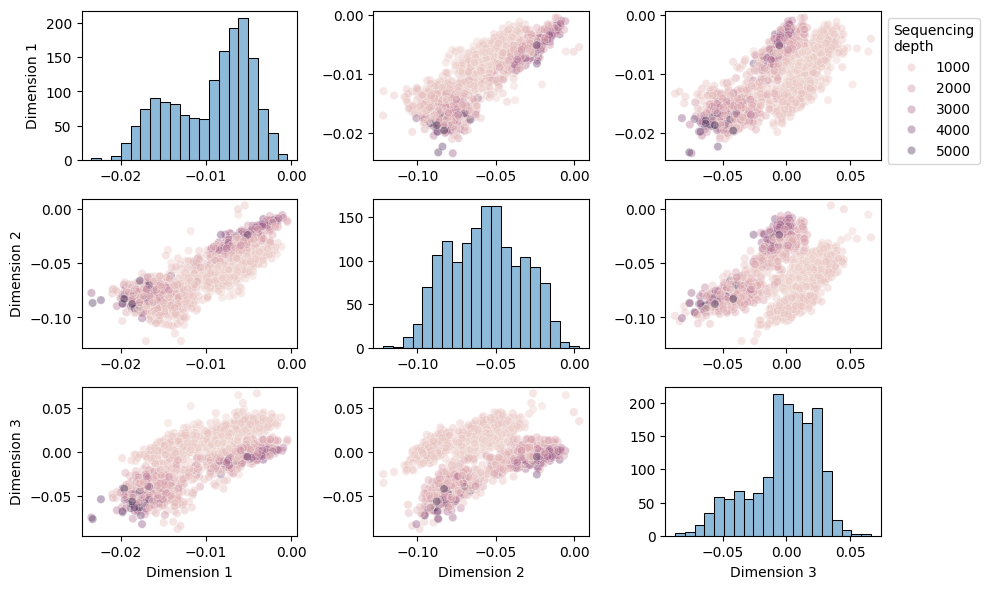

In [598]:
embeddings_2_plot = data.obsm["X_nmd_norm_r3"]
_, p = embeddings_2_plot.shape

fig, axs = plt.subplots(p, p, figsize=[10, 6], sharex=False) 

hist_y_lim = [0, 250]
hist_bins = 20

scatter_lim = [embeddings_2_plot.min() - 0.01, embeddings_2_plot.max() + 0.01]
scatter_alpha = 0.4

#scatter_hue = data.obs["pca_leiden_opt"]
scatter_hue = data.obs["total_counts"]
#scatter_hue = None


for i, row in enumerate(axs):
    for j, axis in enumerate(row):
        if i == j: # histogram
            sns.histplot(embeddings_2_plot[:,i:(i+1)], ax=axis, legend=False, bins=hist_bins)
        else:
            use_legend = (i == 0 and j == (p - 1)) and (scatter_hue is not None)
            sns.scatterplot(
                y=embeddings_2_plot[:,i:(i+1)].flatten(), 
                x=embeddings_2_plot[:,j:(j+1)].flatten(), 
                alpha=scatter_alpha,
                hue = scatter_hue,
                ax=axis, legend=use_legend,
            )
            if use_legend:
                sns.move_legend(axis, "upper left", bbox_to_anchor=(1, 1))
                axis.legend_.set_title("Sequencing\ndepth")
        if j == 0:
            axis.set_ylabel(f"Dimension {i + 1}")
        else: 
            axis.set_ylabel(None)
        if i == len(row)-1:
            axis.set_xlabel(f"Dimension {j + 1}")
        else:
            axis.set_xlabel(None)

plt.tight_layout()

plt.savefig(fig_path_rank3_norm_nmd + "embedding_plot_nmd_norm_r3_hueSeqDepth.svg", format="svg")
plt.show()            

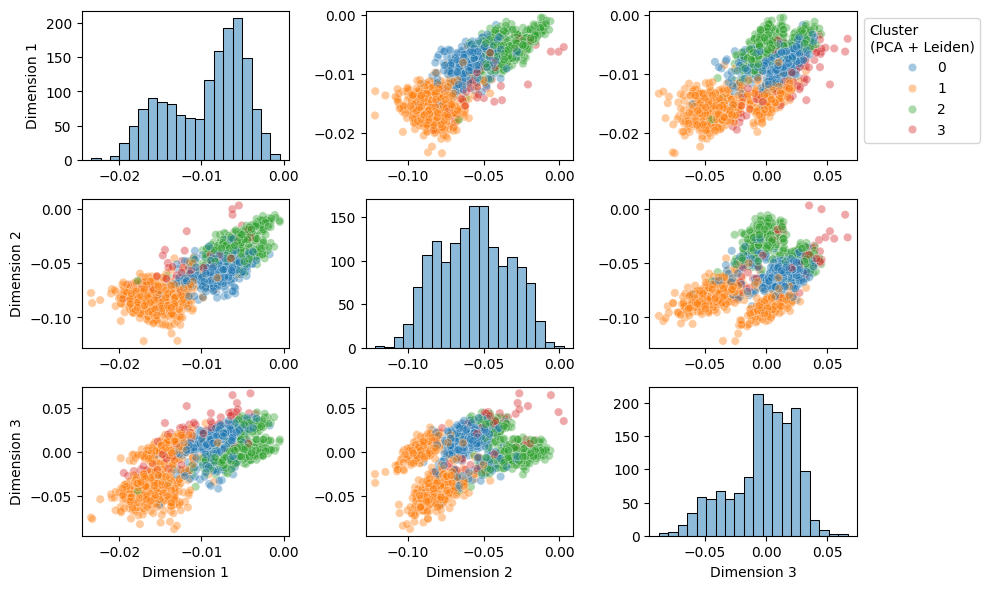

In [599]:
embeddings_2_plot = data.obsm["X_nmd_norm_r3"]
_, p = embeddings_2_plot.shape

fig, axs = plt.subplots(p, p, figsize=[10, 6], sharex=False) 

hist_y_lim = [0, 250]
hist_bins = 20

scatter_lim = [embeddings_2_plot.min() - 0.01, embeddings_2_plot.max() + 0.01]
scatter_alpha = 0.4

scatter_hue = data.obs["pca_leiden_opt"]
#scatter_hue = data.obs["total_counts"]
#scatter_hue = None


for i, row in enumerate(axs):
    for j, axis in enumerate(row):
        if i == j: # histogram
            sns.histplot(embeddings_2_plot[:,i:(i+1)], ax=axis, legend=False, bins=hist_bins)
        else:
            use_legend = (i == 0 and j == (p - 1)) and (scatter_hue is not None)
            sns.scatterplot(
                y=embeddings_2_plot[:,i:(i+1)].flatten(), 
                x=embeddings_2_plot[:,j:(j+1)].flatten(), 
                alpha=scatter_alpha,
                hue = scatter_hue,
#                size = data.obs["total_counts_scale"],
                ax=axis, legend=use_legend,
            )
            if use_legend:
                sns.move_legend(axis, "upper left", bbox_to_anchor=(1, 1))
                axis.legend_.set_title("Cluster\n(PCA + Leiden)")
        if j == 0:
            axis.set_ylabel(f"Dimension {i + 1}")
        else: 
            axis.set_ylabel(None)
        if i == len(row)-1:
            axis.set_xlabel(f"Dimension {j + 1}")
        else:
            axis.set_xlabel(None)

plt.tight_layout()


plt.savefig(fig_path_rank3_norm_nmd + "embedding_plot_nmd_norm_r3_huePCACluster.svg", format="svg")
plt.show()            

In [329]:
data.obsm.keys()

KeysView(AxisArrays with keys: X_nmd_counts_k2, X_nmd_norm_k1, X_nmd_norm_k2, X_pca, X_umap, X_nmd_counts_r2, X_nmd_norm_r1, X_nmd_norm_r3)

## Plots for normalized rank 2 NMD

In [88]:
fig_path_rank2_norm_nmd = "./S3/figures/rank2_norm_nmd/"

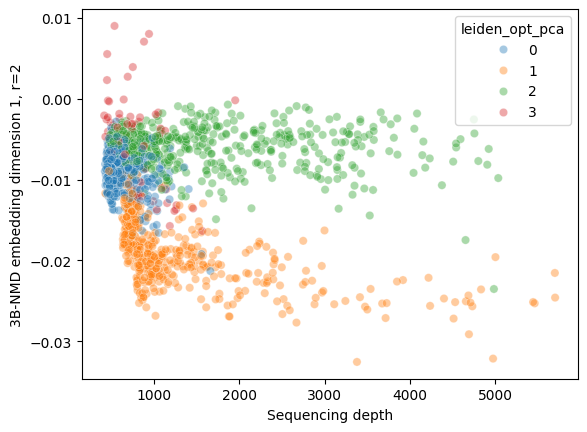

In [153]:
scatter_seqdepth_nmddim1_normk2 = sns.scatterplot(y=data.obsm["X_nmd_norm_k2"][:,:1].flatten(), 
                                             x=data.obs["total_counts"], 
                                             hue=data.obs['pca_leiden_opt'], alpha = 0.4)
plt.ylabel("3B-NMD embedding dimension 1, r=2")
plt.xlabel("Sequencing depth")
scatter_seqdepth_nmddim1_normk2.legend_.set_title("Cluster\n(PCA + Leiden)")

plt.savefig(fig_path_rank2_norm_nmd + "./scatter_seqdepth_nmddim1_normk2.svg", format="svg")

plt.show()

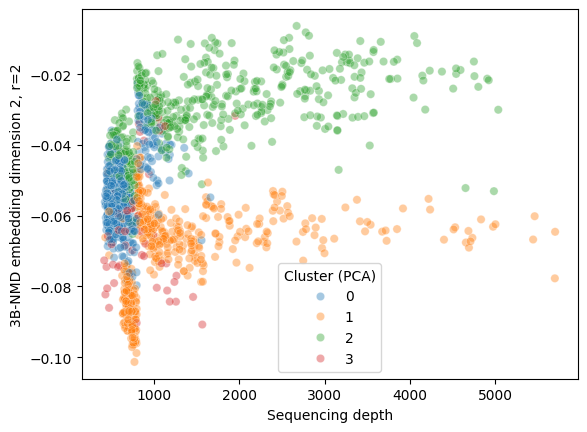

In [157]:
scatter_seqdepth_nmddim2_normk2 = sns.scatterplot(y=data.obsm["X_nmd_norm_k2"][:,1:2].flatten(), 
                                             x=data.obs["total_counts"], 
                                             hue=data.obs['pca_leiden_opt'], alpha = 0.4)
plt.ylabel("3B-NMD embedding dimension 2, r=2")
plt.xlabel("Sequencing depth")
scatter_seqdepth_nmddim2_normk2.legend_.set_title("Cluster\n(PCA + Leiden)")

plt.savefig(fig_path_rank2_norm_nmd + "./scatter_seqdepth_nmddim2_normk2.svg", format="svg")

plt.show()

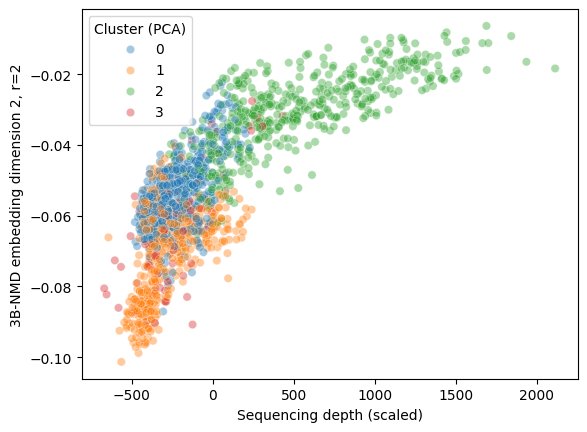

In [81]:
scatter_seqdepth_nmddim2_normk2 = sns.scatterplot(y=data.obsm["X_nmd_norm_k2"][:,1:2].flatten(), 
                                             x=data.obs["total_counts_scale"], 
                                             hue=data.obs['pca_leiden_opt'], alpha = 0.4)
plt.ylabel("3B-NMD embedding dimension 2, r=2")
plt.xlabel("Sequencing depth (scaled)")
scatter_seqdepth_nmddim2_normk2.legend_.set_title("Cluster (PCA)")

# plt.savefig(fig_path_rank2_norm_nmd + "./scatter_seqdepth_nmddim2_normk2.svg", format="svg")

plt.show()

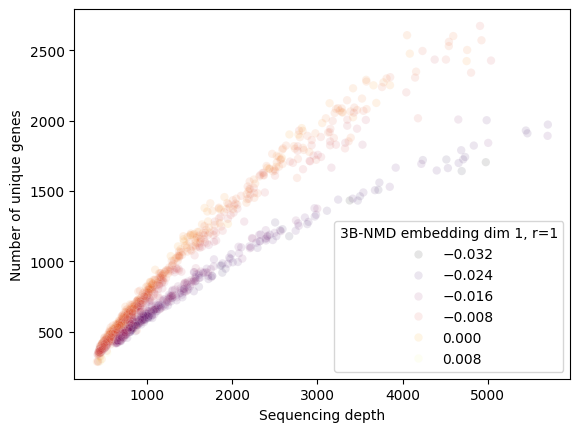

In [158]:
scatter_seqdepth_uniquegenes_hue_nmd_dim1_normk2 = sns.scatterplot(x=data.obs["total_counts"], 
                                                                y=data.obs["n_genes"], 
                                                              hue=data.obsm["X_nmd_norm_k2"][:,:1].flatten(), 
                                                              alpha = 0.1, palette="inferno")
plt.ylabel("Number of unique genes")
plt.xlabel("Sequencing depth")
scatter_seqdepth_uniquegenes_hue_nmd_dim1_normk2.axes.legend_.set_title("3B-NMD embedding dim 1, r=1")

plt.savefig(fig_path_rank2_norm_nmd + "./scatter_seqdepth_uniquegenes_hue_nmd_normk2_dim1.svg", format="svg")

plt.show()

In [85]:
data.obs.keys()

Index(['n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts',
       'log1p_total_counts', 'outlier', 'n_genes', 'total_counts_norm',
       'total_counts_scale', 'embedding_reliability', 'reliability_score',
       'null_reliability_score', 'pca_leiden_opt'],
      dtype='object')

NameError: name 'fig_path_rank2_norm_nmd' is not defined

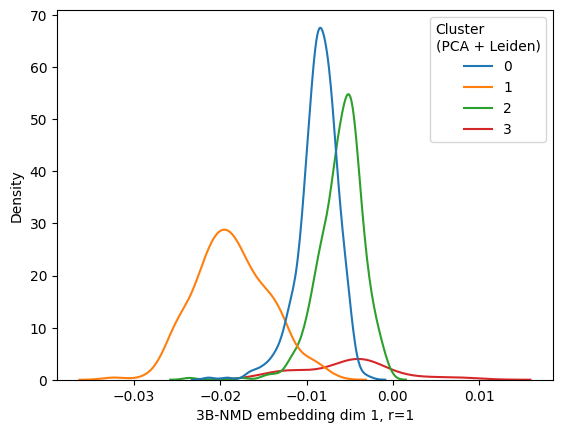

In [351]:
kde_nmd_dim1_normk2_pca_cluster = sns.kdeplot(
    x=data.obsm["X_nmd_norm_k2"][:,:1].flatten(), 
    hue=data.obs['pca_leiden_opt'])
plt.xlabel("3B-NMD embedding dim 1, r=1")
kde_nmd_dim1_normk2_pca_cluster.axes.legend_.set_title("Cluster\n(PCA + Leiden)")

plt.savefig(fig_path_rank2_norm_nmd + "./kde_nmd_dim1_normk2_pca_cluster.svg", format="svg")

plt.show()

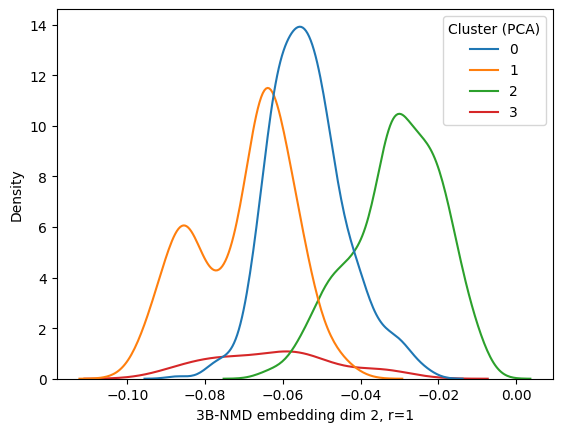

In [90]:
kde_nmd_dim2_normk2_pca_cluster = sns.kdeplot(
    x=data.obsm["X_nmd_norm_k2"][:,1:2].flatten(), 
    hue=data.obs['pca_leiden_opt'])
plt.xlabel("3B-NMD embedding dim 2, r=1")
kde_nmd_dim2_normk2_pca_cluster.axes.legend_.set_title("Cluster (PCA)")

plt.savefig(fig_path_rank2_norm_nmd + "./kde_nmd_dim2_normk2_pca_cluster.svg", format="svg")

plt.show()

In [91]:
data.obsm.keys()

KeysView(AxisArrays with keys: X_nmd_counts_k2, X_nmd_norm_k1, X_nmd_norm_k2, X_pca, X_umap)

Text(0, 0.5, '3B-NMD embedding dim 2, r=2')

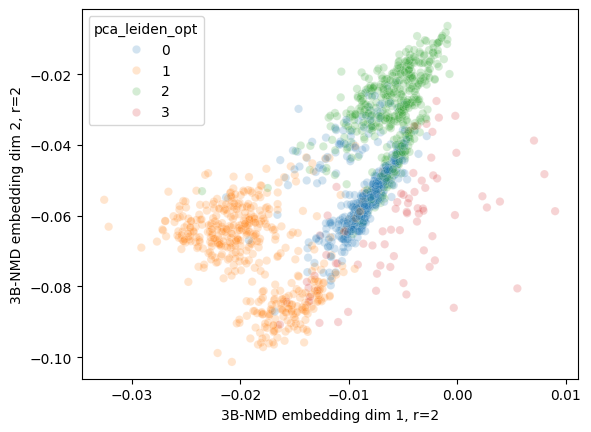

In [106]:
sns.scatterplot(x=data.obsm['X_nmd_norm_k2'][:,0:1].flatten(), 
                y=data.obsm['X_nmd_norm_k2'][:,1:2].flatten(), 
                hue=data.obs['pca_leiden_opt'], alpha=0.2)
plt.xlabel("3B-NMD embedding dim 1, r=2")
plt.ylabel("3B-NMD embedding dim 2, r=2")

### Plots for raw count rank 2 NMD

In [59]:
fig_path_rank2_count_nmd = "./S3/figures/rank2_count_nmd/"

In [163]:
data.obsm

AxisArrays with keys: X_pca, X_nmd_counts_k2, X_nmd_norm_k1, X_nmd_norm_k2

In [198]:
importlib.reload(nmd_plot)

<module 'tools.util_plot' from '/dss/dsshome1/07/di35buw/NMD/BacSC/tools/util_plot.py'>

In [248]:
print(f"Numpy version: {np.version.version}")
print(f"Seaborn version: {sns.__version__}")

Numpy version: 1.24.4
Seaborn version: 0.13.2


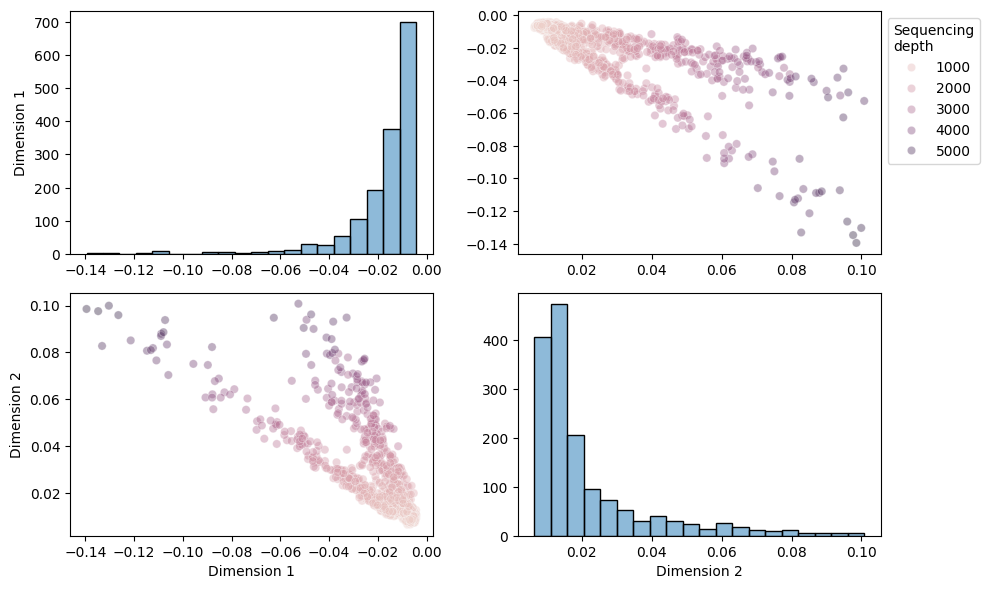

In [600]:
embeddings_2_plot = data.obsm["X_nmd_counts_k2"]
_, p = embeddings_2_plot.shape

fig, axs = plt.subplots(p, p, figsize=[10, 6], sharex=False) 

hist_y_lim = [0, 250]
hist_bins = 20

scatter_lim = [embeddings_2_plot.min() - 0.01, embeddings_2_plot.max() + 0.01]
scatter_alpha = 0.4

#scatter_hue = data.obs["pca_leiden_opt"]
scatter_hue = data.obs["total_counts"]
#scatter_hue = None


for i, row in enumerate(axs):
    for j, axis in enumerate(row):
        if i == j: # histogram
            sns.histplot(embeddings_2_plot[:,i:(i+1)], ax=axis, legend=False, bins=hist_bins)
        else:
            use_legend = (i == 0 and j == (p - 1)) and (scatter_hue is not None)
            sns.scatterplot(
                y=embeddings_2_plot[:,i:(i+1)].flatten(), 
                x=embeddings_2_plot[:,j:(j+1)].flatten(), 
                alpha=scatter_alpha,
                hue = scatter_hue,
                ax=axis, legend=use_legend,
            )
            if use_legend:
                sns.move_legend(axis, "upper left", bbox_to_anchor=(1, 1))
                axis.legend_.set_title("Sequencing\ndepth")
        if j == 0:
            axis.set_ylabel(f"Dimension {i + 1}")
        else: 
            axis.set_ylabel(None)
        if i == len(row)-1:
            axis.set_xlabel(f"Dimension {j + 1}")
        else:
            axis.set_xlabel(None)

plt.tight_layout()
plt.savefig(fig_path_rank2_count_nmd + "embedding_plot_nmd_count_r2_hueSeqDepth.svg", format="svg")
plt.show()            

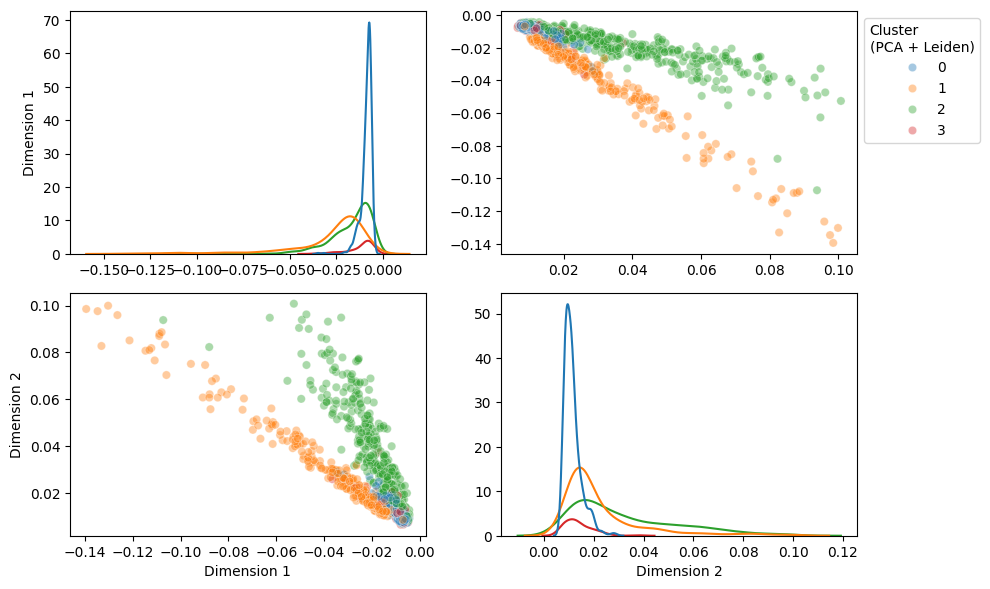

In [10]:
embeddings_2_plot = data.obsm["X_nmd_counts_k2"]
_, p = embeddings_2_plot.shape

fig, axs = plt.subplots(p, p, figsize=[10, 6], sharex=False) 

hist_y_lim = [0, 250]
hist_bins = 20

scatter_lim = [embeddings_2_plot.min() - 0.01, embeddings_2_plot.max() + 0.01]
scatter_alpha = 0.4

scatter_hue = data.obs["pca_leiden_opt"]
#scatter_hue = data.obs["total_counts"]
#scatter_hue = None


for i, row in enumerate(axs):
    for j, axis in enumerate(row):
        if i == j: # histogram
            # sns.histplot(embeddings_2_plot[:,i:(i+1)], ax=axis, legend=False, bins=hist_bins)
            sns.kdeplot(x=embeddings_2_plot[:,i:(i+1)].flatten(), ax=axis, legend=False, hue=scatter_hue)
        else:
            use_legend = (i == 0 and j == (p - 1)) and (scatter_hue is not None)
            sns.scatterplot(
                y=embeddings_2_plot[:,i:(i+1)].flatten(), 
                x=embeddings_2_plot[:,j:(j+1)].flatten(), 
                alpha=scatter_alpha,
                hue = scatter_hue,
                ax=axis, legend=use_legend,
            )
            if use_legend:
                sns.move_legend(axis, "upper left", bbox_to_anchor=(1, 1))
                axis.legend_.set_title("Cluster\n(PCA + Leiden)")
        if j == 0:
            axis.set_ylabel(f"Dimension {i + 1}")
        else: 
            axis.set_ylabel(None)
        if i == len(row)-1:
            axis.set_xlabel(f"Dimension {j + 1}")
        else:
            axis.set_xlabel(None)

plt.tight_layout()

plt.savefig(fig_path_rank2_count_nmd + "embedding_plot_nmd_count_r2_huePCACluster_kde.svg", format="svg")

plt.show()            

#### Selection of optimal number of neighbors and optimal UMAP scale via scDEED


In [56]:
data.obsm

AxisArrays with keys: X_nmd_counts_k2, X_nmd_norm_k1, X_nmd_norm_k2, X_pca

In [8]:
importlib.reload(scd)

n_neighborss = [10, 15, 20, 25, 30, 35, 40, 45, 50, 60, 70, 80, 90, 100, 150, 200, 250]
min_dists = [0.05, 0.1, 0.3, 0.5, 0.7]

#### Counts

In [18]:
scdeed_result_counts_r2, rel_scores_counts_r2, null_rel_scores_counts_r2, reliabilities_counts_r2, n_neighbors_opt_counts_r2, min_dist_opt_counts_r2 = scd.scdeed_parameter_selection(
    data, n_neighborss, min_dists, 
    n_pcs=k_opt_counts, 
    rng_seed=674116985, 
    layer = "counts",
    dim_red_method="3B-NMD", 
    dim_red_params={"beta1": beta_opt_counts}, 
    obsm_embedding_key="X_nmd_counts_k2",
    embedding_method="UMAP", 
    similarity_percent=0.5, 
    save_path="S3_filtered_scdeed_nmd_counts_r2")

calculating (10, 0.05) - run 1/85


INFO:fi_nomad.entry:	Initiating run, target_rank: 2, tolerance: None
INFO:fi_nomad.entry:200 total, final loss Not Tracked
INFO:fi_nomad.entry:	Initialization took 8.619599975645542e-05 loop took 49.4913605080219 overall (0.2474568025401095/ea)


calculating (10, 0.1) - run 2/85
calculating (10, 0.3) - run 3/85
calculating (10, 0.5) - run 4/85
calculating (10, 0.7) - run 5/85
calculating (15, 0.05) - run 6/85
calculating (15, 0.1) - run 7/85
calculating (15, 0.3) - run 8/85
calculating (15, 0.5) - run 9/85
calculating (15, 0.7) - run 10/85
calculating (20, 0.05) - run 11/85
calculating (20, 0.1) - run 12/85
calculating (20, 0.3) - run 13/85
calculating (20, 0.5) - run 14/85
calculating (20, 0.7) - run 15/85
calculating (25, 0.05) - run 16/85
calculating (25, 0.1) - run 17/85
calculating (25, 0.3) - run 18/85
calculating (25, 0.5) - run 19/85
calculating (25, 0.7) - run 20/85
calculating (30, 0.05) - run 21/85
calculating (30, 0.1) - run 22/85
calculating (30, 0.3) - run 23/85
calculating (30, 0.5) - run 24/85
calculating (30, 0.7) - run 25/85
calculating (35, 0.05) - run 26/85
calculating (35, 0.1) - run 27/85
calculating (35, 0.3) - run 28/85
calculating (35, 0.5) - run 29/85
calculating (35, 0.7) - run 30/85
calculating (40, 

In [19]:
scdeed_result_counts_r2.sort_values(by="num_dubious")

,n_neighbors,min_dist,mean_rel,mean_null_rel,num_dubious,num_trustworthy,share_dubious,share_trustworthy
16,25,0.10,0.390431,0.487802,39,1,0.025259,0.000648
10,20,0.05,0.389137,0.503097,53,0,0.034326,0.000000
46,60,0.10,0.382536,0.525418,56,0,0.036269,0.000000
11,20,0.10,0.360148,0.490483,60,0,0.038860,0.000000
25,35,0.05,0.410968,0.496414,71,0,0.045984,0.000000
...,...,...,...,...,...,...,...,...
54,70,0.70,0.366733,0.501735,301,10,0.194948,0.006477
57,80,0.30,0.349642,0.516629,306,0,0.198187,0.000000
67,100,0.30,0.346934,0.532727,317,0,0.205311,0.000000
77,200,0.30,0.360028,0.509462,324,7,0.209845,0.004534


In [459]:
n_neighbors_opt_counts_r2 = 25
min_dist_opt_counts_r2 = 0.1

In [460]:
print(f"Optimal number of neighbors: {n_neighbors_opt_counts_r2}")
print(f"Optimal min_dist: {min_dist_opt_counts_r2}")

sns.lineplot(data=scdeed_result_counts_r2, x="n_neighbors", y="num_dubious", hue="min_dist", palette="tab10")
plt.title("scDEED results")
plt.ylabel("Number of dubiously embedded cells")
plt.show()

Optimal number of neighbors: 25
Optimal min_dist: 0.1


NameError: name 'scdeed_result_counts_r2' is not defined

In [21]:
sc.pp.neighbors(data, n_neighbors=n_neighbors_opt_counts_r2, 
                n_pcs=k_opt_counts, use_rep="X_nmd_counts_k2", 
                key_added="nmd_counts_r2")

In [90]:
data

AnnData object with n_obs × n_vars = 1544 × 5553
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'outlier', 'n_genes', 'total_counts_norm', 'total_counts_scale', 'embedding_reliability', 'reliability_score', 'null_reliability_score', 'pca_leiden_opt'
    var: 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'var_counts', 'nb_mean', 'nb_overdisp', 'nb_overdisp_cutoff', 'nb_overdisp_cutoff_bfgs', 'nb_overdisp_bfgs', 'mean', 'std'
    uns: 'pca', 'nmd_counts_r2', 'pca_leiden', 'pca_leiden_opt_colors', 'pca_neighbors'
    obsm: 'X_nmd_counts_k2', 'X_nmd_norm_k1', 'X_nmd_norm_k2', 'X_pca'
    varm: 'NMD_components_counts_k2', 'NMD_components_norm_k1', 'NMD_components_norm_k2', 'PCs'
    layers: 'Theta_counts_k2', 'Theta_norm_k1', 'Theta_norm_k2', 'counts', 'normalized_counts', 'vst_counts'
    obsp: 'nmd_counts_r2_distances', 'nmd_counts

In [22]:
sc.tl.umap(data, neighbors_key="nmd_counts_r2", 
           min_dist=min_dist_opt_counts_r2, spread=1)

... storing 'embedding_reliability' as categorical


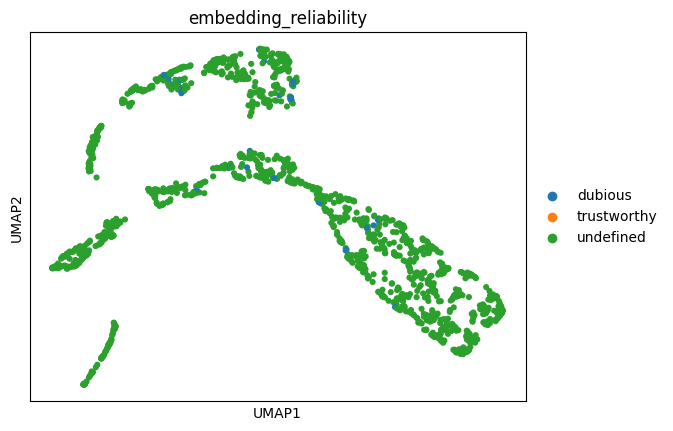

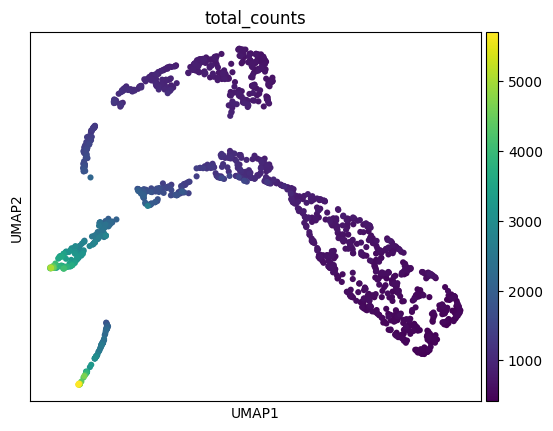

In [23]:
sc.pl.umap(data, color="embedding_reliability", alpha=1, 
           layer="counts", neighbors_key="nmd_counts_r2")
plt.show()

sc.pl.umap(data, color="total_counts", alpha=1, cmap="viridis", 
           layer="counts", neighbors_key="nmd_counts_r2")
plt.show()

In [95]:
data.obsm.keys()

KeysView(AxisArrays with keys: X_nmd_counts_k2, X_nmd_norm_k1, X_nmd_norm_k2, X_pca, X_umap)

#### Normalized counts latent dimension 3

In [552]:
n_neighborss = [10, 15, 20, 25, 30, 35, 40, 45, 50, 60, 70, 80, 90, 100, 150, 200, 250]
min_dists = [0.05, 0.1, 0.3, 0.5, 0.7]

In [553]:
scdeed_result_norm_r3, rel_scores_norm_r3, null_rel_scores_counts_r3, reliabilities_norm_r3, n_neighbors_opt_norm_r3, min_dist_opt_norm_r3 = scd.scdeed_parameter_selection(
    data, n_neighborss, min_dists, 
    n_pcs=3, 
    rng_seed=674116985, 
    layer = "normalized_counts",
    dim_red_method="3B-NMD", 
    dim_red_params={"beta1": beta_opt_norm}, 
    obsm_embedding_key="X_nmd_norm_k3",
    embedding_method="UMAP", 
    similarity_percent=0.5, 
    save_path="S3_filtered_scdeed_nmd_norm_r3")

calculating (10, 0.05) - run 1/85


INFO:fi_nomad.entry:	Initiating run, target_rank: 3, tolerance: None
INFO:fi_nomad.entry:300 total, final loss Not Tracked
INFO:fi_nomad.entry:	Initialization took 6.897398270666599e-05 loop took 77.88634657696821 overall (0.2596211552565607/ea)
INFO:fi_nomad.entry:	Initiating run, target_rank: 3, tolerance: None
INFO:fi_nomad.entry:300 total, final loss Not Tracked
INFO:fi_nomad.entry:	Initialization took 7.972901221364737e-05 loop took 74.85345553304069 overall (0.24951151844346897/ea)


calculating (10, 0.1) - run 2/85
calculating (10, 0.3) - run 3/85
calculating (10, 0.5) - run 4/85
calculating (10, 0.7) - run 5/85
calculating (15, 0.05) - run 6/85
calculating (15, 0.1) - run 7/85
calculating (15, 0.3) - run 8/85
calculating (15, 0.5) - run 9/85
calculating (15, 0.7) - run 10/85
calculating (20, 0.05) - run 11/85
calculating (20, 0.1) - run 12/85
calculating (20, 0.3) - run 13/85
calculating (20, 0.5) - run 14/85
calculating (20, 0.7) - run 15/85
calculating (25, 0.05) - run 16/85
calculating (25, 0.1) - run 17/85
calculating (25, 0.3) - run 18/85
calculating (25, 0.5) - run 19/85
calculating (25, 0.7) - run 20/85
calculating (30, 0.05) - run 21/85
calculating (30, 0.1) - run 22/85
calculating (30, 0.3) - run 23/85
calculating (30, 0.5) - run 24/85
calculating (30, 0.7) - run 25/85
calculating (35, 0.05) - run 26/85
calculating (35, 0.1) - run 27/85
calculating (35, 0.3) - run 28/85
calculating (35, 0.5) - run 29/85
calculating (35, 0.7) - run 30/85
calculating (40, 

Optimal number of neighbors: 200
Optimal min_dist: 0.1


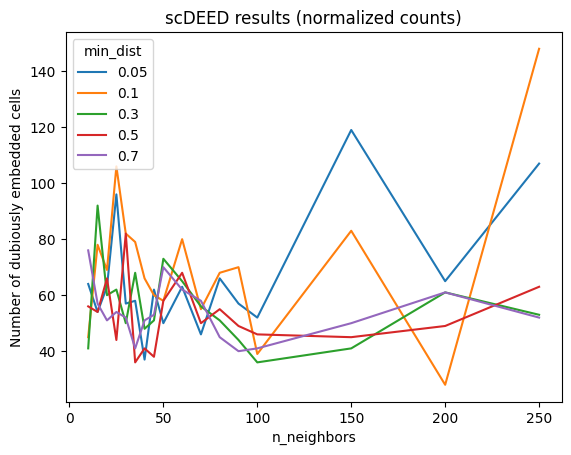

In [554]:
print(f"Optimal number of neighbors: {n_neighbors_opt_norm_r3}")
print(f"Optimal min_dist: {min_dist_opt_norm_r3}")

sns.lineplot(data=scdeed_result_norm_r3, x="n_neighbors", y="num_dubious", 
             hue="min_dist", palette="tab10")
plt.title("scDEED results (normalized counts)")
plt.ylabel("Number of dubiously embedded cells")
plt.show()

In [557]:
data.obsm.keys()

KeysView(AxisArrays with keys: X_nmd_counts_k2, X_nmd_norm_k1, X_nmd_norm_k2, X_pca, X_umap, X_nmd_counts_r2, X_nmd_norm_r1, X_nmd_norm_r3)

In [558]:
sc.pp.neighbors(data, n_neighbors=n_neighbors_opt_norm_r3, 
                n_pcs=3, use_rep="X_nmd_norm_r3", key_added="nmd_norm_r3")

sc.tl.umap(data, neighbors_key="nmd_norm_r3", 
           min_dist=min_dist_opt_norm_r3, spread=1)

... storing 'embedding_reliability' as categorical


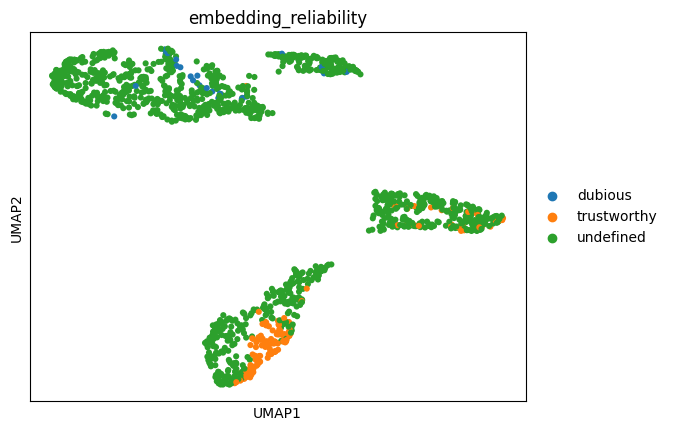

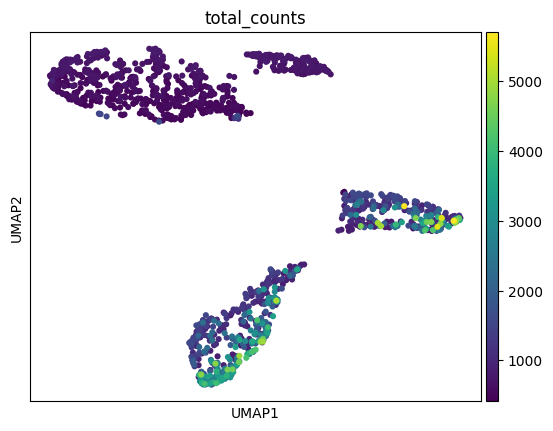

In [559]:
sc.pl.umap(data, color="embedding_reliability", alpha=1, 
           layer="normalized_counts", neighbors_key="nmd_norm_r3")
plt.show()

sc.pl.umap(data, color="total_counts", alpha=1, cmap="viridis", 
           layer="normalized_counts", neighbors_key="nmd_norm_r3")
plt.show()

In [100]:
data.write_h5ad("./S3_NMD_counts_norm_r1r2_PCA.h5ad")

## Clustering

### Counts

In [466]:
data_train_counts, data_test_counts = cs.countsplit_adata(
    data, data_dist="NB", beta_key="nb_overdisp_cutoff", 
    layer="counts", min_genes=1, max_counts=1e9, seed=1535741)

In [468]:
X_train_counts = ut.convert_to_dense_counts(data_train_counts, layer="counts")
m, n = X_train_counts.shape
W0_train_counts, H0_train_counts = cs.nuclear_norm_init(X_train_counts, m, n, int(k_opt_counts))

X_test_counts = ut.convert_to_dense_counts(data_test_counts, layer="counts")
W0_test_counts, H0_test_counts = cs.nuclear_norm_init(X_test_counts, m, n, int(k_opt_counts))

In [470]:
init_strat = InitializationStrategy.KNOWN_MATRIX
kernel_strat = KernelStrategy.MOMENTUM_3_BLOCK_MODEL_FREE

kernel_params_counts_train = kernelInputTypes.Momentum3BlockAdditionalParameters(
        momentum_beta=beta_opt_counts, 
        candidate_factor_W0=W0_train_counts, candidate_factor_H0=H0_train_counts,
)

kernel_params_counts_test = kernelInputTypes.Momentum3BlockAdditionalParameters(
        momentum_beta=beta_opt_counts, 
        candidate_factor_W0=W0_test_counts, candidate_factor_H0=H0_test_counts,
)

In [471]:
nmd_result_counts_train = nmd.decompose(
                X_train_counts, int(k_opt_counts), 
                kernel_strategy=kernel_strat, 
                initialization=init_strat,                  
                kernel_params=kernel_params_counts_train, 
                manual_max_iterations=200,   
                verbose=True, tolerance=None)

INFO:fi_nomad.entry:	Initiating run, target_rank: 2, tolerance: None
INFO:fi_nomad.entry:200 total, final loss Not Tracked
INFO:fi_nomad.entry:	Initialization took 9.81469638645649e-05 loop took 49.28387585503515 overall (0.24641937927517574/ea)


In [472]:
nmd_result_counts_test = nmd.decompose(
                X_test_counts, int(k_opt_counts), 
                kernel_strategy=kernel_strat, 
                initialization=init_strat,                  
                kernel_params=kernel_params_counts_test, 
                manual_max_iterations=200,   
                verbose=True, tolerance=None)

INFO:fi_nomad.entry:	Initiating run, target_rank: 2, tolerance: None
INFO:fi_nomad.entry:200 total, final loss Not Tracked
INFO:fi_nomad.entry:	Initialization took 3.226997796446085e-05 loop took 49.57931304501835 overall (0.24789656522509176/ea)


In [473]:
data_train_counts.obsm["NMD_counts_k2"] = nmd_result_counts_train.factors[0]
data_train_counts.varm["NMD_components_counts_k2"] = nmd_result_counts_train.factors[1].T
data_train_counts.layers["Theta_counts_k2"] = nmd_result_counts_train.factors[0] @ nmd_result_counts_train.factors[1]

data_test_counts.obsm["NMD_counts_k2"] = nmd_result_counts_test.factors[0]
data_test_counts.varm["NMD_components_counts_k2"] = nmd_result_counts_test.factors[1].T
data_test_counts.layers["Theta_counts_k2"] = nmd_result_counts_test.factors[0] @ nmd_result_counts_train.factors[1]

In [475]:
data_train_counts

AnnData object with n_obs × n_vars = 1544 × 5507
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'outlier', 'n_genes', 'total_counts_norm', 'total_counts_scale', 'embedding_reliability', 'reliability_score', 'null_reliability_score', 'pca_leiden_opt', 'n_counts', 'n_PCs_by_counts', 'log1p_n_PCs_by_counts'
    var: 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'var_counts', 'nb_mean', 'nb_overdisp', 'nb_overdisp_cutoff', 'nb_overdisp_cutoff_bfgs', 'nb_overdisp_bfgs', 'mean', 'std'
    obsm: 'NMD_counts_k2'
    varm: 'NMD_components_counts_k2'
    layers: 'counts', 'Theta_counts_k2'

In [514]:
sc.pp.neighbors(data_train_counts, 
                n_neighbors=n_neighbors_opt_counts_r2, 
                n_pcs=int(k_opt_counts), 
                use_rep="NMD_counts_k2", key_added="nmd_counts_r2")
sc.tl.umap(data_train_counts, neighbors_key="nmd_counts_r2", 
           min_dist=min_dist_opt_counts_r2, spread=1, random_state=1234)

sc.pp.neighbors(data_test_counts, 
                n_neighbors=n_neighbors_opt_counts_r2, 
                n_pcs=int(k_opt_counts), 
                use_rep="NMD_counts_k2", key_added="nmd_counts_r2")
sc.tl.umap(data_test_counts, neighbors_key="nmd_counts_r2", 
           min_dist=min_dist_opt_counts_r2, spread=1, random_state=1234)

In [515]:
data_train_counts

AnnData object with n_obs × n_vars = 1544 × 5507
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'outlier', 'n_genes', 'total_counts_norm', 'total_counts_scale', 'embedding_reliability', 'reliability_score', 'null_reliability_score', 'pca_leiden_opt', 'n_counts', 'n_PCs_by_counts', 'log1p_n_PCs_by_counts', 'leiden_res0.01', 'leiden_res0.03', 'leiden_res0.05', 'leiden_res0.07', 'leiden_res0.09', 'leiden_res0.11', 'leiden_res0.13', 'leiden_res0.15', 'leiden_res0.17', 'leiden_res0.19', 'leiden_res0.21', 'leiden_res0.23', 'leiden_res0.25', 'leiden_res0.27', 'leiden_res0.29', 'leiden_res0.31', 'leiden_res0.33', 'leiden_res0.35', 'leiden_res0.37', 'leiden_res0.39', 'leiden_res0.41', 'leiden_res0.43', 'leiden_res0.45', 'leiden_res0.47', 'leiden_res0.49'
    var: 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'var_counts', 'nb_mean', 'nb_

In [518]:
theta_opt_counts, mirror_opt_counts, umap_2_opt_counts, ssd_counts = ut.find_opt_umap_rotation(
    data_train_counts.obsm["X_umap"].copy(), 
    data_test_counts.obsm["X_umap"].copy()
)
data_test_counts.obsm["X_umap_rotated"] = umap_2_opt_counts

In [498]:
importlib.reload(co)
res_min = 0.01
res_max = 0.5
res_step = 0.02
resolutions = np.round(np.arange(res_min, res_max, res_step), 2)

co.cluster_train_test(data_train_counts, data_test_counts, resolutions, alg="leiden", 
                      neighbors_key = "nmd_counts_r2",
                      random_state=786469)

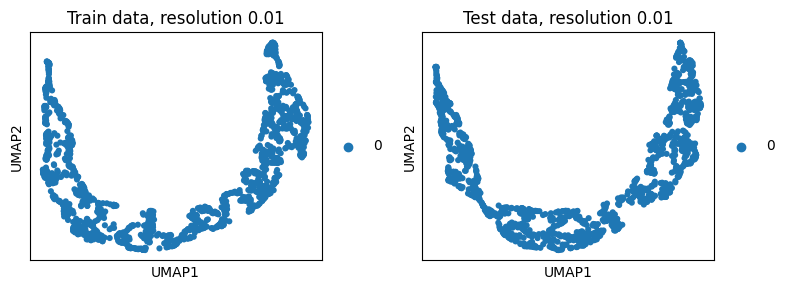

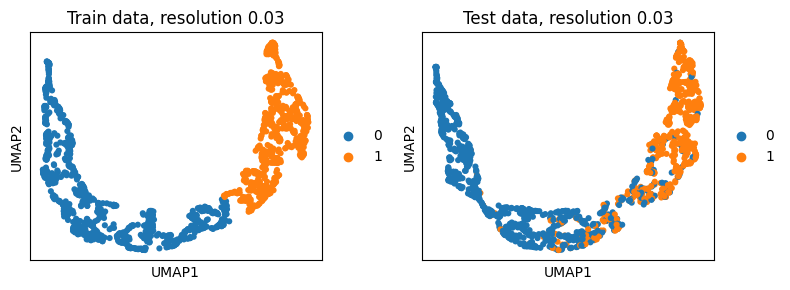

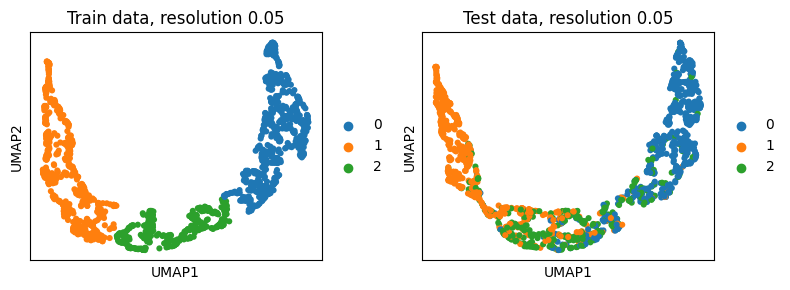

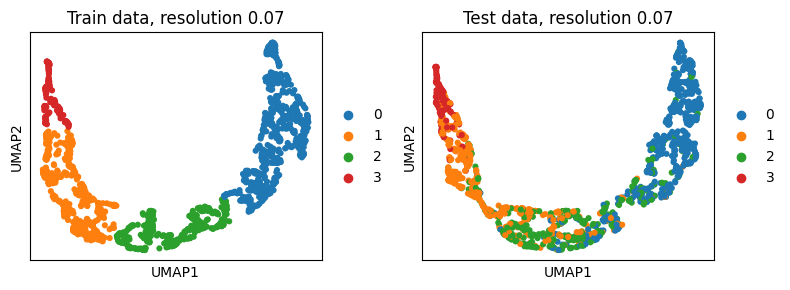

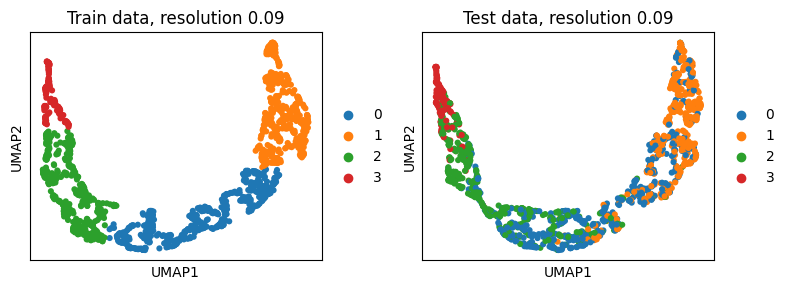

...

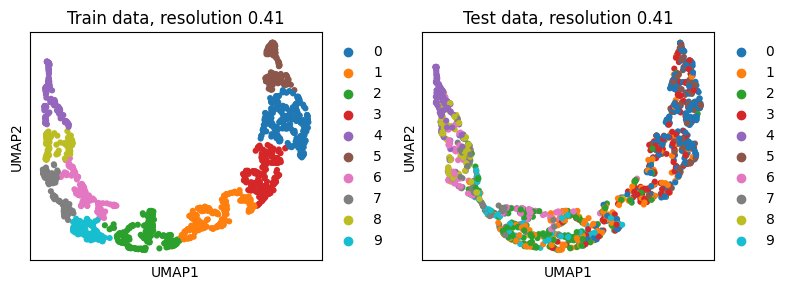

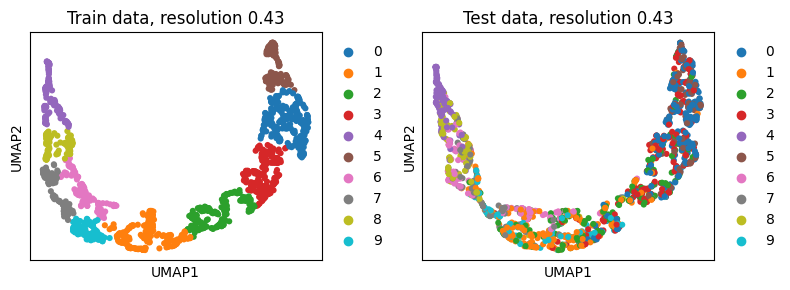

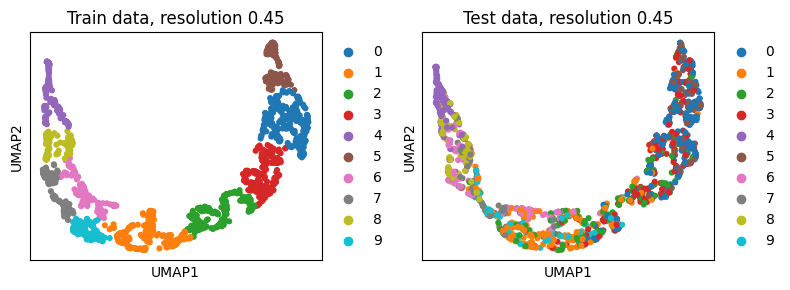

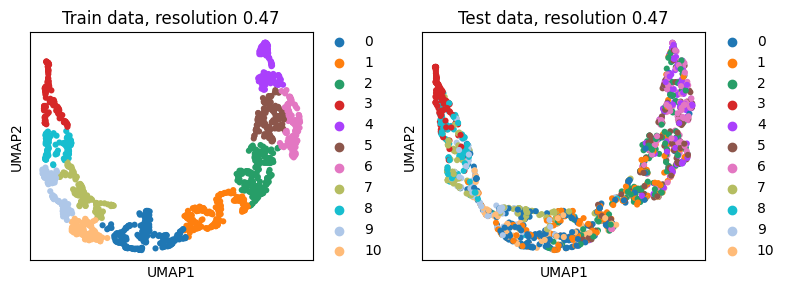

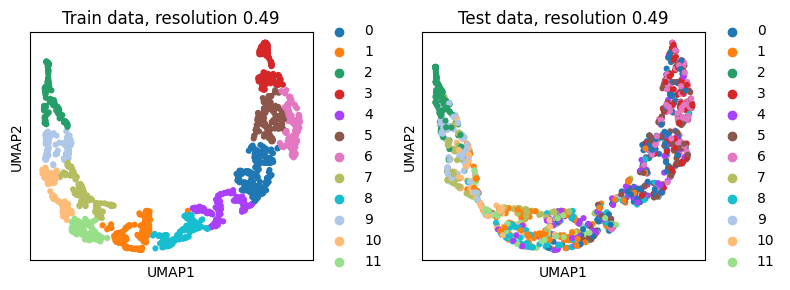

In [519]:
for resolution in resolutions:
    fig, ax = plt.subplots(1, 2, figsize=(8, 3))
    sc.pl.umap(data_train_counts, color=f"leiden_res{resolution}", ax=ax[0], 
               title=f"Train data, resolution {resolution}", show=False)
    sc.pl.embedding(data_test_counts, basis="X_umap_rotated", 
                    color=f"leiden_res{resolution}", 
                    ax=ax[1], title=f"Test data, resolution {resolution}", show=False)
    ax[1].set_xlabel("UMAP1")
    ax[1].set_ylabel("UMAP2")
    plt.tight_layout()
    plt.show()

In [509]:
data_train_counts

AnnData object with n_obs × n_vars = 1544 × 5507
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'outlier', 'n_genes', 'total_counts_norm', 'total_counts_scale', 'embedding_reliability', 'reliability_score', 'null_reliability_score', 'pca_leiden_opt', 'n_counts', 'n_PCs_by_counts', 'log1p_n_PCs_by_counts', 'leiden_res0.01', 'leiden_res0.03', 'leiden_res0.05', 'leiden_res0.07', 'leiden_res0.09', 'leiden_res0.11', 'leiden_res0.13', 'leiden_res0.15', 'leiden_res0.17', 'leiden_res0.19', 'leiden_res0.21', 'leiden_res0.23', 'leiden_res0.25', 'leiden_res0.27', 'leiden_res0.29', 'leiden_res0.31', 'leiden_res0.33', 'leiden_res0.35', 'leiden_res0.37', 'leiden_res0.39', 'leiden_res0.41', 'leiden_res0.43', 'leiden_res0.45', 'leiden_res0.47', 'leiden_res0.49'
    var: 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'var_counts', 'nb_mean', 'nb_

In [499]:
importlib.reload(co)
mod_df_counts, mod_df_wide_counts, res_opt_counts = co.find_optimal_clustering_resolution(
    data_train_counts, data_test_counts, resolutions, 
    neighbors_key="nmd_counts_r2")

print(f"Optimal resolution {res_opt_counts}")

resolution: 0.01 - clusters: 1 - Train: 0.49 - Test: 0.49 - Random: 0.49
resolution: 0.03 - clusters: 2 - Train: 0.479 - Test: 0.403 - Random: 0.242
resolution: 0.05 - clusters: 3 - Train: 0.471 - Test: 0.34 - Random: 0.157
resolution: 0.07 - clusters: 4 - Train: 0.464 - Test: 0.31 - Random: 0.13
resolution: 0.09 - clusters: 4 - Train: 0.458 - Test: 0.281 - Random: 0.116
resolution: 0.11 - clusters: 5 - Train: 0.454 - Test: 0.24 - Random: 0.089
resolution: 0.13 - clusters: 6 - Train: 0.45 - Test: 0.197 - Random: 0.066
resolution: 0.15 - clusters: 6 - Train: 0.447 - Test: 0.192 - Random: 0.062
resolution: 0.17 - clusters: 6 - Train: 0.443 - Test: 0.206 - Random: 0.063
resolution: 0.19 - clusters: 7 - Train: 0.441 - Test: 0.177 - Random: 0.047
resolution: 0.21 - clusters: 7 - Train: 0.437 - Test: 0.164 - Random: 0.044
resolution: 0.23 - clusters: 8 - Train: 0.434 - Test: 0.146 - Random: 0.036
resolution: 0.25 - clusters: 8 - Train: 0.431 - Test: 0.154 - Random: 0.033
resolution: 0.27 - c

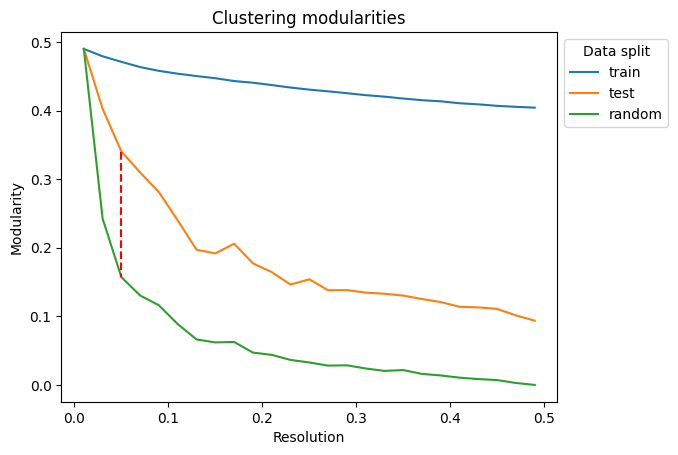

In [501]:
fig, ax = plt.subplots() 
sns.lineplot(data=mod_df_counts, x="resolution", y="score", hue="type")
ax.set(title="Clustering modularities", xlabel="Resolution", ylabel="Modularity")

ax.plot(
    [res_opt_counts, res_opt_counts], 
    [mod_df_counts[(mod_df_counts["resolution"] == res_opt_counts) & (mod_df_counts["type"] == "test")]["score"],
      mod_df_counts[(mod_df_counts["resolution"] == res_opt_counts) & (mod_df_counts["type"] == "random")]["score"]],
    linestyle="dashed", color="red"
)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
ax.legend_.set_title("Data split")

plt.savefig(fig_path_rank2_count_nmd + "modularities_plot_nmd_counts_r2_NMDCluster.svg", format="svg")
plt.show()

In [520]:
sc.tl.leiden(data, resolution=res_opt_counts, key_added="nmd_counts_leiden_opt", 
             neighbors_key="nmd_counts_r2")

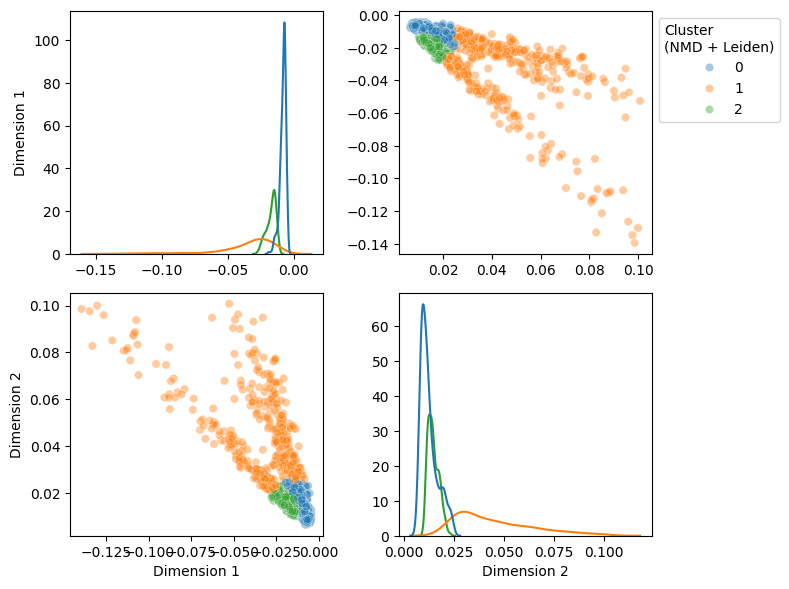

In [11]:
embeddings_2_plot = data.obsm["X_nmd_counts_k2"]
_, p = embeddings_2_plot.shape

fig, axs = plt.subplots(p, p, figsize=[8, 6], sharex=False) 

hist_y_lim = [0, 250]
hist_bins = 20

scatter_lim = [embeddings_2_plot.min() - 0.01, embeddings_2_plot.max() + 0.01]
scatter_alpha = 0.4

scatter_hue = data.obs["nmd_counts_leiden_opt"]
#scatter_hue = data.obs["total_counts"]
#scatter_hue = None


for i, row in enumerate(axs):
    for j, axis in enumerate(row):
        if i == j: # histogram
            # sns.histplot(embeddings_2_plot[:,i:(i+1)], ax=axis, legend=False, bins=hist_bins)
            sns.kdeplot(x=embeddings_2_plot[:,i:(i+1)].flatten(), ax=axis, legend=False, hue=scatter_hue)
        else:
            use_legend = (i == 0 and j == (p - 1)) and (scatter_hue is not None)
            sns.scatterplot(
                y=embeddings_2_plot[:,i:(i+1)].flatten(), 
                x=embeddings_2_plot[:,j:(j+1)].flatten(), 
                alpha=scatter_alpha,
                hue = scatter_hue,
                ax=axis, legend=use_legend,
            )
            if use_legend:
                sns.move_legend(axis, "upper left", bbox_to_anchor=(1, 1))
                axis.legend_.set_title("Cluster\n(NMD + Leiden)")
        if j == 0:
            axis.set_ylabel(f"Dimension {i + 1}")
        else: 
            axis.set_ylabel(None)
        if i == len(row)-1:
            axis.set_xlabel(f"Dimension {j + 1}")
        else:
            axis.set_xlabel(None)

plt.tight_layout()


plt.savefig(fig_path_rank2_count_nmd + "embedding_plot_nmd_counts_r2_hueNMDCluster_kde.svg", format="svg")
plt.show()            

In [528]:
k_opt_pca = 3
n_neighbors_opt_pca = 50
min_dist_opt_pca = 0.3

In [530]:
sc.pp.neighbors(data, n_neighbors=n_neighbors_opt_pca, 
                n_pcs=k_opt_pca, key_added="PCA")

sc.tl.umap(data, min_dist=min_dist_opt_pca, spread=1, random_state=1234, neighbors_key="PCA")

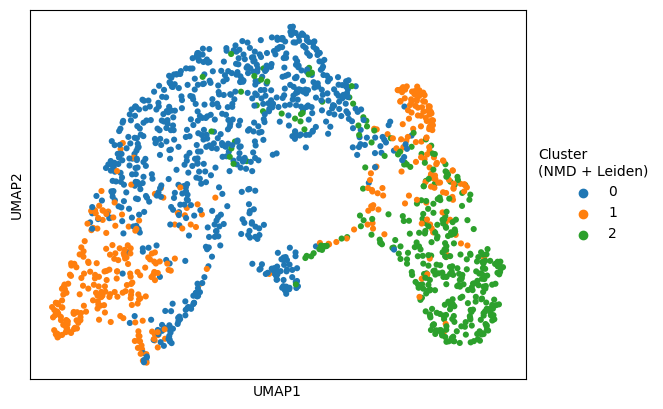

In [60]:
#fig, ax = plt.subplots()
pca_umap_nmd_counts_r2_NMDCluster = sc.pl.umap(
    data, color="nmd_counts_leiden_opt", 
    palette=sns.color_palette("tab10"), neighbors_key="PCA", return_fig=True, title="")
pca_umap_nmd_counts_r2_NMDCluster.axes[0].legend_.set_title("Cluster\n(NMD + Leiden)")
plt.savefig(fig_path_rank2_count_nmd + "pca_umap_nmd_counts_r2_NMDCluster_properColors.svg", format="svg")

plt.show()

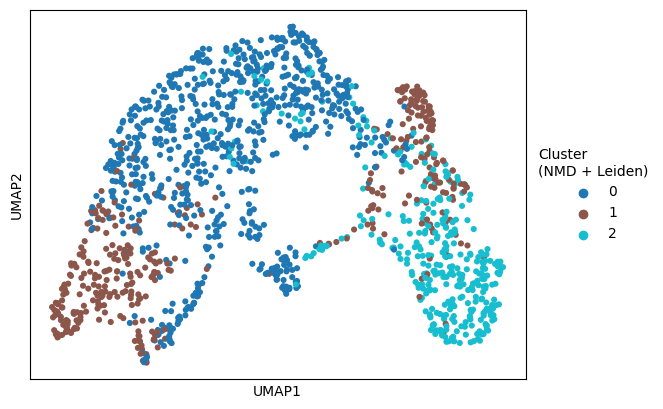

In [539]:
#fig, ax = plt.subplots()
pca_umap_nmd_counts_r2_NMDCluster = sc.pl.umap(
    data, color="nmd_counts_leiden_opt", 
    palette="tab10", neighbors_key="PCA", return_fig=True, title="")
pca_umap_nmd_counts_r2_NMDCluster.axes[0].legend_.set_title("Cluster\n(NMD + Leiden)")
plt.savefig(fig_path_rank2_count_nmd + "pca_umap_nmd_counts_r2_NMDCluster.svg", format="svg")

plt.show()

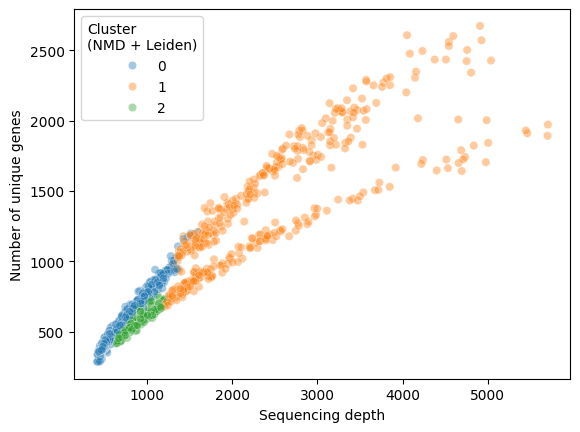

In [63]:
scatter_seqdepth_uniquegenes_hue_nmd_counts_leidenopt = sns.scatterplot(
    x=data.obs["total_counts"], 
    y=data.obs["n_genes"], 
    hue=data.obs["nmd_counts_leiden_opt"], 
    alpha = 0.4)
plt.ylabel("Number of unique genes")
plt.xlabel("Sequencing depth")
scatter_seqdepth_uniquegenes_hue_nmd_counts_leidenopt.axes.legend_.set_title("Cluster\n(NMD + Leiden)")

plt.savefig(fig_path_rank2_count_nmd + "./scatter_seqdepth_uniquegenes_hue_nmd_counts_leidenopt_properAlpha.svg", format="svg")

plt.show()

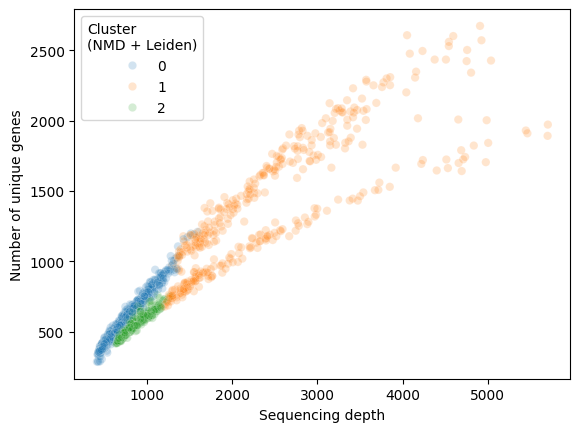

In [583]:
scatter_seqdepth_uniquegenes_hue_nmd_counts_leidenopt = sns.scatterplot(
    x=data.obs["total_counts"], 
    y=data.obs["n_genes"], 
    hue=data.obs["nmd_counts_leiden_opt"], 
    alpha = 0.2)
plt.ylabel("Number of unique genes")
plt.xlabel("Sequencing depth")
scatter_seqdepth_uniquegenes_hue_nmd_counts_leidenopt.axes.legend_.set_title("Cluster\n(NMD + Leiden)")

plt.savefig(fig_path_rank2_count_nmd + "./scatter_seqdepth_uniquegenes_hue_nmd_counts_leidenopt.svg", format="svg")

plt.show()

In [80]:
print(pd.crosstab(data.obs["pca_leiden_opt"], data.obs["nmd_counts_leiden_opt"]).to_latex())

\begin{tabular}{lrrr}
\toprule
nmd\_counts\_leiden\_opt &    0 &    1 &    2 \\
pca\_leiden\_opt &      &      &      \\
\midrule
0              &  478 &    3 &   36 \\
1              &   19 &  154 &  309 \\
2              &  235 &  236 &    0 \\
3              &   51 &    7 &   16 \\
\bottomrule
\end{tabular}



### Normalized counts clustering

In [40]:
data_train_norm

AnnData object with n_obs × n_vars = 1544 × 5007
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'outlier', 'n_genes', 'total_counts_norm', 'total_counts_scale', 'embedding_reliability', 'reliability_score', 'null_reliability_score', 'pca_leiden_opt', 'nmd_counts_leiden_opt', 'nmd_norm_r3_leiden_opt', 'n_counts', 'n_PCs_by_counts', 'log1p_n_PCs_by_counts'
    var: 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'var_counts', 'nb_mean', 'nb_overdisp', 'nb_overdisp_cutoff', 'nb_overdisp_cutoff_bfgs', 'nb_overdisp_bfgs', 'mean', 'std'
    layers: 'counts'

In [47]:
data.layers["counts"].max()

136.0

In [46]:
data.layers["normalized_counts"].max()

23.78095238095238

In [44]:
data_train_norm.layers["counts"].max()


17

In [38]:
data_train_norm, data_test_norm = cs.countsplit_adata(
    data, data_dist="NB", beta_key="nb_overdisp_cutoff", 
    layer="normalized_counts", min_genes=1, max_counts=1e9, seed=1535741)

In [48]:
# achtung normalized

X_train_norm = ut.convert_to_dense_counts(data_train_norm)
m, n = X_train_norm.shape
W0_train_norm, H0_train_norm = cs.nuclear_norm_init(X_train_norm, m, n, 3)

X_test_norm = ut.convert_to_dense_counts(data_test_norm)
W0_test_norm, H0_test_norm = cs.nuclear_norm_init(X_test_norm, m, n, 3)

In [50]:
beta_opt_norm = 0.6

In [51]:
init_strat = InitializationStrategy.KNOWN_MATRIX
kernel_strat = KernelStrategy.MOMENTUM_3_BLOCK_MODEL_FREE

kernel_params_norm_train = kernelInputTypes.Momentum3BlockAdditionalParameters(
        momentum_beta=beta_opt_norm, 
        candidate_factor_W0=W0_train_norm, candidate_factor_H0=H0_train_norm,
)

kernel_params_norm_test = kernelInputTypes.Momentum3BlockAdditionalParameters(
        momentum_beta=beta_opt_norm, 
        candidate_factor_W0=W0_test_norm, candidate_factor_H0=H0_test_norm,
)

In [52]:
nmd_result_norm_train = nmd.decompose(
                X_train_norm, 3, 
                kernel_strategy=kernel_strat, 
                initialization=init_strat,                  
                kernel_params=kernel_params_norm_train, 
                manual_max_iterations=300,   
                verbose=True, tolerance=None)

INFO:fi_nomad.entry:	Initiating run, target_rank: 3, tolerance: None
INFO:fi_nomad.entry:300 total, final loss Not Tracked
INFO:fi_nomad.entry:	Initialization took 9.093299740925431e-05 loop took 54.08356705500046 overall (0.18027855685000152/ea)


In [53]:
nmd_result_norm_test = nmd.decompose(
                X_test_norm, int(3), 
                kernel_strategy=kernel_strat, 
                initialization=init_strat,                  
                kernel_params=kernel_params_norm_test, 
                manual_max_iterations=300,   
                verbose=True, tolerance=None)

INFO:fi_nomad.entry:	Initiating run, target_rank: 3, tolerance: None
INFO:fi_nomad.entry:300 total, final loss Not Tracked
INFO:fi_nomad.entry:	Initialization took 2.9263028409332037e-05 loop took 55.383894337981474 overall (0.1846129811266049/ea)


In [54]:
data_train_norm.obsm["NMD_norm_k3"] = nmd_result_norm_train.factors[0]
data_train_norm.varm["NMD_components_norm_k3"] = nmd_result_norm_train.factors[1].T
data_train_norm.layers["Theta_norm_k3"] = nmd_result_norm_train.factors[0] @ nmd_result_norm_train.factors[1]

data_test_norm.obsm["NMD_norm_k3"] = nmd_result_norm_test.factors[0]
data_test_norm.varm["NMD_components_norm_k3"] = nmd_result_norm_test.factors[1].T
data_test_norm.layers["Theta_norm_k3"] = nmd_result_norm_test.factors[0] @ nmd_result_norm_train.factors[1]

In [56]:
n_neighbors_opt_norm_r3=200
min_dist_opt_norm_r3=0.1

In [57]:
sc.pp.neighbors(data_train_norm, 
                n_neighbors=n_neighbors_opt_norm_r3, 
                n_pcs=int(3), 
                use_rep="NMD_norm_k3", key_added="nmd_norm_r3")
sc.tl.umap(data_train_norm, neighbors_key="nmd_norm_r3", 
           min_dist=min_dist_opt_norm_r3, spread=1, random_state=1234)

sc.pp.neighbors(data_test_norm, 
                n_neighbors=n_neighbors_opt_norm_r3, 
                n_pcs=int(3), 
                use_rep="NMD_norm_k3", key_added="nmd_norm_r3")
sc.tl.umap(data_test_norm, neighbors_key="nmd_norm_r3", 
           min_dist=min_dist_opt_norm_r3, spread=1, random_state=1234, )

In [61]:
data_test_norm

AnnData object with n_obs × n_vars = 1544 × 5007
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'outlier', 'n_genes', 'total_counts_norm', 'total_counts_scale', 'embedding_reliability', 'reliability_score', 'null_reliability_score', 'pca_leiden_opt', 'nmd_counts_leiden_opt', 'nmd_norm_r3_leiden_opt', 'n_PCs_by_counts', 'log1p_n_PCs_by_counts', 'leiden_res0.01', 'leiden_res0.03', 'leiden_res0.05', 'leiden_res0.07', 'leiden_res0.09', 'leiden_res0.11', 'leiden_res0.13', 'leiden_res0.15', 'leiden_res0.17', 'leiden_res0.19', 'leiden_res0.21', 'leiden_res0.23', 'leiden_res0.25', 'leiden_res0.27', 'leiden_res0.29', 'leiden_res0.31', 'leiden_res0.33', 'leiden_res0.35', 'leiden_res0.37', 'leiden_res0.39', 'leiden_res0.41', 'leiden_res0.43', 'leiden_res0.45', 'leiden_res0.47', 'leiden_res0.49'
    var: 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', '

In [58]:
theta_opt_norm_r3, mirror_opt_norm_r3, umap_2_opt_norm_r3, ssd_norm_r3 = ut.find_opt_umap_rotation(
    data_train_norm.obsm["X_umap"].copy(), 
    data_test_norm.obsm["X_umap"].copy()
)
data_test_norm.obsm["X_umap_rotated"] = umap_2_opt_norm_r3

In [59]:
importlib.reload(co)
res_min = 0.01
res_max = 0.5
res_step = 0.02
resolutions = np.round(np.arange(res_min, res_max, res_step), 2)

co.cluster_train_test(data_train_norm, data_test_norm, resolutions, alg="leiden", 
                      neighbors_key = "nmd_norm_r3", 
                      random_state=786469)

In [65]:
data_train_norm.obsp.keys()

KeysView(PairwiseArrays with keys: nmd_norm_r3_distances, nmd_norm_r3_connectivities)

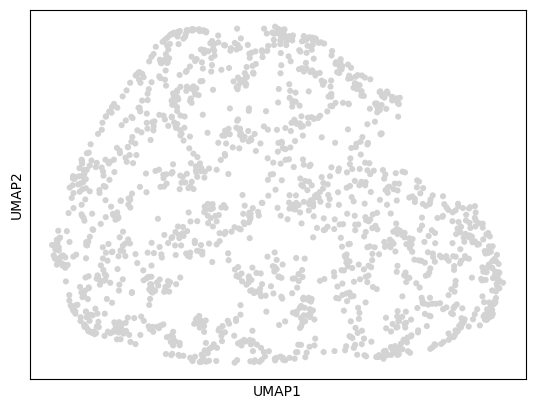

In [63]:
sc.pl.umap(data_train_norm, neighbors_key="nmd_norm_r3")

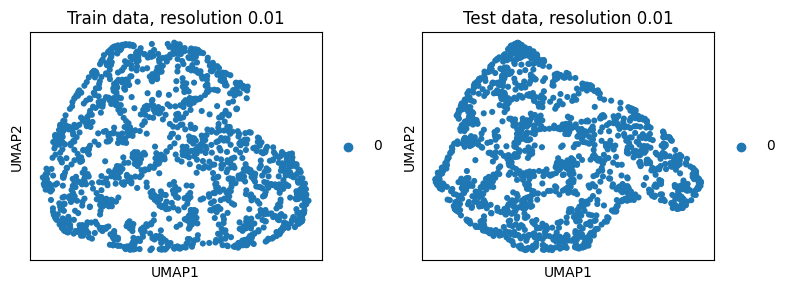

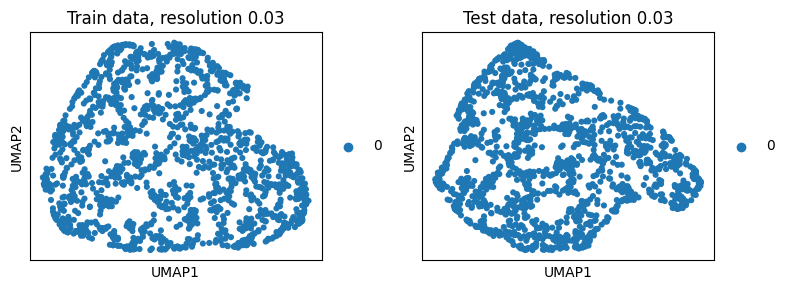

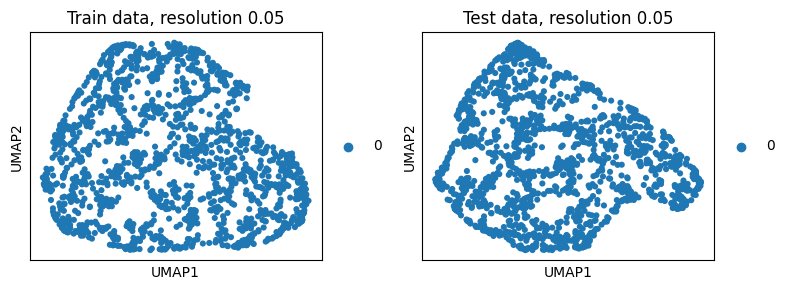

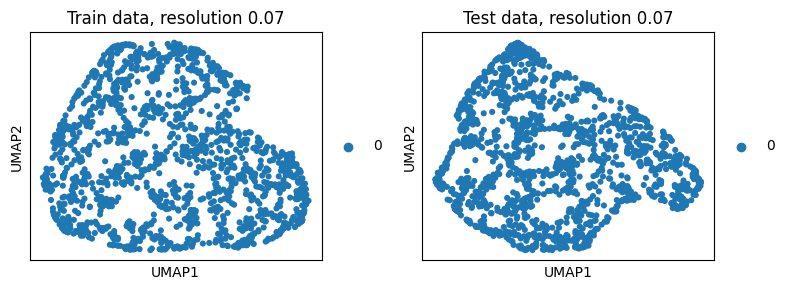

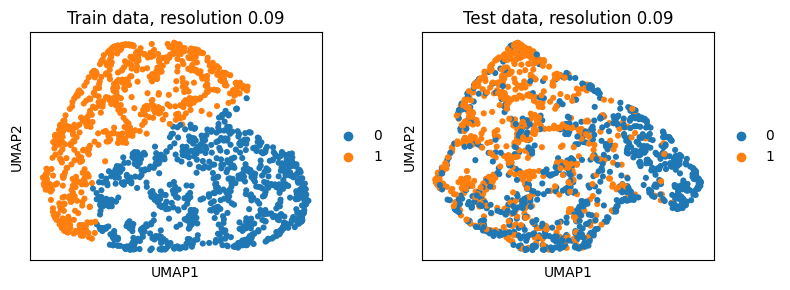

...

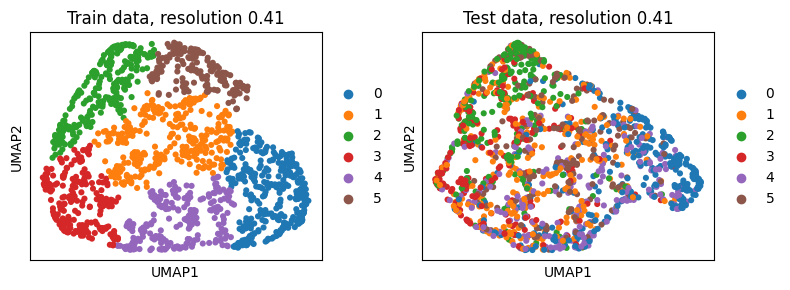

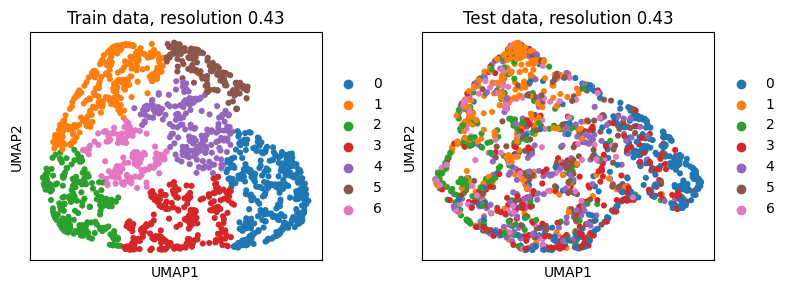

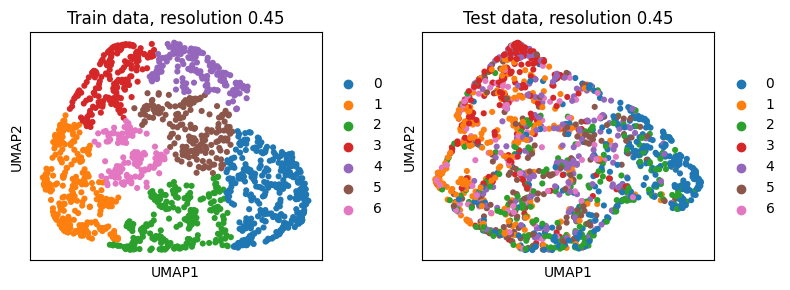

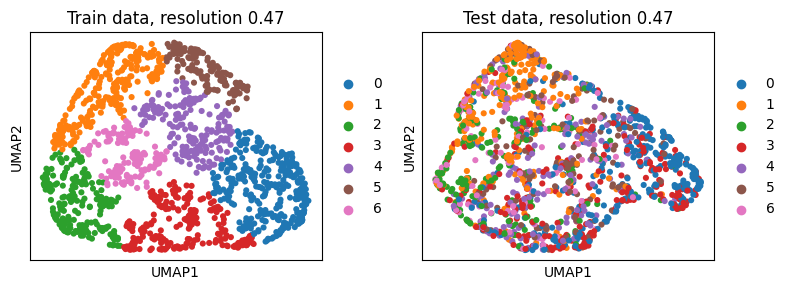

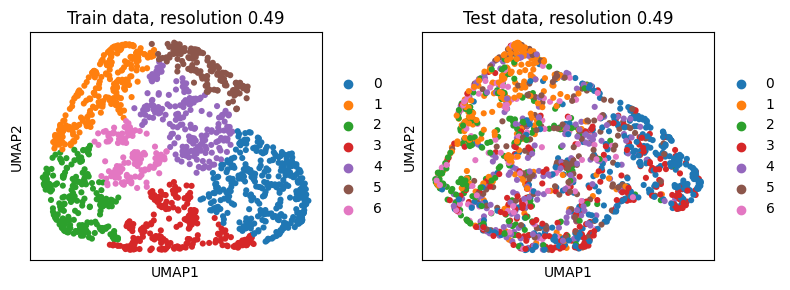

In [60]:
for resolution in resolutions:
    fig, ax = plt.subplots(1, 2, figsize=(8, 3))
    sc.pl.umap(data_train_norm, color=f"leiden_res{resolution}", ax=ax[0], 
               title=f"Train data, resolution {resolution}", show=False, 
               neighbors_key="nmd_norm_r3")
    sc.pl.embedding(data_test_norm, basis="X_umap_rotated", 
                    color=f"leiden_res{resolution}", 
                    ax=ax[1], title=f"Test data, resolution {resolution}", show=False, 
                    neighbors_key="nmd_norm_r3")
    ax[1].set_xlabel("UMAP1")
    ax[1].set_ylabel("UMAP2")
    plt.tight_layout()
    plt.show()

In [564]:
importlib.reload(co)
mod_df_norm_r3, mod_df_wide_norm_r3, res_opt_norm_r3 = co.find_optimal_clustering_resolution(
    data_train_norm, data_test_norm, resolutions, 
    neighbors_key="nmd_norm_r3")

print(f"Optimal resolution {res_opt_norm_r3}")

resolution: 0.01 - clusters: 1 - Train: 0.49 - Test: 0.49 - Random: 0.49
resolution: 0.03 - clusters: 1 - Train: 0.47 - Test: 0.47 - Random: 0.47
resolution: 0.05 - clusters: 1 - Train: 0.45 - Test: 0.45 - Random: 0.45
resolution: 0.07 - clusters: 1 - Train: 0.43 - Test: 0.43 - Random: 0.43
resolution: 0.09 - clusters: 2 - Train: 0.388 - Test: 0.269 - Random: 0.205
resolution: 0.11 - clusters: 3 - Train: 0.372 - Test: 0.202 - Random: 0.14
resolution: 0.13 - clusters: 3 - Train: 0.373 - Test: 0.184 - Random: 0.125
resolution: 0.15 - clusters: 3 - Train: 0.363 - Test: 0.182 - Random: 0.117
resolution: 0.17 - clusters: 3 - Train: 0.356 - Test: 0.175 - Random: 0.11
resolution: 0.19 - clusters: 3 - Train: 0.349 - Test: 0.169 - Random: 0.103
resolution: 0.21 - clusters: 4 - Train: 0.334 - Test: 0.143 - Random: 0.08
resolution: 0.23 - clusters: 4 - Train: 0.329 - Test: 0.139 - Random: 0.074
resolution: 0.25 - clusters: 4 - Train: 0.322 - Test: 0.125 - Random: 0.066
resolution: 0.27 - clusters

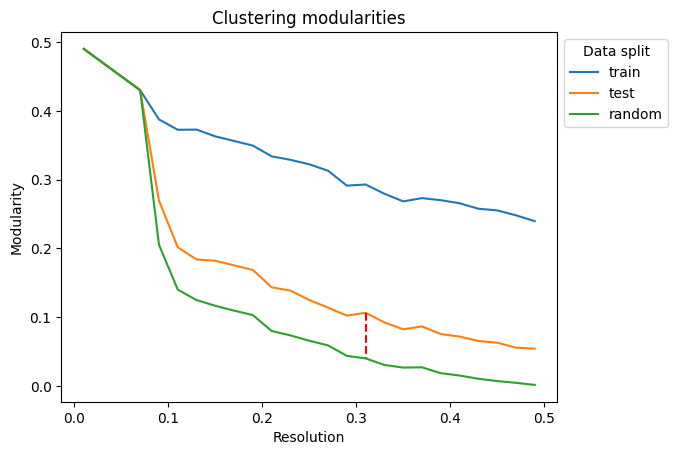

In [565]:
fig, ax = plt.subplots() 
sns.lineplot(data=mod_df_norm_r3, x="resolution", y="score", hue="type")
ax.set(title="Clustering modularities", xlabel="Resolution", ylabel="Modularity")

ax.plot(
    [res_opt_norm_r3, res_opt_norm_r3], 
    [mod_df_norm_r3[(mod_df_norm_r3["resolution"] == res_opt_norm_r3) & (mod_df_norm_r3["type"] == "test")]["score"],
      mod_df_norm_r3[(mod_df_norm_r3["resolution"] == res_opt_norm_r3) & (mod_df_norm_r3["type"] == "random")]["score"]],
    linestyle="dashed", color="red"
)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
ax.legend_.set_title("Data split")

plt.savefig(fig_path_rank3_norm_nmd + "modularities_plot_nmd_norm_r3_NMDCluster.svg", format="svg")
plt.show()

In [566]:
sc.tl.leiden(data, resolution=res_opt_norm_r3, key_added="nmd_norm_r3_leiden_opt", 
             neighbors_key="nmd_norm_r3")

In [567]:
data.obsm.keys()

KeysView(AxisArrays with keys: X_nmd_counts_k2, X_nmd_norm_k1, X_nmd_norm_k2, X_pca, X_umap, X_nmd_counts_r2, X_nmd_norm_r1, X_nmd_norm_r3)

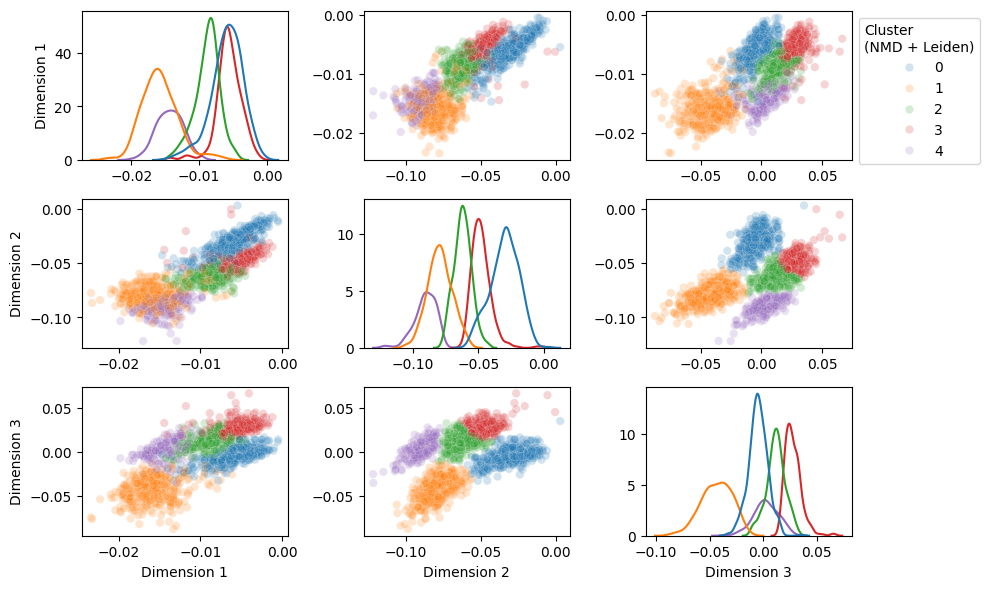

In [78]:
embeddings_2_plot = data.obsm["X_nmd_norm_r3"]
_, p = embeddings_2_plot.shape

fig, axs = plt.subplots(p, p, figsize=[10, 6], sharex=False) 

hist_y_lim = [0, 250]
hist_bins = 20

scatter_lim = [embeddings_2_plot.min() - 0.01, embeddings_2_plot.max() + 0.01]
scatter_alpha = 0.2

scatter_hue = data.obs["nmd_norm_r3_leiden_opt"]
#scatter_hue = data.obs["total_counts"]
#scatter_hue = None


for i, row in enumerate(axs):
    for j, axis in enumerate(row):
        if i == j: # histogram
            #sns.histplot(embeddings_2_plot[:,i:(i+1)], ax=axis, legend=False, bins=hist_bins)
            sns.kdeplot(x=embeddings_2_plot[:,i:(i+1)].flatten(), ax=axis, legend=False, hue=scatter_hue)
        else:
            use_legend = (i == 0 and j == (p - 1)) and (scatter_hue is not None)
            sns.scatterplot(
                y=embeddings_2_plot[:,i:(i+1)].flatten(), 
                x=embeddings_2_plot[:,j:(j+1)].flatten(), 
                alpha=scatter_alpha,
                hue = scatter_hue,
                ax=axis, legend=use_legend,
            )
            if use_legend:
                sns.move_legend(axis, "upper left", bbox_to_anchor=(1, 1))
                axis.legend_.set_title("Cluster\n(NMD + Leiden)")
        if j == 0:
            axis.set_ylabel(f"Dimension {i + 1}")
        else: 
            axis.set_ylabel(None)
        if i == len(row)-1:
            axis.set_xlabel(f"Dimension {j + 1}")
        else:
            axis.set_xlabel(None)

plt.tight_layout()


plt.savefig(fig_path_rank3_norm_nmd + "embedding_plot_nmd_norm_r3_hueNMDCluster_diagKDE.svg", format="svg")
plt.show()            

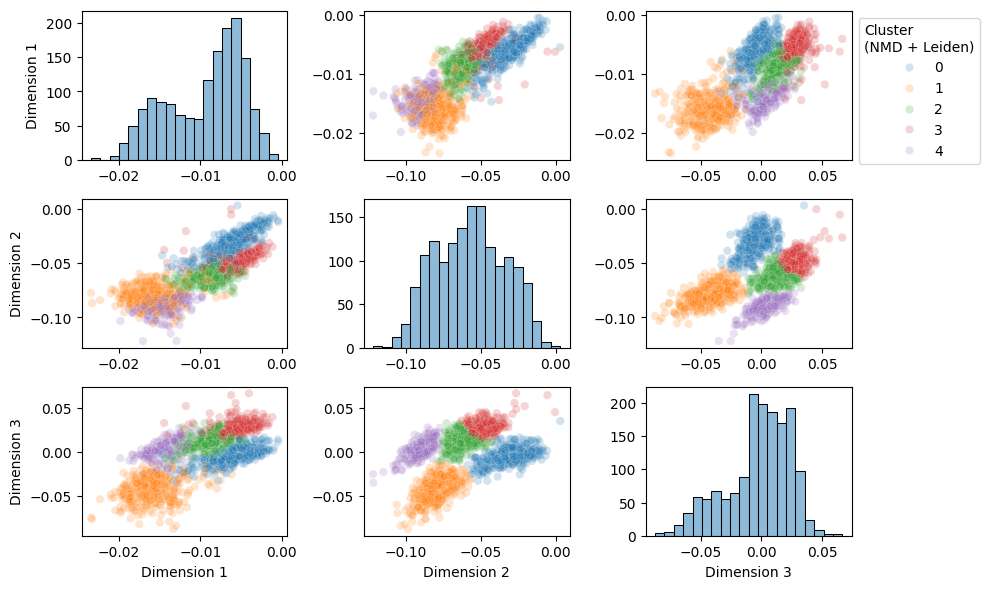

In [602]:
embeddings_2_plot = data.obsm["X_nmd_norm_r3"]
_, p = embeddings_2_plot.shape

fig, axs = plt.subplots(p, p, figsize=[10, 6], sharex=False) 

hist_y_lim = [0, 250]
hist_bins = 20

scatter_lim = [embeddings_2_plot.min() - 0.01, embeddings_2_plot.max() + 0.01]
scatter_alpha = 0.2

scatter_hue = data.obs["nmd_norm_r3_leiden_opt"]
#scatter_hue = data.obs["total_counts"]
#scatter_hue = None


for i, row in enumerate(axs):
    for j, axis in enumerate(row):
        if i == j: # histogram
            sns.histplot(embeddings_2_plot[:,i:(i+1)], ax=axis, legend=False, bins=hist_bins)
        else:
            use_legend = (i == 0 and j == (p - 1)) and (scatter_hue is not None)
            sns.scatterplot(
                y=embeddings_2_plot[:,i:(i+1)].flatten(), 
                x=embeddings_2_plot[:,j:(j+1)].flatten(), 
                alpha=scatter_alpha,
                hue = scatter_hue,
                ax=axis, legend=use_legend,
            )
            if use_legend:
                sns.move_legend(axis, "upper left", bbox_to_anchor=(1, 1))
                axis.legend_.set_title("Cluster\n(NMD + Leiden)")
        if j == 0:
            axis.set_ylabel(f"Dimension {i + 1}")
        else: 
            axis.set_ylabel(None)
        if i == len(row)-1:
            axis.set_xlabel(f"Dimension {j + 1}")
        else:
            axis.set_xlabel(None)

plt.tight_layout()


plt.savefig(fig_path_rank3_norm_nmd + "embedding_plot_nmd_norm_r3_hueNMDCluster.svg", format="svg")
plt.show()            

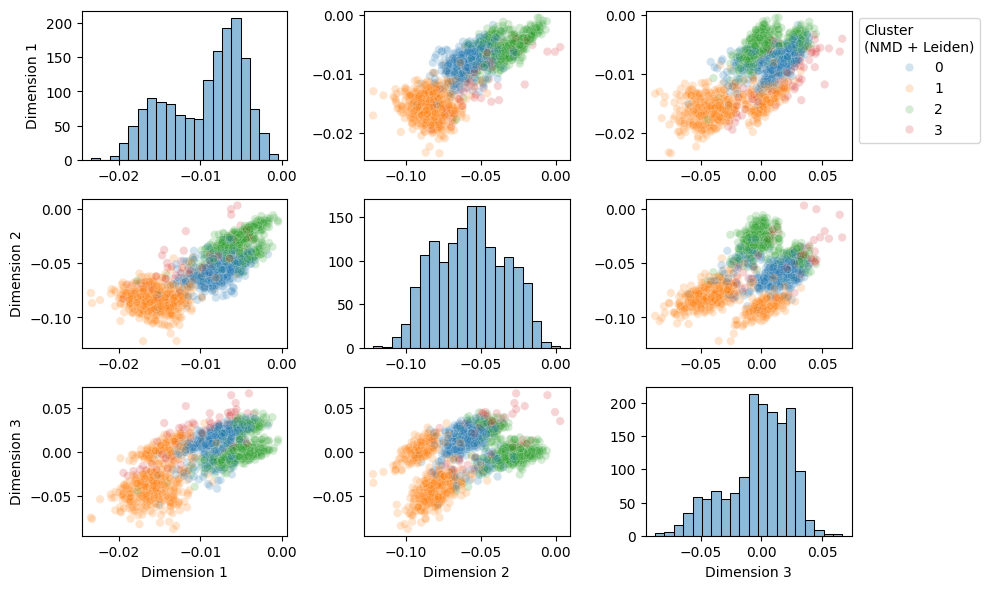

In [603]:
embeddings_2_plot = data.obsm["X_nmd_norm_r3"]
_, p = embeddings_2_plot.shape

fig, axs = plt.subplots(p, p, figsize=[10, 6], sharex=False) 

hist_y_lim = [0, 250]
hist_bins = 20

scatter_lim = [embeddings_2_plot.min() - 0.01, embeddings_2_plot.max() + 0.01]
scatter_alpha = 0.2

scatter_hue = data.obs["pca_leiden_opt"]
#scatter_hue = data.obs["total_counts"]
#scatter_hue = None


for i, row in enumerate(axs):
    for j, axis in enumerate(row):
        if i == j: # histogram
            sns.histplot(embeddings_2_plot[:,i:(i+1)], ax=axis, legend=False, bins=hist_bins)
        else:
            use_legend = (i == 0 and j == (p - 1)) and (scatter_hue is not None)
            sns.scatterplot(
                y=embeddings_2_plot[:,i:(i+1)].flatten(), 
                x=embeddings_2_plot[:,j:(j+1)].flatten(), 
                alpha=scatter_alpha,
                hue = scatter_hue,
                ax=axis, legend=use_legend,
            )
            if use_legend:
                sns.move_legend(axis, "upper left", bbox_to_anchor=(1, 1))
                axis.legend_.set_title("Cluster\n(PCA + Leiden)")
        if j == 0:
            axis.set_ylabel(f"Dimension {i + 1}")
        else: 
            axis.set_ylabel(None)
        if i == len(row)-1:
            axis.set_xlabel(f"Dimension {j + 1}")
        else:
            axis.set_xlabel(None)

plt.tight_layout()

plt.show()            

In [125]:
scatter_lim

[-0.13175174085161062, 0.07647707424806056]

In [12]:
data.obs.keys()

Index(['n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts',
       'log1p_total_counts', 'outlier', 'n_genes', 'total_counts_norm',
       'total_counts_scale', 'embedding_reliability', 'reliability_score',
       'null_reliability_score', 'pca_leiden_opt', 'nmd_counts_leiden_opt',
       'nmd_norm_r3_leiden_opt'],
      dtype='object')

In [16]:
data.obsm.keys()

KeysView(AxisArrays with keys: X_nmd_counts_k2, X_nmd_counts_r2, X_nmd_norm_k1, X_nmd_norm_k2, X_nmd_norm_r1, X_nmd_norm_r3, X_pca, X_umap)

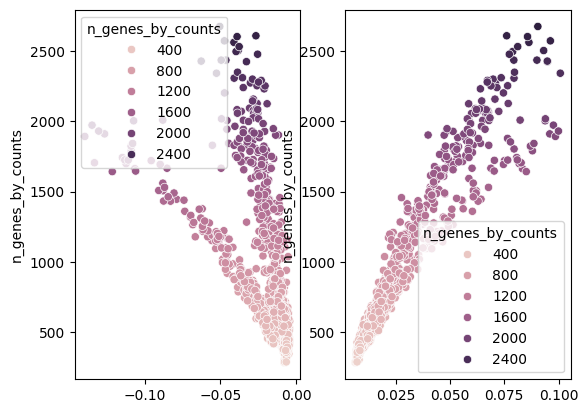

In [22]:
fig, (ax1, ax2) = plt.subplots(1, 2)
sns.scatterplot(x=data.obsm["X_nmd_counts_k2"][:,:1].flatten(), 
                y=data.obs["n_genes_by_counts"], 
                hue=data.obs["n_genes_by_counts"], ax=ax1)
sns.scatterplot(x=data.obsm["X_nmd_counts_k2"][:,1:2].flatten(), 
                y=data.obs["n_genes_by_counts"], 
                hue=data.obs["n_genes_by_counts"], ax=ax2)
plt.show()

<Axes: xlabel='n_genes_by_counts', ylabel='Density'>

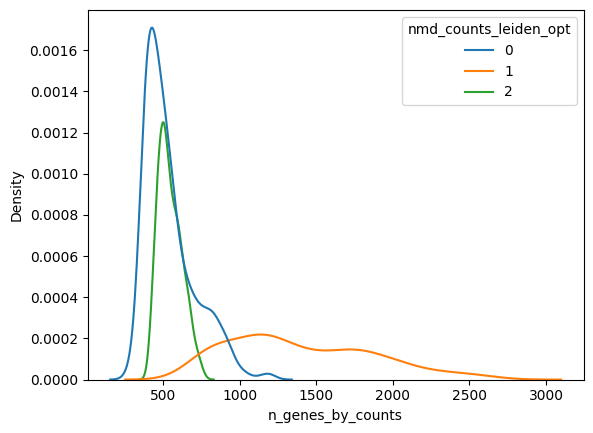

In [15]:
sns.kdeplot(x=data.obs["n_genes_by_counts"], hue=data.obs["nmd_counts_leiden_opt"])

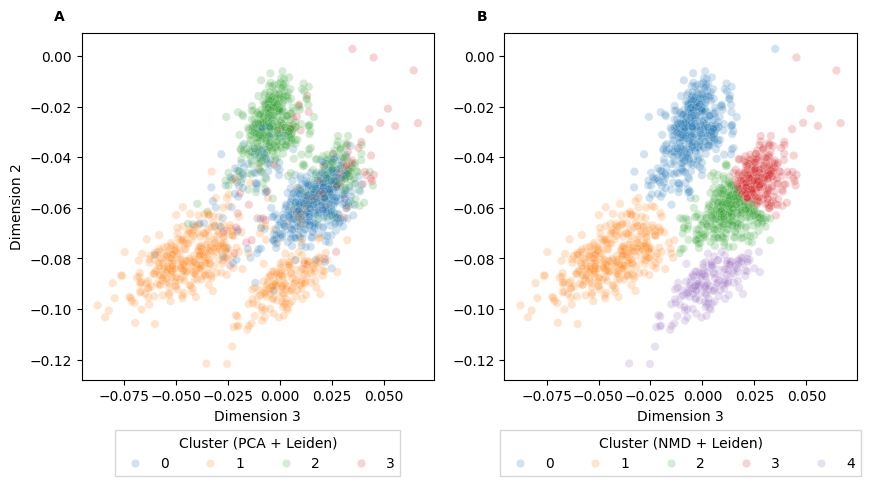

In [165]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=[10, 5])
sns.scatterplot(
                y=data.obsm["X_nmd_norm_r3"][:,1:2].flatten(), 
                x=data.obsm["X_nmd_norm_r3"][:,2:3].flatten(), 
                alpha=scatter_alpha,
                hue = data.obs["pca_leiden_opt"],
                ax=ax1, legend=True,
            )
sns.move_legend(ax1, "upper left", bbox_to_anchor=(1, 1))
ax1.set_xlabel(f"Dimension 3")
ax1.set_ylabel(f"Dimension 2")

trans = mtransforms.ScaledTranslation(-20/72, 7/72, fig.dpi_scale_trans)
ax1.text(0.0, 1.0, "A", transform=ax1.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")

box1 = ax1.get_position()
ax1.set_position([box1.x0, box1.y0 + box1.height * 0.1,
                 box1.width, box1.height * 0.9])
ax1.legend(loc='upper center', bbox_to_anchor=(0.5, -0.125),
            fancybox=False, shadow=False, ncol=4)
ax1.legend_.set_title("Cluster (PCA + Leiden)")

sns.scatterplot(
                y=data.obsm["X_nmd_norm_r3"][:,1:2].flatten(), 
                x=data.obsm["X_nmd_norm_r3"][:,2:3].flatten(), 
                alpha=scatter_alpha,
                hue = data.obs["nmd_norm_r3_leiden_opt"],
                ax=ax2, legend=True,
            )
ax2.set_xlabel(f"Dimension 3")


trans = mtransforms.ScaledTranslation(-20/72, 7/72, fig.dpi_scale_trans)
ax2.text(0.0, 1.0, "B", transform=ax2.transAxes + trans,
         fontsize='medium', va='bottom', fontweight="bold")

box2 = ax2.get_position()
ax2.set_position([box2.x0, box2.y0 + box2.height * 0.1,
                 box2.width, box2.height * 0.9])
ax2.legend(loc='upper center', bbox_to_anchor=(0.5, -0.125),
            fancybox=False, shadow=False, ncol=5)
ax2.legend_.set_title("Cluster (NMD + Leiden)")

plt.savefig(fig_path_rank3_norm_nmd + "embedding_dim2_vs_dim3_NMD_vs_PCA_cluster.svg", format="svg")

plt.show()

In [83]:
pd.DataFrame(data.obsm["X_nmd_norm_r3"]).corr()

,0,1,2
0,1.000000,0.822242,0.675376
1,0.822242,1.000000,0.401311
2,0.675376,0.401311,1.000000


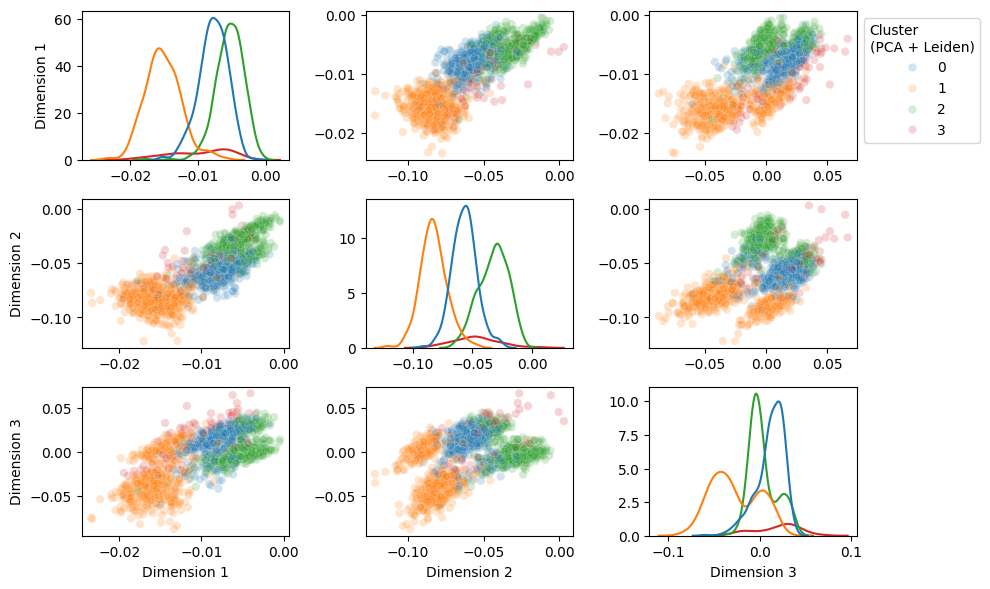

In [77]:
embeddings_2_plot = data.obsm["X_nmd_norm_r3"]
_, p = embeddings_2_plot.shape

fig, axs = plt.subplots(p, p, figsize=[10, 6], sharex=False) 

hist_y_lim = [0, 250]
hist_bins = 20

scatter_lim = [embeddings_2_plot.min() - 0.01, embeddings_2_plot.max() + 0.01]
scatter_alpha = 0.2

scatter_hue = data.obs["pca_leiden_opt"]
#scatter_hue = data.obs["total_counts"]
#scatter_hue = None


for i, row in enumerate(axs):
    for j, axis in enumerate(row):
        if i == j: # histogram
            #sns.histplot(embeddings_2_plot[:,i:(i+1)], ax=axis, legend=False, bins=hist_bins)
            sns.kdeplot(x=embeddings_2_plot[:,i:(i+1)].flatten(), ax=axis, legend=False, hue=scatter_hue)
        else:
            use_legend = (i == 0 and j == (p - 1)) and (scatter_hue is not None)
            sns.scatterplot(
                y=embeddings_2_plot[:,i:(i+1)].flatten(), 
                x=embeddings_2_plot[:,j:(j+1)].flatten(), 
                alpha=scatter_alpha,
                hue = scatter_hue,
                ax=axis, legend=use_legend,
            )
            if use_legend:
                sns.move_legend(axis, "upper left", bbox_to_anchor=(1, 1))
                axis.legend_.set_title("Cluster\n(PCA + Leiden)")
        if j == 0:
            axis.set_ylabel(f"Dimension {i + 1}")
        else: 
            axis.set_ylabel(None)
        if i == len(row)-1:
            axis.set_xlabel(f"Dimension {j + 1}")
        else:
            axis.set_xlabel(None)

plt.tight_layout()

plt.savefig(fig_path_rank3_norm_nmd + "embedding_plot_nmd_norm_r3_huePCACluster_diagKDE.svg", format="svg")

plt.show()            

In [72]:
data

AnnData object with n_obs × n_vars = 1544 × 5553
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'outlier', 'n_genes', 'total_counts_norm', 'total_counts_scale', 'embedding_reliability', 'reliability_score', 'null_reliability_score', 'pca_leiden_opt', 'nmd_counts_leiden_opt', 'nmd_norm_r3_leiden_opt'
    var: 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'var_counts', 'nb_mean', 'nb_overdisp', 'nb_overdisp_cutoff', 'nb_overdisp_cutoff_bfgs', 'nb_overdisp_bfgs', 'mean', 'std'
    uns: 'PCA', 'embedding_reliability_colors', 'nmd_counts_leiden_opt', 'nmd_counts_leiden_opt_colors', 'nmd_counts_r2', 'nmd_norm_r2', 'nmd_norm_r3', 'nmd_norm_r3_leiden_opt', 'nmd_norm_r3_leiden_opt_colors', 'pca', 'pca_leiden', 'pca_leiden_opt_colors', 'pca_neighbors', 'rank_genes_groups', 'umap'
    obsm: 'X_nmd_counts_k2', 'X_nmd_counts_r2', 'X_nmd_norm

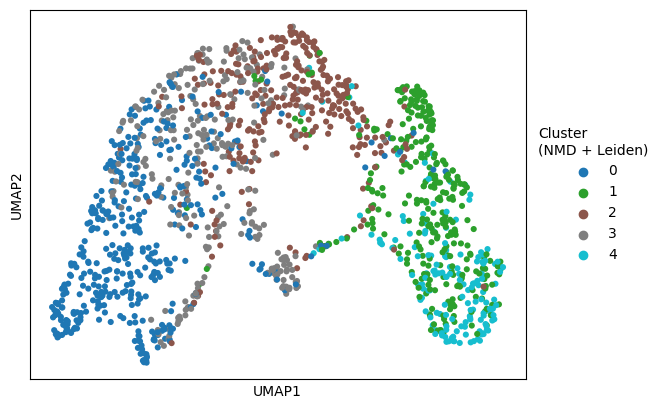

In [74]:
#fig, ax = plt.subplots()
pca_umap_nmd_norm_r3_NMDCluster = sc.pl.umap(
    data, color="nmd_norm_r3_leiden_opt", 
    palette="tab10", neighbors_key="nmd_norm_r3", return_fig=True, title="")
pca_umap_nmd_norm_r3_NMDCluster.axes[0].legend_.set_title("Cluster\n(NMD + Leiden)")
#plt.savefig(fig_path_rank3_norm_nmd + "nmd_umap_nmd_norm_r3_NMDCluster.svg", format="svg")

plt.show()

In [573]:
sc.pp.neighbors(data, n_neighbors=n_neighbors_opt_pca, 
                n_pcs=k_opt_pca, key_added="PCA")

sc.tl.umap(data, min_dist=min_dist_opt_pca, spread=1, 
           random_state=1234, neighbors_key="PCA")

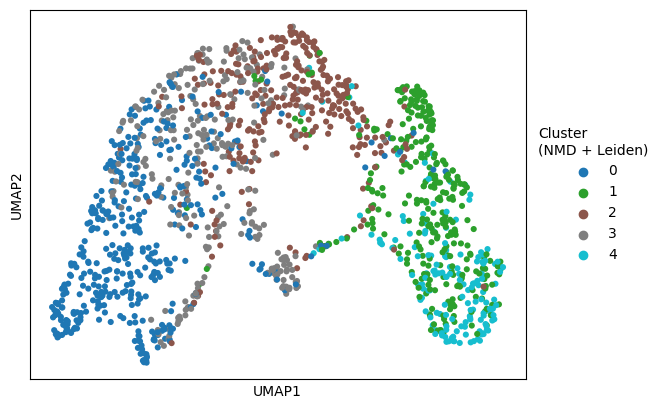

In [575]:
#fig, ax = plt.subplots()
pca_umap_nmd_norm_r3_NMDCluster = sc.pl.umap(
    data, color="nmd_norm_r3_leiden_opt", 
    palette="tab10", neighbors_key="PCA", return_fig=True, title="")
pca_umap_nmd_norm_r3_NMDCluster.axes[0].legend_.set_title("Cluster\n(NMD + Leiden)")
plt.savefig(fig_path_rank3_norm_nmd + "pca_umap_nmd_norm_r3_NMDCluster.svg", format="svg")

plt.show()

In [578]:
data.obs.keys()

Index(['n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts',
       'log1p_total_counts', 'outlier', 'n_genes', 'total_counts_norm',
       'total_counts_scale', 'embedding_reliability', 'reliability_score',
       'null_reliability_score', 'pca_leiden_opt', 'nmd_counts_leiden_opt',
       'nmd_norm_r3_leiden_opt'],
      dtype='object')

In [95]:
from scipy.optimize import linear_sum_assignment

def sort_confusion_matrix(matrix):
    """
    Sort a non-quadratic confusion matrix along its diagonal.

    Parameters:
    matrix (pd.DataFrame): Confusion matrix generated by pd.crosstab

    Returns:
    pd.DataFrame: Sorted confusion matrix
    """
    
    matrix_np = matrix.to_numpy()
    row_ind, col_ind = linear_sum_assignment(matrix_np, maximize=True)
    sorted_matrix = matrix_np[row_ind, :][:, col_ind]
    sorted_matrix_df = pd.DataFrame(sorted_matrix, 
                                    index=matrix.index[row_ind], 
                                    columns=matrix.columns[col_ind])
    
    return sorted_matrix_df

In [104]:
crosstab_pca_vs_nmd_norm = pd.crosstab(data.obs["pca_leiden_opt"], data.obs["nmd_norm_r3_leiden_opt"])
conf_matrix_pca_vs_nmd_norm = sort_confusion_matrix(crosstab_pca_vs_nmd_norm)
conf_matrix_pca_vs_nmd_norm = pd.concat([conf_matrix_pca_vs_nmd_norm, crosstab_pca_vs_nmd_norm["4"]], axis=1)

In [105]:
conf_matrix_pca_vs_nmd_norm

,2,1,0,3,4
pca_leiden_opt,,,,,
0,272,17,64,158,6
1,25,299,7,1,150
2,17,3,356,95,0
3,8,9,14,40,3


In [176]:
print(conf_matrix_pca_vs_nmd_norm.T.to_latex())

\begin{tabular}{lrrrr}
\toprule
pca\_leiden\_opt &    0 &    1 &    2 &   3 \\
\midrule
2 &  272 &   25 &   17 &   8 \\
1 &   17 &  299 &    3 &   9 \\
0 &   64 &    7 &  356 &  14 \\
3 &  158 &    1 &   95 &  40 \\
4 &    6 &  150 &    0 &   3 \\
\bottomrule
\end{tabular}



In [174]:
crosstab_pca_vs_nmd_norm_rel = pd.crosstab(data.obs["pca_leiden_opt"], data.obs["nmd_norm_r3_leiden_opt"], normalize="index")
conf_matrix_pca_vs_nmd_norm_rel = sort_confusion_matrix(crosstab_pca_vs_nmd_norm_rel)
conf_matrix_pca_vs_nmd_norm_rel = pd.concat([conf_matrix_pca_vs_nmd_norm_rel, crosstab_pca_vs_nmd_norm_rel["4"]], axis=1)
conf_matrix_pca_vs_nmd_norm_rel = conf_matrix_pca_vs_nmd_norm_rel.round(4)*100
print(conf_matrix_pca_vs_nmd_norm_rel.to_latex())

\begin{tabular}{lrrrrr}
\toprule
{} &      2 &      1 &      0 &      3 &      4 \\
pca\_leiden\_opt &        &        &        &        &        \\
\midrule
0              &  52.61 &   3.29 &  12.38 &  30.56 &   1.16 \\
1              &   5.19 &  62.03 &   1.45 &   0.21 &  31.12 \\
2              &   3.61 &   0.64 &  75.58 &  20.17 &   0.00 \\
3              &  10.81 &  12.16 &  18.92 &  54.05 &   4.05 \\
\bottomrule
\end{tabular}



In [179]:
crosstab_pca_vs_nmd_norm_rel_columnwise = pd.crosstab(data.obs["pca_leiden_opt"], data.obs["nmd_norm_r3_leiden_opt"], normalize="columns")
conf_matrix_pca_vs_nmd_norm_rel_columnwise = sort_confusion_matrix(crosstab_pca_vs_nmd_norm_rel_columnwise)


conf_matrix_pca_vs_nmd_norm_rel_columnwise = pd.concat([conf_matrix_pca_vs_nmd_norm_rel_columnwise, crosstab_pca_vs_nmd_norm_rel_columnwise["4"]], axis=1)
conf_matrix_pca_vs_nmd_norm_rel_columnwise = conf_matrix_pca_vs_nmd_norm_rel_columnwise.round(4)*100
print(conf_matrix_pca_vs_nmd_norm_rel_columnwise.to_latex())

nmd_norm_r3_leiden_opt,2,4,0,3
pca_leiden_opt,,,,
0,0.844720,0.037736,0.145125,0.537415
1,0.077640,0.943396,0.015873,0.003401
2,0.052795,0.000000,0.807256,0.323129
3,0.024845,0.018868,0.031746,0.136054


In [180]:
crosstab_pca_vs_nmd_norm_rel_columnwise

nmd_norm_r3_leiden_opt,0,1,2,3,4
pca_leiden_opt,,,,,
0,0.145125,0.051829,0.844720,0.537415,0.037736
1,0.015873,0.911585,0.077640,0.003401,0.943396
2,0.807256,0.009146,0.052795,0.323129,0.000000
3,0.031746,0.027439,0.024845,0.136054,0.018868


In [182]:
data.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 1544 × 5553
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'outlier', 'n_genes', 'total_counts_norm', 'total_counts_scale', 'embedding_reliability', 'reliability_score', 'null_reliability_score', 'pca_leiden_opt', 'nmd_counts_leiden_opt', 'nmd_norm_r3_leiden_opt'
    var: 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'var_counts', 'nb_mean', 'nb_overdisp', 'nb_overdisp_cutoff', 'nb_overdisp_cutoff_bfgs', 'nb_overdisp_bfgs', 'mean', 'std'
    uns: 'PCA', 'embedding_reliability_colors', 'nmd_counts_leiden_opt', 'nmd_counts_leiden_opt_colors', 'nmd_counts_r2', 'nmd_norm_r2', 'nmd_norm_r3', 'nmd_norm_r3_leiden_opt', 'nmd_norm_r3_leiden_opt_colors', 'pca', 'pca_leiden', 'pca_leiden_opt_colors', 'pca_neighbors', 'rank_genes_groups', 'umap'
    obsm: 'X_nmd_counts_k

<Axes: ylabel='pca_leiden_opt'>

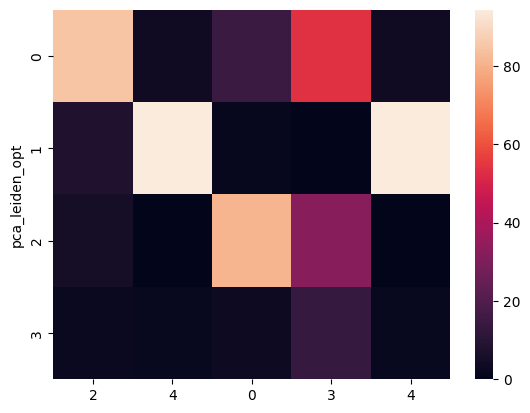

In [177]:
sns.heatmap(conf_matrix_pca_vs_nmd_norm_rel_columnwise)

In [112]:
crosstab_pca_vs_nmd_count = pd.crosstab(data.obs["pca_leiden_opt"], data.obs["nmd_counts_leiden_opt"])
conf_matrix_pca_vs_nmd_count = sort_confusion_matrix(crosstab_pca_vs_nmd_count)
#conf_matrix_pca_vs_nmd_count = pd.concat([conf_matrix_pca_vs_nmd_count, crosstab_pca_vs_nmd_count.iloc[3,:]], axis=0)
conf_matrix_pca_vs_nmd_count

nmd_counts_leiden_opt,0,2,1
pca_leiden_opt,,,
0,478,36,3
1,19,309,154
2,235,0,236


In [123]:
crosstab_pca_vs_nmd_count

nmd_counts_leiden_opt,0,1,2
pca_leiden_opt,,,
0,478,3,36
1,19,154,309
2,235,236,0
3,51,7,16


In [124]:
print(conf_matrix_pca_vs_nmd_count.to_latex())

\begin{tabular}{lrrr}
\toprule
nmd\_counts\_leiden\_opt &    0 &    2 &    1 \\
pca\_leiden\_opt &      &      &      \\
\midrule
0              &  478 &   36 &    3 \\
1              &   19 &  309 &  154 \\
2              &  235 &    0 &  236 \\
\bottomrule
\end{tabular}



In [119]:
crosstab_pca_vs_nmd_count

nmd_counts_leiden_opt,0,1,2
pca_leiden_opt,,,
0,478,3,36
1,19,154,309
2,235,236,0
3,51,7,16


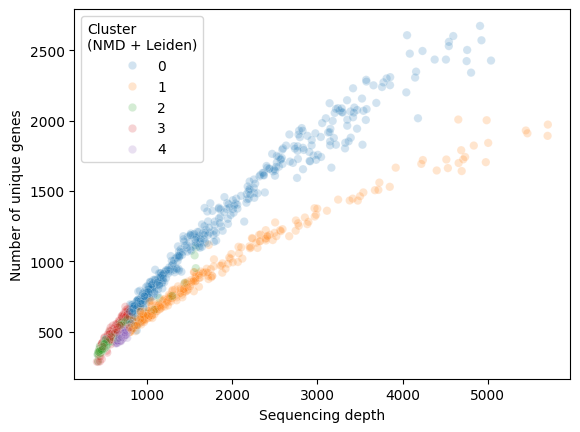

In [587]:
scatter_seqdepth_uniquegenes_hue_nmd_normr3_leidenopt = sns.scatterplot(
    x=data.obs["total_counts"], 
    y=data.obs["n_genes"], 
    hue=data.obs["nmd_norm_r3_leiden_opt"], 
    alpha = 0.2)
plt.ylabel("Number of unique genes")
plt.xlabel("Sequencing depth")
scatter_seqdepth_uniquegenes_hue_nmd_normr3_leidenopt.axes.legend_.set_title("Cluster\n(NMD + Leiden)")

plt.savefig(fig_path_rank3_norm_nmd + "./scatter_seqdepth_uniquegenes_hue_nmd_normr3_leidenopt.svg", format="svg")

plt.show()

In [589]:
sc.tl.rank_genes_groups(data, 'nmd_norm_r3_leiden_opt', method='wilcoxon')

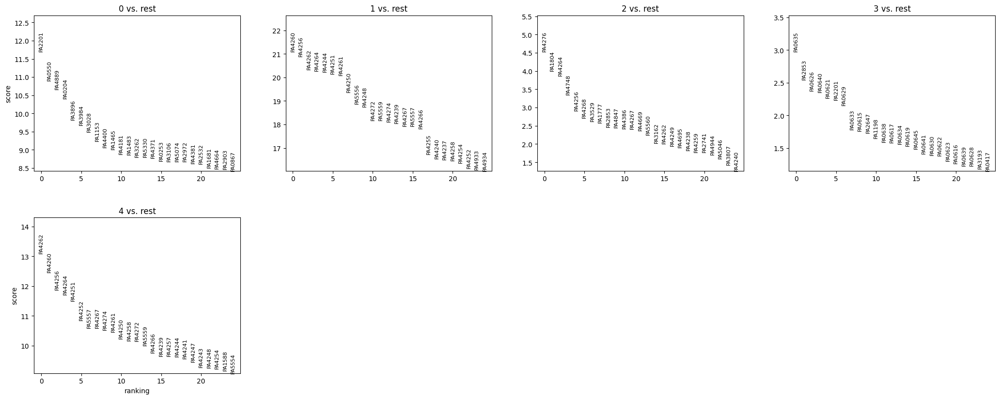

In [591]:
sc.pl.rank_genes_groups(data, n_genes=25, sharey=False)

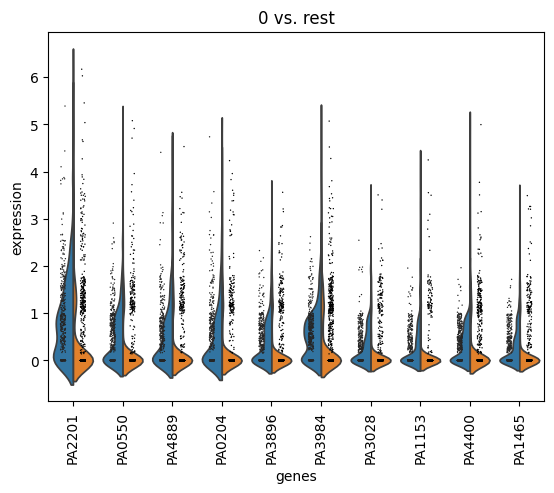

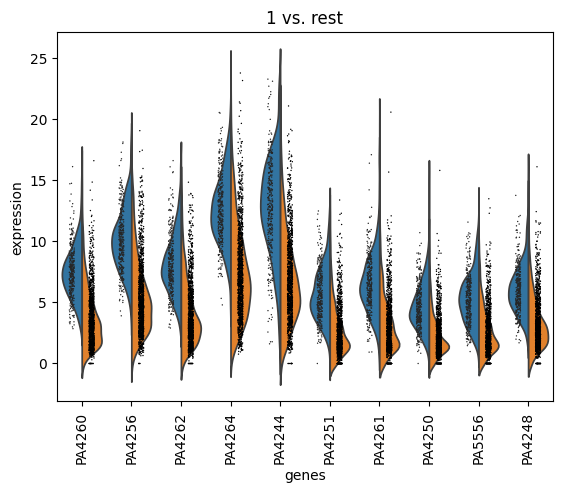

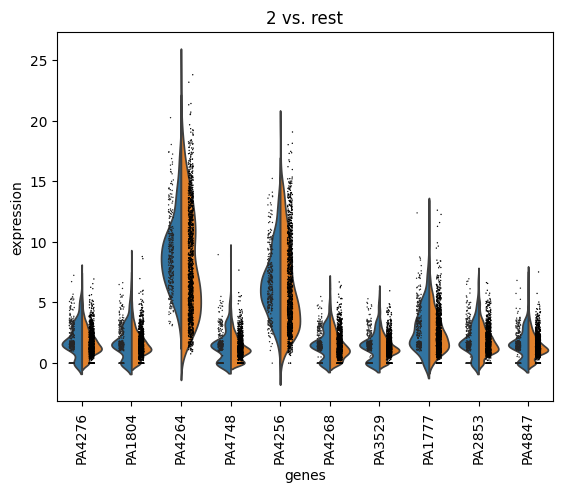

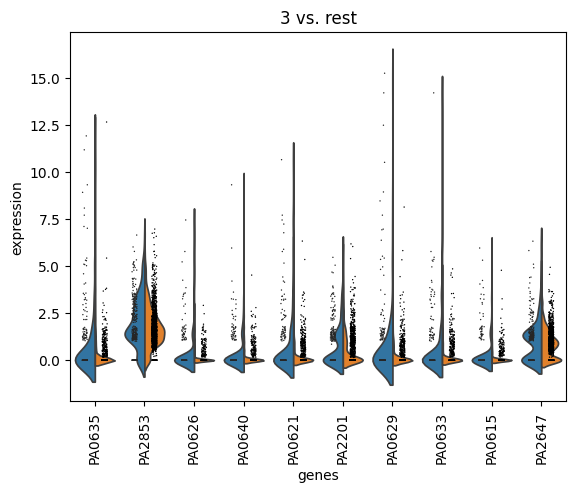

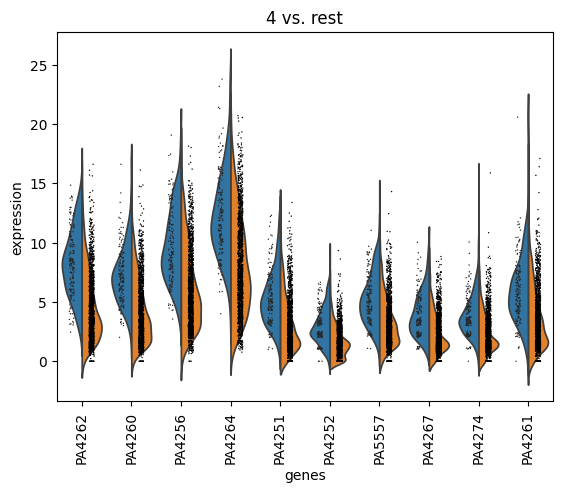

In [590]:
nclust_norm_r3 = len(np.unique(data.obs["nmd_norm_r3_leiden_opt"]))

for i in range(nclust_norm_r3):
    sc.pl.rank_genes_groups_violin(data, groups=str(i), n_genes=10)

In [595]:
data.write_h5ad("./S3_NMD_finished.h5ad")

In [6]:
data.obs.keys()

Index(['n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts',
       'log1p_total_counts', 'outlier', 'n_genes', 'total_counts_norm',
       'total_counts_scale', 'embedding_reliability', 'reliability_score',
       'null_reliability_score', 'pca_leiden_opt', 'nmd_counts_leiden_opt',
       'nmd_norm_r3_leiden_opt'],
      dtype='object')

In [30]:
data.obs["X_nmd_norm_r1"] = data.obsm["X_nmd_norm_r1"].flatten()
data.obs["X_pca_dim1"] = data.obsm["X_pca"][:,0:1].flatten()

In [29]:
data.obsm.keys()

KeysView(AxisArrays with keys: X_nmd_counts_k2, X_nmd_counts_r2, X_nmd_norm_k1, X_nmd_norm_k2, X_nmd_norm_r1, X_nmd_norm_r3, X_pca, X_umap)

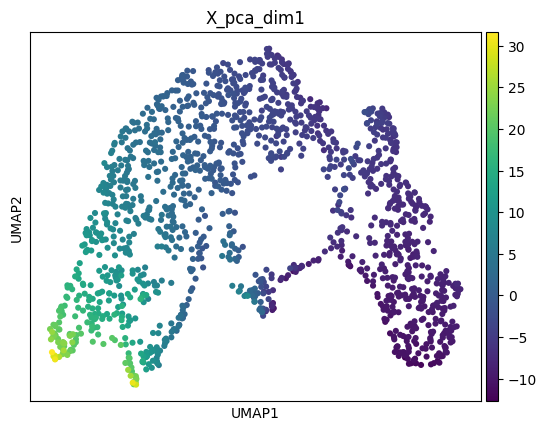

In [31]:
sc.pl.umap(data, color="X_pca_dim1", return_fig=False, palette="inferno")

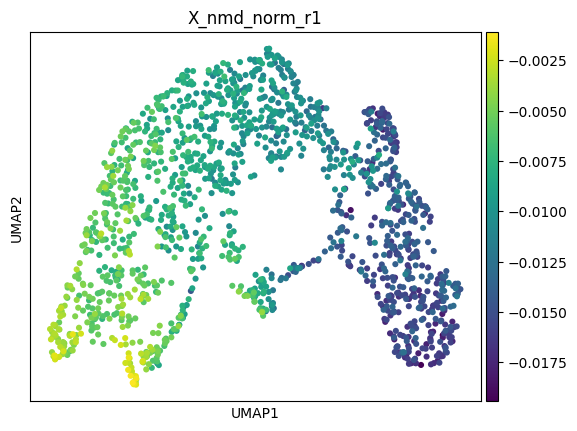

In [28]:
sc.pl.umap(data, color="X_nmd_norm_r1", return_fig=False, palette="inferno")

In [ ]:
umap_pca_leiden_opt = sc.pl.umap(data, color="pca_leiden_opt", return_fig=True, palette=sns.color_palette("tab10"))
ax = umap_pca_leiden_opt.axes[0]
ax.legend_.set_title("Clusters\n(PCA + Leiden)")
ax.set_title(None)

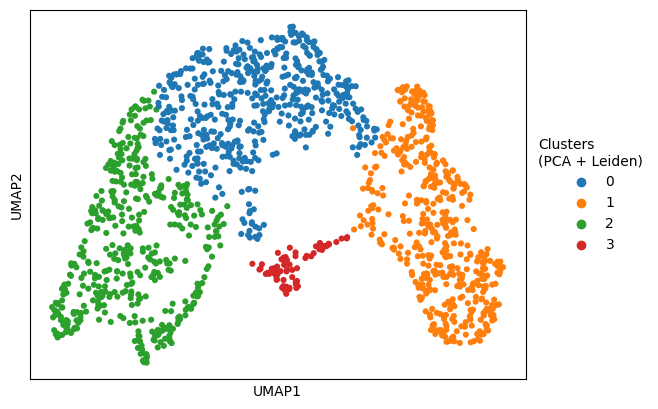

In [23]:
umap_pca_leiden_opt = sc.pl.umap(data, color="pca_leiden_opt", return_fig=True, palette=sns.color_palette("tab10"))
ax = umap_pca_leiden_opt.axes[0]
ax.legend_.set_title("Clusters\n(PCA + Leiden)")
ax.set_title(None)
plt.savefig("./pca_umap_pca_cluster.svg")

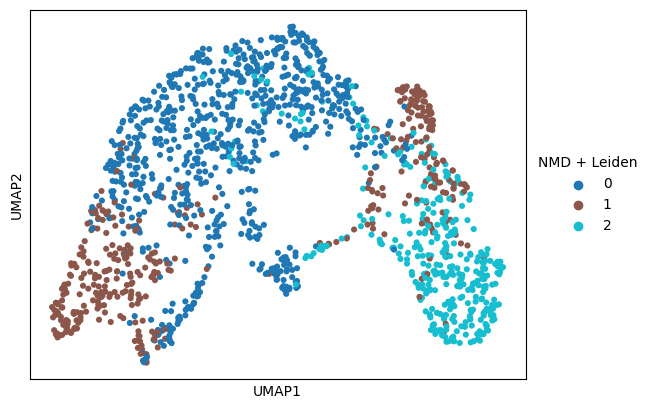

In [12]:
umap_pca_nmd_counts_leiden_opt = sc.pl.umap(data, color="nmd_counts_leiden_opt", return_fig=True)
ax = umap_pca_nmd_counts_leiden_opt.axes[0]
ax.legend_.set_title("NMD + Leiden")
ax.set_title(None)
plt.savefig("./pca_umap_nmd_counts_cluster.svg")

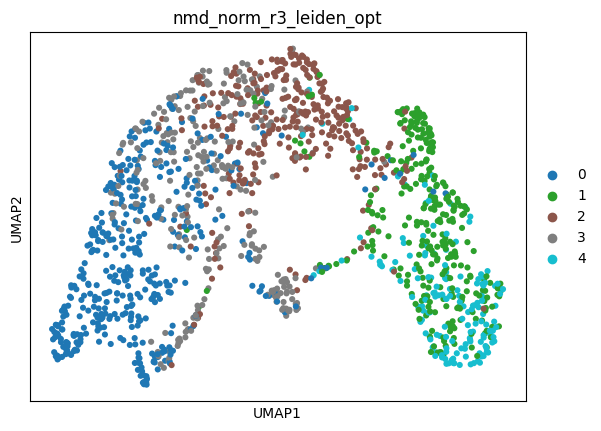

In [8]:
umap_pca_nmd_norm_leiden_opt = sc.pl.umap(data, color="nmd_norm_r3_leiden_opt")
ax = umap_pca_nmd_norm_leiden_opt.axes[0]
ax.legend_.set_title("NMD + Leiden")
ax.set_title(None)